# KoGES GOUT Modeling (After Imputation)

## Import Module

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [98]:
sklearn.__version__

'1.3.2'

In [100]:
xgboost.__version__

'2.0.3'

In [99]:
lightgbm.__version__

'4.3.0'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import os
import random

# 사용하는 module
import sklearn
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score

# xgboost
import xgboost
from xgboost import XGBClassifier
import lightgbm
from lightgbm import LGBMClassifier

from numpy import random
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import matplotlib as mpl # rcParams 지정 위함

In [3]:
import dill
dill.load_session('./KoGES_Gout_Modeling_AfImp_env_chg.db')

In [ ]:
import pickle
xgb_AfImp_pkl = pd.read_pickle("./output_file/xgboost_AfImp_variable_chg.pickle")

## Function

In [156]:
# 성비 맞춰서 Downsampling 하는 코드
def DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(DF, nGt_sample_size, seed_num):
    # Gout, nonGout sample data 분리
    Gt_Male = DF[(DF["DISEASE"] == 1) & (DF["SEX"] == 1)]
    Gt_Female = DF[(DF["DISEASE"] == 1) & (DF["SEX"] == 2)]
    nGt_Male = DF[(DF["DISEASE"] == 0) & (DF["SEX"] == 1)]
    nGt_Female = DF[(DF["DISEASE"] == 0) & (DF["SEX"] == 2)]

    # print("Gout Male Total :", Gt_Male.shape, "Gout Female Total :", Gt_Female.shape)
    # print("nonGout Male Total :", nGt_Male.shape, "nonGout Female Total :", nGt_Female.shape)

    # Gout sample의 성비 계산
    gender_proportion = Gt_Male.shape[0] / Gt_Female.shape[0]
    # print("Gout Gender proportion :", gender_proportion)

    nGt_female_select_size = int(round(nGt_sample_size / (1+gender_proportion), 0))
    nGt_male_select_size = int(round(nGt_female_select_size * gender_proportion, 0)) + 1 # 총합 650 맞춰주기 위해 +1 추가
    # print("nonGout Female selection : %s ==== nonGout Male selection : %s" %(nGt_female_select_size, nGt_male_select_size))

    # randomly nonGout Down Sampling
    np.random.seed(seed_num) # random seed 입력
    
    nGt_Male_idx = list(nGt_Male.index) # 
    nGt_Female_idx = list(nGt_Female.index)
    
    select_nGt_Male_idx = np.random.choice(nGt_Male_idx, nGt_male_select_size, replace = False).tolist()
    select_nGt_Female_idx = np.random.choice(nGt_Female_idx, nGt_female_select_size, replace = False).tolist()
    
    nGt_Male_select_data = nGt_Male.loc[select_nGt_Male_idx, :]
    nGt_Female_select_data = nGt_Female.loc[select_nGt_Female_idx, :]

    # Gt Male, Gt_Female, nGt_Male, nGt_Female 각각 데이터를 9:1로 분할
    # Train Test set split
    Gt_Male_Train, Gt_Male_Test = train_test_split(Gt_Male, test_size = 0.1, random_state = seed_num)
    Gt_Female_Train, Gt_Female_Test = train_test_split(Gt_Female, test_size = 0.1, random_state = seed_num)
    nGt_Male_Train, nGt_Male_Test = train_test_split(nGt_Male_select_data, test_size = 0.1, random_state = seed_num)
    nGt_Female_Train, nGt_Female_Test = train_test_split(nGt_Female_select_data, test_size = 0.1, random_state = seed_num)

    # print("Gout Male Train, Test size :", Gt_Male_Train.shape, Gt_Male_Test.shape)
    # print("Gout Female Train, Test size :", Gt_Female_Train.shape, Gt_Female_Test.shape)
    # print("nonGout Male Train, Test size :", nGt_Male_Train.shape, nGt_Male_Test.shape)
    # print("nonGout Male Train, Test size :", nGt_Female_Train.shape, nGt_Female_Test.shape)
    
    # Train set Merge
    Gt_Train = pd.concat([Gt_Male_Train, Gt_Female_Train])
    nGt_Train = pd.concat([nGt_Male_Train, nGt_Female_Train])
    # print("Gout Train :", Gt_Train.shape, "nGt_Train :", nGt_Train.shape)
    Train_set = pd.concat([Gt_Train, nGt_Train])

    # Test set Merge
    Gt_Test = pd.concat([Gt_Male_Test, Gt_Female_Test])
    nGt_Test = pd.concat([nGt_Male_Test, nGt_Female_Test])
    # print("Gout Test :", Gt_Test.shape, "nGt_Test :", nGt_Test.shape)
    Test_set = pd.concat([Gt_Test, nGt_Test])

    return Train_set, Test_set

In [157]:
# Logistic Regression Iteraction Training
def Iter_Logistic(Input_data, Seed_List, Z_scale_condition, nonGout_samplesize):
    
# R에서 AUC 그릴 true, pred, prob 데이터프레임
    LR_true_df = pd.DataFrame()
    LR_pred_df = pd.DataFrame()
    LR_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    LR_auc_df = pd.DataFrame()

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        LR = LogisticRegression()
        LR.fit(X_TRAIN, y_TRAIN)

        y_pred = LR.predict(X_VAL)
        y_pred_proba = LR.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        LR_true_df = pd.concat((LR_true_df, y_VAL_concat), axis = 1, sort = False)
        LR_pred_df = pd.concat((LR_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        LR_prob_df = pd.concat((LR_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        LR_auc_df = pd.concat((LR_auc_df, pd.Series(auc_score)), axis = 1, sort = False)
        
    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    LR_true_df.columns = col_name_reset
    LR_pred_df.columns = col_name_reset
    LR_prob_df.columns = col_name_reset
    LR_auc_df.columns =col_name_reset

    return LR_true_df, LR_pred_df, LR_prob_df, LR_auc_df

In [158]:
# Logistic Regression Iteraction Training
def Iter_Logistic2(Input_data, Input_column, Seed_List, Z_scale_condition, nonGout_samplesize):
    
# R에서 AUC 그릴 true, pred, prob 데이터프레임
    LR_true_df = pd.DataFrame()
    LR_pred_df = pd.DataFrame()
    LR_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    LR_auc_df = pd.DataFrame()

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        # 학습에 사용할 column만 추출
        X_TRAIN = X_TRAIN.loc[:, Input_column]
        X_VAL = X_VAL.loc[:, Input_column]

        LR = LogisticRegression()
        LR.fit(X_TRAIN, y_TRAIN)

        y_pred = LR.predict(X_VAL)
        y_pred_proba = LR.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        LR_true_df = pd.concat((LR_true_df, y_VAL_concat), axis = 1, sort = False)
        LR_pred_df = pd.concat((LR_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        LR_prob_df = pd.concat((LR_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        LR_auc_df = pd.concat((LR_auc_df, pd.Series(auc_score)), axis = 1, sort = False)
        
    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    LR_true_df.columns = col_name_reset
    LR_pred_df.columns = col_name_reset
    LR_prob_df.columns = col_name_reset
    LR_auc_df.columns =col_name_reset

    return LR_true_df, LR_pred_df, LR_prob_df, LR_auc_df

In [159]:
# Random Forest Iteraction Training (PRS 합치기 전 단계)
def Iter_RandomForest(Input_data, Seed_List, Z_scale_condition, nonGout_samplesize):
    # 결과 저장 변수 생성

    # R에서 AUC 그릴 true, pred, prob 데이터프레임
    RF_true_df = pd.DataFrame()
    RF_pred_df = pd.DataFrame()
    RF_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    RF_auc_df = pd.DataFrame()
    
    # importance 결과 저장할 numpy array
    Imp_shape = Input_data.shape[1] - 1
    Ndarr_Importances = np.zeros(shape = Imp_shape)
    
    parameters = {"max_depth" : [3, 5, 7, 10], "min_samples_split" : [2, 3, 5, 7, 10],
                  "n_estimators" : [10, 50, 100, 150, 300]}
    # min_samples_leaf 제외

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()
    
        # GridSearch 
        RFC = RandomForestClassifier(random_state = seed)
        Grid_RF = GridSearchCV(RFC, param_grid = parameters, cv = 5, refit = True)
        Grid_RF.fit(X_TRAIN, y_TRAIN)
    
        Best_para_dict = Grid_RF.best_params_
        m_d = Best_para_dict["max_depth"]
        m_s_s = Best_para_dict["min_samples_split"]
        #m_s_l = Best_para_dict["min_samples_leaf"]
        n_e = Best_para_dict["n_estimators"]
    
        print(train_idx, Grid_RF.best_params_)
        train_idx += 1
    
        RFC_h = RandomForestClassifier(max_depth = m_d, min_samples_split = m_s_s,
                                     n_estimators = n_e, random_state = seed)
        RFC_h.fit(X_TRAIN, y_TRAIN)
    
        Importances = RFC_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = RFC_h.predict(X_VAL)
        y_pred_proba = RFC_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        RF_true_df = pd.concat((RF_true_df, y_VAL_concat), axis = 1, sort = False)
        RF_pred_df = pd.concat((RF_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        RF_prob_df = pd.concat((RF_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        RF_auc_df = pd.concat((RF_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    RF_true_df.columns = col_name_reset
    RF_pred_df.columns = col_name_reset
    RF_prob_df.columns = col_name_reset
    RF_auc_df.columns =col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return RF_true_df, RF_pred_df, RF_prob_df, RF_auc_df, Ndarr_Importances

In [160]:
# Random Forest Iteraction Training (PRS 합치기 전 단계)
def Iter_RandomForest2(Input_data, Input_column, Seed_List, Z_scale_condition, nonGout_samplesize):
    # 결과 저장 변수 생성

    # R에서 AUC 그릴 true, pred, prob 데이터프레임
    RF_true_df = pd.DataFrame()
    RF_pred_df = pd.DataFrame()
    RF_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    RF_auc_df = pd.DataFrame()
    
    # importance 결과 저장할 numpy array
    Imp_shape = len(Input_column)
    Ndarr_Importances = np.zeros(shape = Imp_shape)
    
    parameters = {"max_depth" : [3, 5, 7, 10], "min_samples_split" : [2, 3, 5, 7, 10],
                  "n_estimators" : [10, 50, 100, 150, 300]}
    # min_samples_leaf 제외

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        # 학습에 사용할 column만 추출
        X_TRAIN = X_TRAIN.loc[:, Input_column]
        X_VAL = X_VAL.loc[:, Input_column]
    
        # GridSearch 
        RFC = RandomForestClassifier(random_state = seed)
        Grid_RF = GridSearchCV(RFC, param_grid = parameters, cv = 5, refit = True)
        Grid_RF.fit(X_TRAIN, y_TRAIN)
    
        Best_para_dict = Grid_RF.best_params_
        m_d = Best_para_dict["max_depth"]
        m_s_s = Best_para_dict["min_samples_split"]
        #m_s_l = Best_para_dict["min_samples_leaf"]
        n_e = Best_para_dict["n_estimators"]
    
        print(train_idx, Grid_RF.best_params_)
        train_idx += 1
    
        RFC_h = RandomForestClassifier(max_depth = m_d, min_samples_split = m_s_s,
                                     n_estimators = n_e, random_state = seed)
        RFC_h.fit(X_TRAIN, y_TRAIN)
    
        Importances = RFC_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = RFC_h.predict(X_VAL)
        y_pred_proba = RFC_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        RF_true_df = pd.concat((RF_true_df, y_VAL_concat), axis = 1, sort = False)
        RF_pred_df = pd.concat((RF_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        RF_prob_df = pd.concat((RF_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        RF_auc_df = pd.concat((RF_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    RF_true_df.columns = col_name_reset
    RF_pred_df.columns = col_name_reset
    RF_prob_df.columns = col_name_reset
    RF_auc_df.columns =col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return RF_true_df, RF_pred_df, RF_prob_df, RF_auc_df, Ndarr_Importances

In [161]:
# DecisionTree Iteraction Training (PRS 합친 후)
def Iter_DecisionTree(Input_data, Seed_List, Z_scale_condition, nonGout_samplesize):
    # 결과 저장 변수 생성

    # R에서 AUC 그릴 true, pred, prob 데이터프레임
    DT_true_df = pd.DataFrame()
    DT_pred_df = pd.DataFrame()
    DT_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    DT_auc_df = pd.DataFrame()
    
    # importance 결과 저장할 numpy array
    Imp_shape = Input_data.shape[1] - 1
    Ndarr_Importances = np.zeros(shape = Imp_shape)
    
    parameters = {"max_depth" : [3, 5, 7, 10], "min_samples_split" : [2, 3, 5, 7, 10]}

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()

            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()
                
        # GridSearch 
        DTC = DecisionTreeClassifier(random_state = seed)
        Grid_DT = GridSearchCV(DTC, param_grid = parameters, cv = 5, refit = True)
        Grid_DT.fit(X_TRAIN, y_TRAIN)
    
        Best_para_dict = Grid_DT.best_params_
        m_d = Best_para_dict["max_depth"]
        m_s_s = Best_para_dict["min_samples_split"]
    
        print(train_idx, Grid_DT.best_params_)
        train_idx += 1
    
        DTC_h = DecisionTreeClassifier(max_depth = m_d, min_samples_split = m_s_s, random_state = seed)
        DTC_h.fit(X_TRAIN, y_TRAIN)
    
        Importances = DTC_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = DTC_h.predict(X_VAL)
        y_pred_proba = DTC_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        DT_true_df = pd.concat((DT_true_df, y_VAL_concat), axis = 1, sort = False)
        DT_pred_df = pd.concat((DT_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        DT_prob_df = pd.concat((DT_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        DT_auc_df = pd.concat((DT_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    DT_true_df.columns = col_name_reset
    DT_pred_df.columns = col_name_reset
    DT_prob_df.columns = col_name_reset
    DT_auc_df.columns = col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return DT_true_df, DT_pred_df, DT_prob_df, DT_auc_df, Ndarr_Importances

In [162]:
# DecisionTree Iteraction Training (PRS 합친 후)
def Iter_DecisionTree2(Input_data, Input_column, Seed_List, Z_scale_condition, nonGout_samplesize):
    # 결과 저장 변수 생성

    # R에서 AUC 그릴 true, pred, prob 데이터프레임
    DT_true_df = pd.DataFrame()
    DT_pred_df = pd.DataFrame()
    DT_prob_df = pd.DataFrame()
    
    # 평균 AUC 값 구할 AUC 데이터프레임
    DT_auc_df = pd.DataFrame()
    
    # importance 결과 저장할 numpy array
    Imp_shape = len(Input_column)
    Ndarr_Importances = np.zeros(shape = Imp_shape)
    
    parameters = {"max_depth" : [3, 5, 7, 10], "min_samples_split" : [2, 3, 5, 7, 10]}

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        # Down Sampling과 Train Test split 진행
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)
    
        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        # Z-scoring
        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()

            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        # 학습에 사용할 column만 추출
        X_TRAIN = X_TRAIN.loc[:, Input_column]
        X_VAL = X_VAL.loc[:, Input_column]
                
        # GridSearch 
        DTC = DecisionTreeClassifier(random_state = seed)
        Grid_DT = GridSearchCV(DTC, param_grid = parameters, cv = 5, refit = True)
        Grid_DT.fit(X_TRAIN, y_TRAIN)
    
        Best_para_dict = Grid_DT.best_params_
        m_d = Best_para_dict["max_depth"]
        m_s_s = Best_para_dict["min_samples_split"]
    
        print(train_idx, Grid_DT.best_params_)
        train_idx += 1
    
        DTC_h = DecisionTreeClassifier(max_depth = m_d, min_samples_split = m_s_s, random_state = seed)
        DTC_h.fit(X_TRAIN, y_TRAIN)
    
        Importances = DTC_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = DTC_h.predict(X_VAL)
        y_pred_proba = DTC_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        DT_true_df = pd.concat((DT_true_df, y_VAL_concat), axis = 1, sort = False)
        DT_pred_df = pd.concat((DT_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        DT_prob_df = pd.concat((DT_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        DT_auc_df = pd.concat((DT_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    DT_true_df.columns = col_name_reset
    DT_pred_df.columns = col_name_reset
    DT_prob_df.columns = col_name_reset
    DT_auc_df.columns = col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return DT_true_df, DT_pred_df, DT_prob_df, DT_auc_df, Ndarr_Importances

In [163]:
# XGBoost Iteraction Training (PRS 합친 후) - Local GPU 사용해서 돌린 파일 받아올 것임
def Iter_XGBoost(Input_data, Seed_List, Z_scale_condition, nonGout_samplesize):
    XGB_true_df = pd.DataFrame()
    XGB_pred_df = pd.DataFrame()
    XGB_prob_df = pd.DataFrame()

    XGB_auc_df = pd.DataFrame()

    Imp_shape = Input_data.shape[1] - 1
    Ndarr_Importances = np.zeros(shape = Imp_shape)

    # eta : learning rate
    parameters = {'eta': [0.01, 0.05, 0.1, 0.15, 0.2], "max_depth" : [3, 5, 7, 10], 'gamma' : range(0, 5), 
                  "n_estimators" : [10, 50, 100, 150, 300]}

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)

        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()


        # GridSearch 
        XGB = XGBClassifier(tree_method= 'gpu_hist', objective = 'binary:logistic', random_state = seed)
        Grid_XGB = GridSearchCV(XGB, param_grid = parameters, cv = 5, refit = True)
        Grid_XGB.fit(X_TRAIN, y_TRAIN)

        # Best parameter
        Best_para_dict = Grid_XGB.best_params_
        m_d = Best_para_dict["max_depth"]
        l_r = Best_para_dict["eta"]
        #m_c_w = Best_para_dict["min_child_weight"]
        g_m = Best_para_dict["gamma"]
        #n_e = Best_para_dict["n_estimators"]
        
        print(train_idx, Grid_XGB.best_params_)
        train_idx += 1

        # Best parameter Training
        #XGB_h = XGBClassifier(random_state = seed)
        XGB_h = XGBClassifier(max_depth = m_d, eta = l_r, 
                              gamma = g_m, eval_metric = 'error', tree_method= 'gpu_hist', 
                              objective = 'binary:logistic', random_state = seed) #  min_child_weight = m_c_w
        XGB_h.fit(X_TRAIN, y_TRAIN)
    
        Importances = XGB_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = XGB_h.predict(X_VAL)
        y_pred_proba = XGB_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        XGB_true_df = pd.concat((XGB_true_df, y_VAL_concat), axis = 1, sort = False)
        XGB_pred_df = pd.concat((XGB_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        XGB_prob_df = pd.concat((XGB_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        XGB_auc_df = pd.concat((XGB_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    XGB_true_df.columns = col_name_reset
    XGB_pred_df.columns = col_name_reset
    XGB_prob_df.columns = col_name_reset
    XGB_auc_df.columns = col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return XGB_true_df, XGB_pred_df, XGB_prob_df, XGB_auc_df, Ndarr_Importances

In [164]:
# === Memo ===
# LightGBM max_depth 파라미터 튜닝 시 depth가 되기 전에 tree 가 더이상 분할되지 않는 문제로 튜닝에서 제외
# estimator 마다 Info 뜨는 것 때문에 모델 생성시 verbose = -1 옵션 줘서 안뜨게함
# LightGBM Iteraction Training (PRS 합친 후)
def Iter_LightGBM(Input_data, Seed_List, Z_scale_condition, nonGout_samplesize):
    LGBM_true_df = pd.DataFrame()
    LGBM_pred_df = pd.DataFrame()
    LGBM_prob_df = pd.DataFrame()

    LGBM_auc_df = pd.DataFrame()

    Imp_shape = Input_data.shape[1] - 1
    Ndarr_Importances = np.zeros(shape = Imp_shape)

    parameters = {'learning_rate' : [i/10.0 for i in range(1, 10)], 
                 'n_estimators' : [10, 50, 100, 150, 300]}

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)

        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        # GridSearch 
        LGBM = LGBMClassifier(objective = 'binary', force_col_wise = 'true', verbose = -1, random_state = seed)
        Grid_LGBM = GridSearchCV(LGBM, param_grid = parameters, cv = 5, refit = True)
        Grid_LGBM.fit(X_TRAIN, y_TRAIN)

        # Best parameter
        Best_para_dict = Grid_LGBM.best_params_
        #m_d = Best_para_dict["max_depth"]
        l_r = Best_para_dict["learning_rate"]
        n_e = Best_para_dict["n_estimators"]
        
        print(train_idx, Grid_LGBM.best_params_)
        train_idx += 1

        # Best parameter Training
        LGBM_h = LGBMClassifier(learning_rate = l_r, n_estimators = n_e, verbose = -1, 
                                objective = 'binary', force_col_wise = 'true', random_state = seed)
        LGBM_h.fit(X_TRAIN, y_TRAIN)
           
        Importances = LGBM_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = LGBM_h.predict(X_VAL)
        y_pred_proba = LGBM_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        LGBM_true_df = pd.concat((LGBM_true_df, y_VAL_concat), axis = 1, sort = False)
        LGBM_pred_df = pd.concat((LGBM_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        LGBM_prob_df = pd.concat((LGBM_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        LGBM_auc_df = pd.concat((LGBM_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    LGBM_true_df.columns = col_name_reset
    LGBM_pred_df.columns = col_name_reset
    LGBM_prob_df.columns = col_name_reset
    LGBM_auc_df.columns =col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return LGBM_true_df, LGBM_pred_df, LGBM_prob_df, LGBM_auc_df, Ndarr_Importances

In [165]:
# === Memo ===
# LightGBM max_depth 파라미터 튜닝 시 depth가 되기 전에 tree 가 더이상 분할되지 않는 문제로 튜닝에서 제외
# estimator 마다 Info 뜨는 것 때문에 모델 생성시 verbose = -1 옵션 줘서 안뜨게함
# LightGBM Iteraction Training (PRS 합친 후)
def Iter_LightGBM2(Input_data, Input_column, Seed_List, Z_scale_condition, nonGout_samplesize):
    LGBM_true_df = pd.DataFrame()
    LGBM_pred_df = pd.DataFrame()
    LGBM_prob_df = pd.DataFrame()

    LGBM_auc_df = pd.DataFrame()

    Imp_shape = len(Input_column)
    Ndarr_Importances = np.zeros(shape = Imp_shape)

    parameters = {'learning_rate' : [i/10.0 for i in range(1, 10)], 
                 'n_estimators' : [10, 50, 100, 150, 300]}

    PRS_total_columns = ["PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"] # PGS000199, PGS002307, Finngen_GOUT_STRICT, NCOMMS 제외
    
    PRS_columns = list(set(PRS_total_columns).intersection(list(Input_data.columns)))
    
    train_idx = 1

    for seed in Seed_List:
        DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(Input_data, nonGout_samplesize, seed)

        # Value, Label data 분리
        X_TRAIN = DS_TRAIN.drop(["DISEASE"], axis = 1, inplace = False)
        y_TRAIN = DS_TRAIN.loc[:, "DISEASE"]
    
        X_VAL = DS_TEST.drop(["DISEASE"], axis = 1, inplace = False)
        y_VAL = DS_TEST.loc[:, "DISEASE"]

        if Z_scale_condition:
            Z_scale_TRAIN_data = X_TRAIN.copy()
            Z_scale_VAL_data = X_VAL.copy()
            
            for col in PRS_columns:
                # TRAIN set
                X_TRAIN_col = pd.DataFrame(Z_scale_TRAIN_data[col])
                scaler_TRAIN = StandardScaler()
                scaler_TRAIN.fit(X_TRAIN_col)
                out_X_TRAIN_col = scaler_TRAIN.transform(X_TRAIN_col)
                Z_scale_TRAIN_data[col] = out_X_TRAIN_col

                # VAL set
                X_VAL_col = pd.DataFrame(Z_scale_VAL_data[col])
                scaler_VAL = StandardScaler()
                scaler_VAL.fit(X_VAL_col)
                out_X_VAL_col = scaler_VAL.transform(X_VAL_col)
                Z_scale_VAL_data[col] = out_X_VAL_col

            X_TRAIN = Z_scale_TRAIN_data.copy()
            X_VAL = Z_scale_VAL_data.copy()

        # 학습에 사용할 column만 추출
        X_TRAIN = X_TRAIN.loc[:, Input_column]
        X_VAL = X_VAL.loc[:, Input_column]

        # GridSearch 
        LGBM = LGBMClassifier(objective = 'binary', force_col_wise = 'true', verbose = -1, random_state = seed)
        Grid_LGBM = GridSearchCV(LGBM, param_grid = parameters, cv = 5, refit = True)
        Grid_LGBM.fit(X_TRAIN, y_TRAIN)

        # Best parameter
        Best_para_dict = Grid_LGBM.best_params_
        #m_d = Best_para_dict["max_depth"]
        l_r = Best_para_dict["learning_rate"]
        n_e = Best_para_dict["n_estimators"]
        
        print(train_idx, Grid_LGBM.best_params_)
        train_idx += 1

        # Best parameter Training
        LGBM_h = LGBMClassifier(learning_rate = l_r, n_estimators = n_e, verbose = -1, 
                                objective = 'binary', force_col_wise = 'true', random_state = seed)
        LGBM_h.fit(X_TRAIN, y_TRAIN)
           
        Importances = LGBM_h.feature_importances_
        Ndarr_Importances = np.vstack([Ndarr_Importances, Importances])
    
        y_pred = LGBM_h.predict(X_VAL)
        y_pred_proba = LGBM_h.predict_proba(X_VAL)[:, 1]
        auc_score = roc_auc_score(y_VAL, y_pred)
    
        y_VAL_concat = pd.Series(y_VAL).reset_index(drop = True)
        LGBM_true_df = pd.concat((LGBM_true_df, y_VAL_concat), axis = 1, sort = False)
        LGBM_pred_df = pd.concat((LGBM_pred_df, pd.Series(y_pred)), axis = 1, sort = False)
        LGBM_prob_df = pd.concat((LGBM_prob_df, pd.Series(y_pred_proba)), axis = 1, sort = False)
        LGBM_auc_df = pd.concat((LGBM_auc_df, pd.Series(auc_score)), axis = 1, sort = False)

    col_reset_length = len(Seed_List) + 1
    col_name_reset = list(range(1, col_reset_length))

    LGBM_true_df.columns = col_name_reset
    LGBM_pred_df.columns = col_name_reset
    LGBM_prob_df.columns = col_name_reset
    LGBM_auc_df.columns =col_name_reset

    Ndarr_Importances = np.delete(Ndarr_Importances, 0, axis = 0)
    
    return LGBM_true_df, LGBM_pred_df, LGBM_prob_df, LGBM_auc_df, Ndarr_Importances

In [166]:
# Mean ROC curve
def ROC_Curve(True_df, Pred_df, AUC_df, Color):
    n_col = True_df.shape[1]
    tprs = []
    base_fpr = np.linspace(0, 1, 101)
    mean_auc = AUC_df.mean(axis = "columns")
    legend_auc = "AUC : %.4f" %mean_auc
    
    plt.figure(figsize=(10, 10))
    plt.axes().set_aspect('equal', 'datalim')
    
    for i in range(0, n_col):
        fpr, tpr, _ = roc_curve(True_df.iloc[:,i], Pred_df.iloc[:,i])
        plt.plot(fpr, tpr, Color, alpha = 0.05, linewidth = 2) # alpha = 투명도
        tpr_chg = np.interp(base_fpr, fpr, tpr)
        tpr_chg[0] = 0.0
        tprs.append(tpr_chg)
    
    tprs = np.array(tprs)
    mean_tprs = tprs.mean(axis = 0)
    std = tprs.std(axis = 0)
    
    tprs_upper = np.minimum(mean_tprs + std, 1)
    tprs_lower = mean_tprs - std
    
    plt.plot(base_fpr, mean_tprs, Color, linewidth = 5, label = legend_auc)
    plt.fill_between(base_fpr, tprs_lower, tprs_upper, color = Color, alpha = 0.2)
    plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.xticks(fontsize = 30)
    plt.yticks(fontsize = 30)
    plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
    plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
    plt.legend(loc = "lower right", fontsize = 30)
    plt.show()

In [167]:
# Metrics Calculate
def Calculate_metrics(True_df, Pred_df):
    acc_list = []
    f1_list = []
    precision_list = []
    recall_list = []
    
    n_col = True_df.shape[1]
    
    for i in range(0, n_col):
        y_true = True_df.iloc[:, i]
        y_pred = Pred_df.iloc[:, i]
    
        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
    
        acc_list.append(acc)
        f1_list.append(f1)
        precision_list.append(precision)
        recall_list.append(recall)

    print("ACC : %.4f (std : %.4f)" %(np.mean(acc_list), np.std(acc_list)))
    print("F1-score : %.4f (std : %.4f)" %(np.mean(f1_list), np.std(f1_list)))
    print("Precision : %.4f (std : %.4f)" %(np.mean(precision_list), np.std(precision_list)))
    print("Recall : %.4f (std : %.4f)" %(np.mean(recall_list), np.std(recall_list)))

    return acc_list, f1_list, precision_list, recall_list

In [6]:
# Feature Importances Plot
def FeatureImportancePlot(Importances_data, column_list, Color, degree):
    importances_column = column_list[1:] # DISEASE 컬럼 제외
    
    if "PGS002762" in importances_column:
        importances_column[importances_column.index("PGS002762")] = "PRS"

    # 240920 문기원교수님 요청사항대로 수정
    if "URICACID" in importances_column:
        importances_column[importances_column.index("URICACID")] = "URIC ACID"

    if "PHYSICAL_ACTIVITY" in importances_column:
        importances_column[importances_column.index("PHYSICAL_ACTIVITY")] = "REGULAR EXERCISE"

    if "MET_HYPERLIPIDEMIA" in importances_column:
        importances_column[importances_column.index("MET_HYPERLIPIDEMIA")] = "MET_HDL"
        
    importances_df = pd.DataFrame(Importances_data, columns = importances_column)

    importances_sum_df = pd.DataFrame(importances_df.sum(axis = 0), columns = ["Importances"])
    importances_sum_df = importances_sum_df.sort_values("Importances", ascending = True)
    importances_sum_df["Feature"] = importances_sum_df.index
    importances_sum_df.reset_index(inplace = True, drop = True)

    # plot 그리는 코드
    colors = []
    cmap = get_cmap(Color)

    importances = importances_sum_df["Importances"]
    colname_list = importances_sum_df["Feature"]

    for decimal in importances:
        colors.append(cmap(decimal * degree + 0.2))

    plt.figure(figsize = (15, 12))
    plt.barh(colname_list, importances, color = colors)

    for i, v in enumerate(colname_list):
        plot_text = "%.3f" %importances[i]
        if importances[i] < 10:
            plt.text(importances[i] + 6.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "black")
        else:
            plt.text(importances[i]-0.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "white")
    
    #plt.title("Feature Importance : KoGES lifestyle feature RF", size = 25)
    plt.xticks(fontsize = 40)
    plt.yticks(fontsize = 40)
    plt.show()

    # plt.savefig("./output_file/RF_feature_imp_ASLPU.pdf")
    
    return importances_sum_df

In [169]:
# LightGBM의 importances Scale 조정
# LightGBM의 importances를 합산 1의 값으로 조정
def Scale_LGBM_importances(lgbm_importances):
    adjusted_lgbm_importances = []
    for imp in lgbm_importances:
        imp_sum = sum(imp)
    
        if imp_sum > 1:
            adj_lgbm_importances = [i * (1 / imp_sum) for i in imp]

        adjusted_lgbm_importances.append(adj_lgbm_importances)
        
    return adjusted_lgbm_importances

In [170]:
def Average_ROC(True_df, Prob_df, AUC_df, Model_Name):
    n_col = True_df.shape[1]
    tprs = []
    base_fpr = np.linspace(0, 1, 101)
    mean_auc = AUC_df.mean(axis = "columns")
    legend_auc = "AUC (%s) : %.4f" %(Model_Name, mean_auc)

    for i in range(0, n_col):
        fpr, tpr, _ = roc_curve(True_df.iloc[:,i], Prob_df.iloc[:,i])
        #plt.plot(fpr, tpr, 'b', alpha = 0.05, linewidth = 2) # alpha = 투명도
        tpr_chg = np.interp(base_fpr, fpr, tpr)
        tpr_chg[0] = 0.0
        tprs.append(tpr_chg)

    tprs = np.array(tprs)
    mean_tprs = tprs.mean(axis = 0)
    std = tprs.std(axis = 0)
    
    tprs_upper = np.minimum(mean_tprs + std, 1)
    tprs_lower = mean_tprs - std

    return base_fpr, mean_tprs, tprs_lower, tprs_upper, legend_auc

In [171]:
def ROC_All_Curve(base_fpr_list, mean_tprs_list, tprs_lower_list, tprs_upper_list, legend_auc_list):
    color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서
    
    plt.figure(figsize=(10, 10))
    plt.axes().set_aspect('equal', 'datalim')

    for i in range(len(mean_tprs_list)):
        plt.plot(base_fpr_list[i], mean_tprs_list[i], color_list[i], linewidth = 5, label = legend_auc_list[i])
        
    #plt.plot(base_fpr2, mean_tprs2, 'r', alpha = 0.9, linewidth = 5, label = legend_auc2)
    #plt.plot(base_fpr1, mean_tprs1, 'b', alpha = 0.9, linewidth = 5, label = legend_auc1)
    #plt.fill_between(base_fpr2, tprs_lower2, tprs_upper2, color = 'r', alpha = 0.2)
    #plt.fill_between(base_fpr1, tprs_lower1, tprs_upper1, color = 'b', alpha = 0.2)
    
    plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.xticks(fontsize = 30)
    plt.yticks(fontsize = 30)
    plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
    plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
    plt.legend(loc = "lower right", fontsize = 23)
    plt.show()

## Data Load

In [ ]:
path = os.getcwd()
# print("Current Path :", path)

data_path = os.path.join(path, "input_data")
# print("DATA path :", data_path)

file_list = os.listdir(data_path)
# print("FILE LIST :", file_list)

In [18]:
KoGES_input_file_path = os.path.join(data_path, file_list[9])

raw_data = pd.read_csv(KoGES_input_file_path)
raw_data.head()

,IID,DISEASE,SEX,AGE,URICACID,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,OBESITY,...,PGS001822,PGS002030,PGS002307,PGS002762,Finngen_M13_GOUT,Finngen_GOUT_STRICT,CKDGen,NCOMMS,CER,PGS003329
0,NIH22E0823873,2,2,43,3.5,18.40,1,1,0,1,...,-0.436565,-0.003244,-1.62,-1.124843,-0.010241,0.012273,0.005973,0.008243,0.196511,0.089965
1,NIH22E0447573,2,2,56,3.5,22.06,1,0,0,1,...,0.597842,0.005469,-1.27,-0.679097,0.008061,0.076445,0.014330,-0.000424,0.355385,0.126360
2,NIH22E0601301,2,1,47,5.4,30.48,0,0,0,0,...,-0.151826,0.000058,-0.08,-0.683763,0.004312,0.009895,0.006573,-0.001076,0.181145,0.109081
3,NIH22E0219078,2,1,54,5.7,26.17,1,1,0,0,...,0.280019,0.002419,-1.47,-0.657040,0.002466,0.009371,0.008795,-0.004137,0.355385,0.127049
4,NIH22E0751123,2,1,53,6.7,26.16,1,0,0,0,...,0.505604,0.003734,0.67,-0.339189,0.005059,0.044122,0.005036,0.000646,0.265660,0.132558


In [123]:
raw_data.columns

Index(['IID', 'DISEASE', 'SEX', 'AGE', 'URICACID', 'BMI', 'SMOKE', 'ALCOHOL',
       'PHYSICAL_ACTIVITY', 'OBESITY', 'DIET', 'H_SUM', 'H_CLASS', 'MET_WAIST',
       'MET_BP', 'MET_DM', 'MET_TG', 'MET_HYPERLIPIDEMIA', 'MET_SUM',
       'PGS000199', 'PGS000711', 'PGS001248', 'PGS001822', 'PGS002030',
       'PGS002307', 'PGS002762', 'Finngen_M13_GOUT', 'Finngen_GOUT_STRICT',
       'CKDGen', 'NCOMMS', 'CER', 'PGS003329'],
      dtype='object')

In [70]:
raw_data["DISEASE"].value_counts()

DISEASE
1    43986
2      617
Name: count, dtype: int64

## Preprocessing

* DISEASE = nonGOUT : 1, GOUT : 2 ==> nonGOUT : 0, GOUT : 1로 변경해야함 (모델 돌리기 위함)
* SEX = male : 1, female : 2
* h_smoke, h_alcohol = no : 1, yes : 0 ==> no : 0, yes : 1로 변경 (데이터 의미 통일 위해 변경)
* h_PA = 주 3회 이상 : 1, 미만 : 0
* H_SUM, H_CLASS, MET_SUM : LabelEncoding 하거나 One-hot Encoding 진행해야함 (=> 사용하지 않음)<br>
* BMI : 그대로 사용 (또는) Obesity 사용할거면 없어도 무관
* Metabolic syndrome : summation 사용하지 말고 각각의 column 이용

## Down Sampling 함수 제작 과정

GOUT, nonGOUT / 남, 여 구분하여 진행<br>
1. nonGOUT에서 random하게 650명 sample을 뽑게 되는데 이때 성비를 맞춰서 뽑는다(GOUT 남:여 성비 구하기★)<br>
성비를 구해서 남성 n명 여자 m명 뽑는 과정 진행
2. Train, Test set 분리<br>
GOUT 남자 = 9:1 / GOUT 여자 = 9:1 / nonGOUT 남자 = 9:1 / nonGOUT 여자 = 9:1
3. 이렇게 만들어진 각각의 Train, Test set을 통합하기

In [71]:
pre_data = raw_data.copy()

In [72]:
category_mapping = {True : 1, False : 0}

pre_data["DISEASE"] = pre_data["DISEASE"] == 2
pre_data["DISEASE"] = pre_data["DISEASE"].map(category_mapping)

pre_data["SMOKE"] = pre_data["SMOKE"] == 0
pre_data["SMOKE"] = pre_data["SMOKE"].map(category_mapping)

pre_data["ALCOHOL"] = pre_data["ALCOHOL"] == 0
pre_data["ALCOHOL"] = pre_data["ALCOHOL"].map(category_mapping)

In [73]:
pre_select_col = ["DISEASE", "AGE", "SEX", "URICACID", "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY",
                  "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                  "PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329",
                  "Finngen_M13_GOUT", "CKDGen", "CER"]

In [74]:
# pre_F_KoGES = Z_scale_data.drop(["IID"], axis = 1, inplace = False)
pre_F_KoGES = pre_data.loc[:, pre_select_col]
pre_F_KoGES.head()

,DISEASE,AGE,SEX,URICACID,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,MET_WAIST,MET_BP,...,MET_HYPERLIPIDEMIA,PGS000711,PGS001248,PGS001822,PGS002030,PGS002762,PGS003329,Finngen_M13_GOUT,CKDGen,CER
0,1,43,2,3.5,18.40,0,0,0,0,0,...,0,0.671375,0.302213,-0.436565,-0.003244,-1.124843,0.089965,-0.010241,0.005973,0.196511
1,1,56,2,3.5,22.06,0,1,0,1,0,...,1,2.646109,1.931549,0.597842,0.005469,-0.679097,0.126360,0.008061,0.014330,0.355385
2,1,47,1,5.4,30.48,1,1,0,0,0,...,0,1.434899,1.074233,-0.151826,0.000058,-0.683763,0.109081,0.004312,0.006573,0.181145
3,1,54,1,5.7,26.17,0,0,0,0,0,...,0,1.618326,1.406449,0.280019,0.002419,-0.657040,0.127049,0.002466,0.008795,0.355385
4,1,53,1,6.7,26.16,0,1,0,0,1,...,0,1.910354,1.417957,0.505604,0.003734,-0.339189,0.132558,0.005059,0.005036,0.265660


In [17]:
pre_F_KoGES["DISEASE"].value_counts()

DISEASE
0    43986
1      617
Name: count, dtype: int64

In [18]:
# Gt, nGt Down Sampling, Train Test split
Gt_Male = pre_F_KoGES[(pre_F_KoGES["DISEASE"] == 1) & (pre_F_KoGES["SEX"] == 1)]
Gt_Female = pre_F_KoGES[(pre_F_KoGES["DISEASE"] == 1) & (pre_F_KoGES["SEX"] == 2)]
nGt_Male = pre_F_KoGES[(pre_F_KoGES["DISEASE"] == 0) & (pre_F_KoGES["SEX"] == 1)]
nGt_Female = pre_F_KoGES[(pre_F_KoGES["DISEASE"] == 0) & (pre_F_KoGES["SEX"] == 2)]

gender_prop = Gt_Male.shape[0] / Gt_Female.shape[0]
print("Gender proportion :", gender_prop)

female_sel_cnt = int(round(650 / (1+gender_prop), 0))
male_sel_cnt = int(round(female_sel_cnt * gender_prop, 0)) + 1 # 총합 650 맞춰주기 위해 +1 추가

print("Female selection : %s ==== Male selection : %s" %(female_sel_cnt, male_sel_cnt))

nGt_idx = list(nGt_Male.index)
#print(nGt_idx)
np.random.seed(47)
#sample_size = male_sel_cnt
select_nGt_idx = np.random.choice(nGt_idx, male_sel_cnt, replace = False).tolist()
#print(select_nGt_idx)

nGt_Male_sel = nGt_Male.loc[select_nGt_idx, :]
print(nGt_Male_sel.shape)
# random하게 nGt_Male에서 male_sel_cnt만큼 뽑기

Gender proportion : 5.427083333333333
Female selection : 101 ==== Male selection : 549
(549, 22)


## 모델 데이터셋 형성
* AGE, SEX / Lifestyle / Metabolic syndrome / PRS / URIC ACID 구분하여 모델링
* Lifestyle (BMI, SMOKE, ALCOHOL, PHYSICAL_ACTIVITY, DIET 포함)
* DIET의 경우 Label Encoding 해야 함

In [19]:
pre_2_data = raw_data.copy()

In [20]:
category_mapping = {True : 1, False : 0}

pre_2_data["DISEASE"] = pre_2_data["DISEASE"] == 2
pre_2_data["DISEASE"] = pre_2_data["DISEASE"].map(category_mapping)

pre_2_data["SMOKE"] = pre_2_data["SMOKE"] == 0
pre_2_data["SMOKE"] = pre_2_data["SMOKE"].map(category_mapping)

pre_2_data["ALCOHOL"] = pre_2_data["ALCOHOL"] == 0
pre_2_data["ALCOHOL"] = pre_2_data["ALCOHOL"].map(category_mapping)

In [21]:
label_enc = LabelEncoder()
label_enc.fit(pre_2_data["DIET"])
encoded_label = label_enc.transform(pre_2_data["DIET"])
# print(label_enc.classes_)

pre_2_data["DIET"] = encoded_label

In [22]:
pre_2_select_col = ["DISEASE", "AGE", "SEX", "URICACID", 
                    "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY", "DIET",
                    "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                    "PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329", "Finngen_M13_GOUT", "CKDGen", "CER"]

In [23]:
pre_2_F_KoGES = pre_2_data.loc[:, pre_2_select_col]
pre_2_F_KoGES.head()

,DISEASE,AGE,SEX,URICACID,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,DIET,MET_WAIST,...,MET_HYPERLIPIDEMIA,PGS000711,PGS001248,PGS001822,PGS002030,PGS002762,PGS003329,Finngen_M13_GOUT,CKDGen,CER
0,1,43,2,3.5,18.40,0,0,0,6,0,...,0,0.671375,0.302213,-0.436565,-0.003244,-1.124843,0.089965,-0.010241,0.005973,0.196511
1,1,56,2,3.5,22.06,0,1,0,7,1,...,1,2.646109,1.931549,0.597842,0.005469,-0.679097,0.126360,0.008061,0.014330,0.355385
2,1,47,1,5.4,30.48,1,1,0,5,0,...,0,1.434899,1.074233,-0.151826,0.000058,-0.683763,0.109081,0.004312,0.006573,0.181145
3,1,54,1,5.7,26.17,0,0,0,5,0,...,0,1.618326,1.406449,0.280019,0.002419,-0.657040,0.127049,0.002466,0.008795,0.355385
4,1,53,1,6.7,26.16,0,1,0,4,0,...,0,1.910354,1.417957,0.505604,0.003734,-0.339189,0.132558,0.005059,0.005036,0.265660


In [24]:
import random

random.seed(42)
seed_list = random.sample(range(1, 5000), 100)

len(seed_list)

100

In [25]:
nGt_sampling_size = 650

## PRS 없는 예측변수 셋 모델링

### 1. AGE, SEX + Lifestyle

In [93]:
exp1_column_list2 = ["DISEASE", "AGE", "SEX", 
                    "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY", "DIET"]
exp1_2_KoGES = pre_2_F_KoGES.loc[:, exp1_column_list2]
exp1_2_KoGES.head()

,DISEASE,AGE,SEX,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,DIET
0,1,43,2,18.40,0,0,0,6
1,1,56,2,22.06,0,1,0,7
2,1,47,1,30.48,1,1,0,5
3,1,54,1,26.17,0,0,0,5
4,1,53,1,26.16,0,1,0,4


In [99]:
# Random Forest
exp1_rf_true_df2, exp1_rf_pred_df2, exp1_rf_prob_df2, exp1_rf_auc_df2, exp1_rf_importances2 = Iter_RandomForest(exp1_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 300}
2 {'max_depth': 10, 'min_samples_split': 3, 'n_estimators': 50}
3 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 10}
4 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 300}
5 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 100}
6 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 50}
7 {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 100}
8 {'max_depth': 5, 'min_samples_split': 3, 'n_estimators': 150}
9 {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 150}
10 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 100}
11 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 10}
12 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 300}
13 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 150}
14 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 150}
15 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 150}
16 {'max_depth': 3, 'min_samp

In [97]:
exp1_lr_true_df2, exp1_lr_pred_df2, exp1_lr_prob_df2, exp1_lr_auc_df2 = Iter_Logistic(exp1_2_KoGES, seed_list, False, nGt_sampling_size)

In [98]:
# Decision Tree
exp1_dt_true_df2, exp1_dt_pred_df2, exp1_dt_prob_df2, exp1_dt_auc_df2, exp1_dt_importances2 = Iter_DecisionTree(exp1_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 10}
2 {'max_depth': 7, 'min_samples_split': 3}
3 {'max_depth': 3, 'min_samples_split': 2}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 5, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 5}
8 {'max_depth': 10, 'min_samples_split': 5}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 3, 'min_samples_split': 2}
11 {'max_depth': 10, 'min_samples_split': 10}
12 {'max_depth': 5, 'min_samples_split': 7}
13 {'max_depth': 5, 'min_samples_split': 10}
14 {'max_depth': 5, 'min_samples_split': 5}
15 {'max_depth': 10, 'min_samples_split': 5}
16 {'max_depth': 5, 'min_samples_split': 7}
17 {'max_depth': 5, 'min_samples_split': 10}
18 {'max_depth': 3, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 2}
20 {'max_depth': 7, 'min_samples_split': 5}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 5, 'min_samples_split': 7}
23 {'max_depth': 3, 'min_samples_s

In [95]:
# # XGBoost
# exp1_xgb_true_df2, exp1_xgb_pred_df2, exp1_xgb_prob_df2, exp1_xgb_auc_df2, exp1_xgb_importances2 = Iter_XGBoost(exp1_2_KoGES, seed_list, False, nGt_sampling_size)
exp1_xgb_true_df2 = xgb_AfImp_pkl["exp1"][0]
exp1_xgb_pred_df2 = xgb_AfImp_pkl["exp1"][1]
exp1_xgb_prob_df2 = xgb_AfImp_pkl["exp1"][2]
exp1_xgb_auc_df2 = xgb_AfImp_pkl["exp1"][3]
exp1_xgb_importances2 = xgb_AfImp_pkl["exp1"][4]

In [100]:
# LightGBM
exp1_lgbm_true_df2, exp1_lgbm_pred_df2, exp1_lgbm_prob_df2, exp1_lgbm_auc_df2, exp1_lgbm_importances2 = Iter_LightGBM(exp1_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'learning_rate': 0.2, 'n_estimators': 10}
2 {'learning_rate': 0.4, 'n_estimators': 10}
3 {'learning_rate': 0.3, 'n_estimators': 10}
4 {'learning_rate': 0.4, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 50}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.1, 'n_estimators': 150}
8 {'learning_rate': 0.2, 'n_estimators': 100}
9 {'learning_rate': 0.3, 'n_estimators': 10}
10 {'learning_rate': 0.1, 'n_estimators': 10}
11 {'learning_rate': 0.8, 'n_estimators': 10}
12 {'learning_rate': 0.5, 'n_estimators': 10}
13 {'learning_rate': 0.8, 'n_estimators': 150}
14 {'learning_rate': 0.1, 'n_estimators': 10}
15 {'learning_rate': 0.6, 'n_estimators': 150}
16 {'learning_rate': 0.1, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.2, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 10}
20 {'learning_rate': 0.1, 'n_estimators': 50}
21 {'learning_rate': 0.2, 'n_estimators': 10}
22 {'learning_rate': 0.4, 'n_estimators

#### Outcome

In [101]:
exp1_lr_acc_list2, exp1_lr_f1_list2, exp1_lr_precision_list2, exp1_lr_recall_list2 = Calculate_metrics(exp1_lr_true_df2, exp1_lr_pred_df2)

ACC : 0.5975 (std : 0.0378)
F1-score : 0.5815 (std : 0.0426)
Precision : 0.5915 (std : 0.0414)
Recall : 0.5746 (std : 0.0588)


In [102]:
exp1_rf_acc_list2, exp1_rf_f1_list2, exp1_rf_precision_list2, exp1_rf_recall_list2 = Calculate_metrics(exp1_rf_true_df2, exp1_rf_pred_df2)

ACC : 0.5905 (std : 0.0414)
F1-score : 0.5736 (std : 0.0471)
Precision : 0.5853 (std : 0.0475)
Recall : 0.5670 (std : 0.0701)


In [103]:
exp1_dt_acc_list2, exp1_dt_f1_list2, exp1_dt_precision_list2, exp1_dt_recall_list2 = Calculate_metrics(exp1_dt_true_df2, exp1_dt_pred_df2)

ACC : 0.5688 (std : 0.0413)
F1-score : 0.5493 (std : 0.0733)
Precision : 0.5625 (std : 0.0496)
Recall : 0.5540 (std : 0.1322)


In [104]:
exp1_xgb_acc_list2, exp1_xgb_f1_list2, exp1_xgb_precision_list2, exp1_xgb_recall_list2 = Calculate_metrics(exp1_xgb_true_df2, exp1_xgb_pred_df2)

ACC : 0.5864 (std : 0.0461)
F1-score : 0.5696 (std : 0.0583)
Precision : 0.5797 (std : 0.0505)
Recall : 0.5659 (std : 0.0869)


In [105]:
exp1_lgbm_acc_list2, exp1_lgbm_f1_list2, exp1_lgbm_precision_list2, exp1_lgbm_recall_list2 = Calculate_metrics(exp1_lgbm_true_df2, exp1_lgbm_pred_df2)

ACC : 0.5750 (std : 0.0403)
F1-score : 0.5644 (std : 0.0468)
Precision : 0.5652 (std : 0.0413)
Recall : 0.5660 (std : 0.0639)


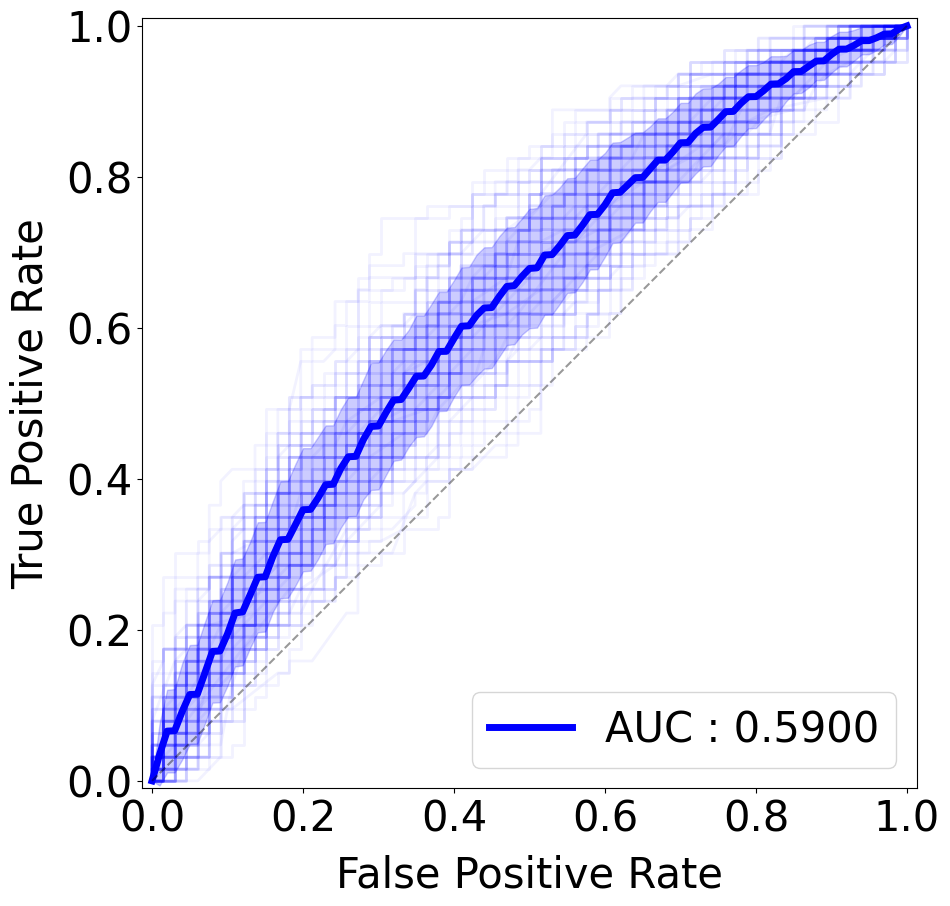

In [327]:
ROC_Curve(exp1_rf_true_df2, exp1_rf_prob_df2, exp1_rf_auc_df2, "b")

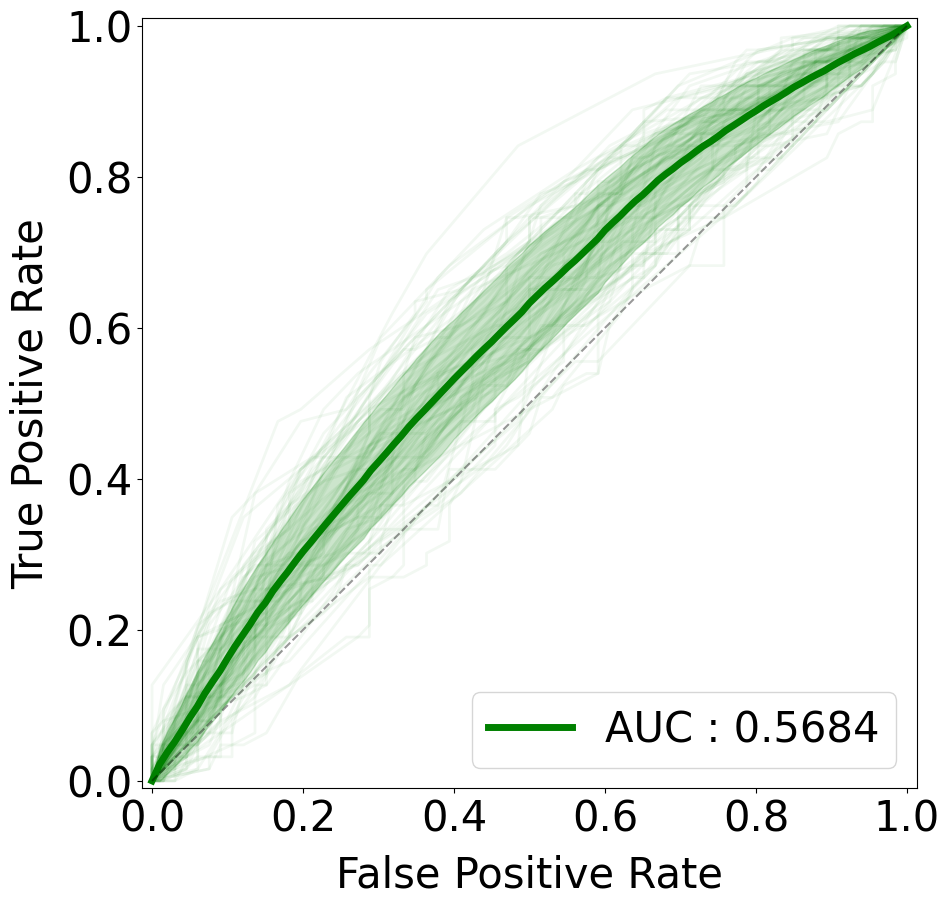

In [158]:
ROC_Curve(exp1_dt_true_df2, exp1_dt_prob_df2, exp1_dt_auc_df2, "green")

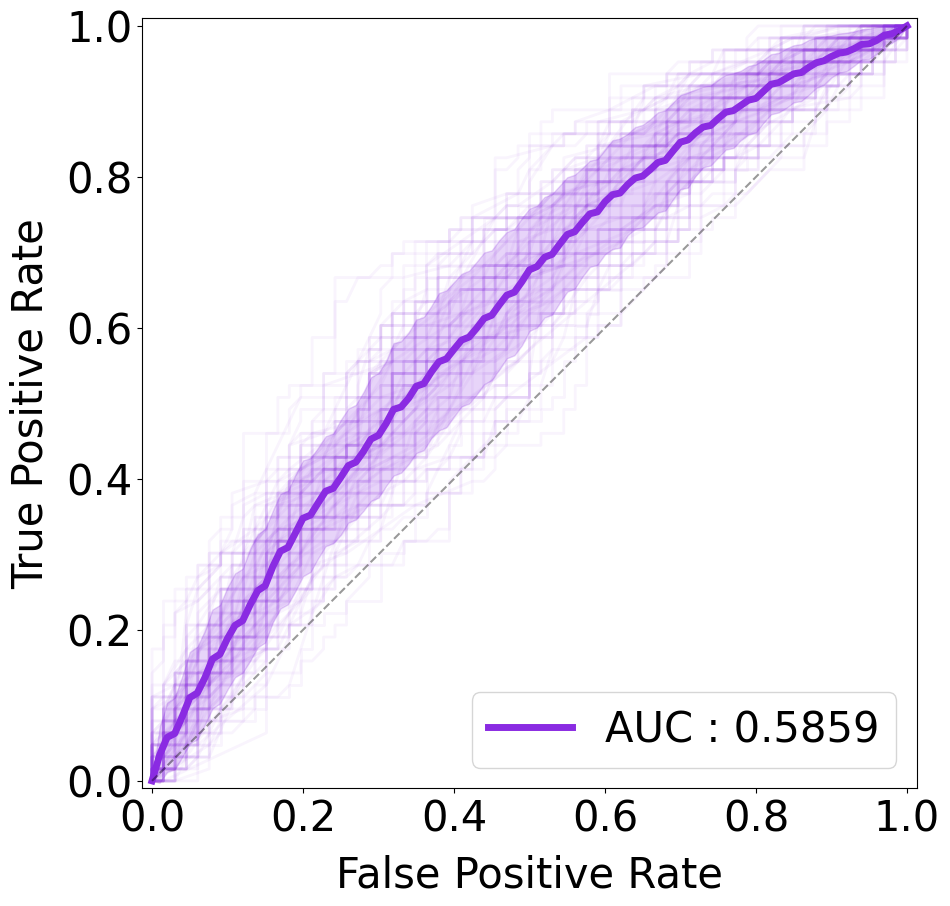

In [159]:
ROC_Curve(exp1_xgb_true_df2, exp1_xgb_prob_df2, exp1_xgb_auc_df2, "blueviolet")

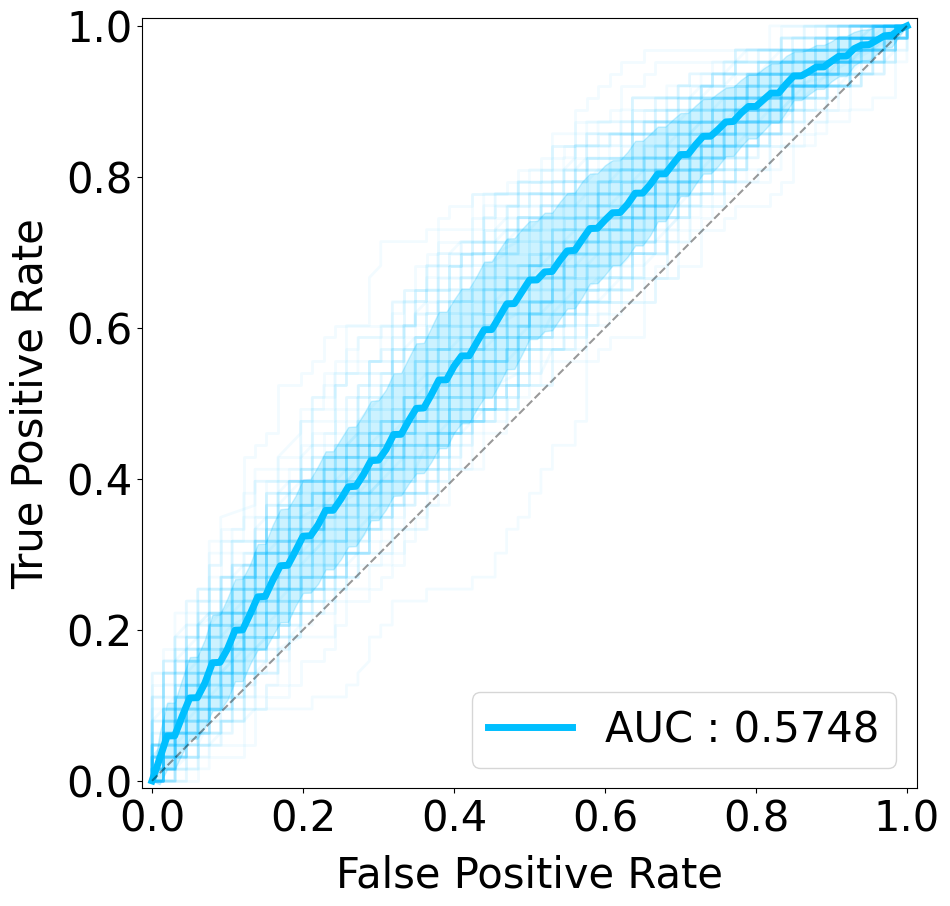

In [160]:
ROC_Curve(exp1_lgbm_true_df2, exp1_lgbm_prob_df2, exp1_lgbm_auc_df2, "deepskyblue")

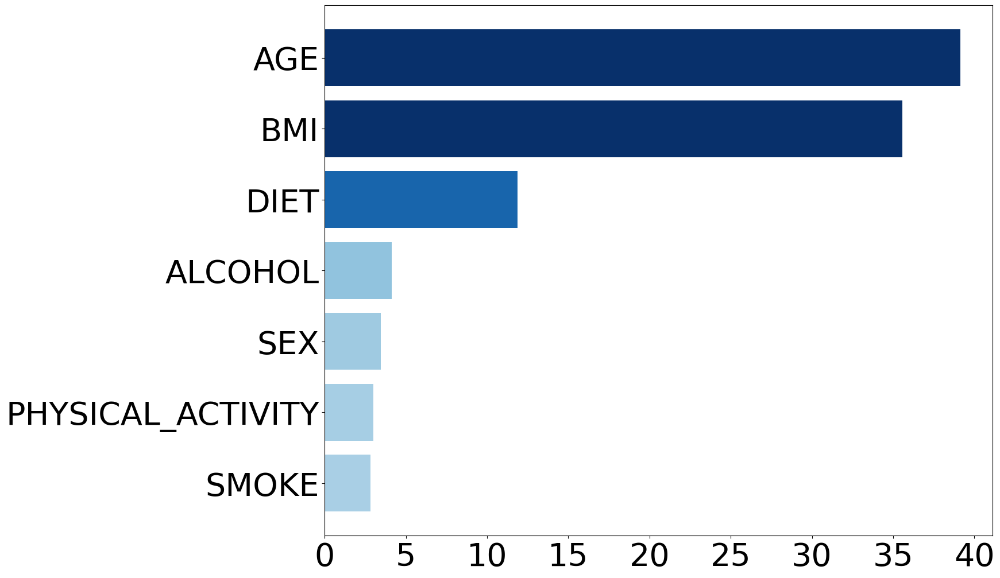

In [328]:
exp1_rf_impsum_df2 = FeatureImportancePlot(exp1_rf_importances2, exp1_column_list2, "Blues", 0.05)

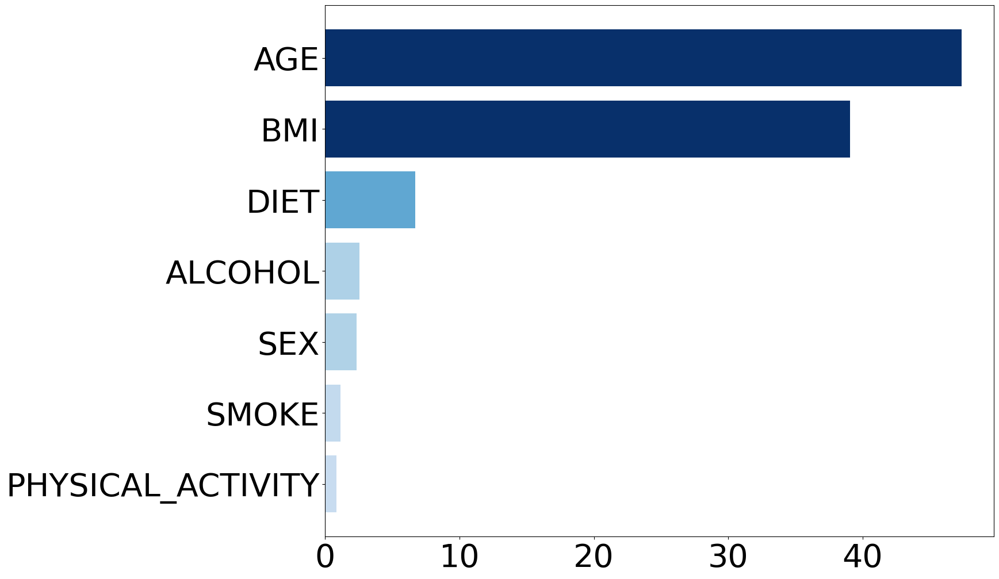

In [162]:
exp1_dt_impsum_df2 = FeatureImportancePlot(exp1_dt_importances2, exp1_column_list2, "Blues", 0.05)

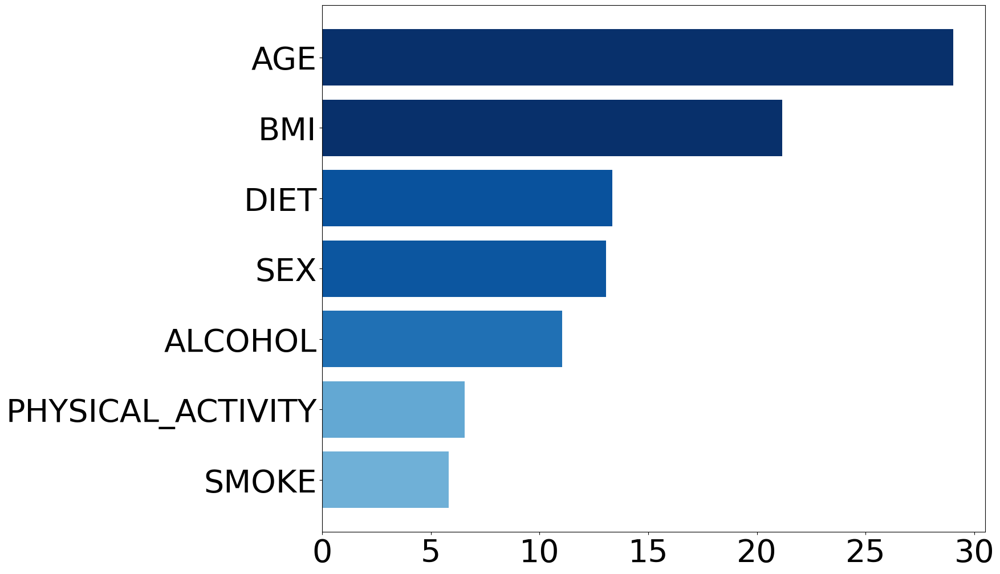

In [163]:
exp1_xgb_impsum_df2 = FeatureImportancePlot(exp1_xgb_importances2, exp1_column_list2, "Blues", 0.05)

In [164]:
# LGBM importances scale 조정
scale_exp1_lgbm_importances = Scale_LGBM_importances(exp1_lgbm_importances2)

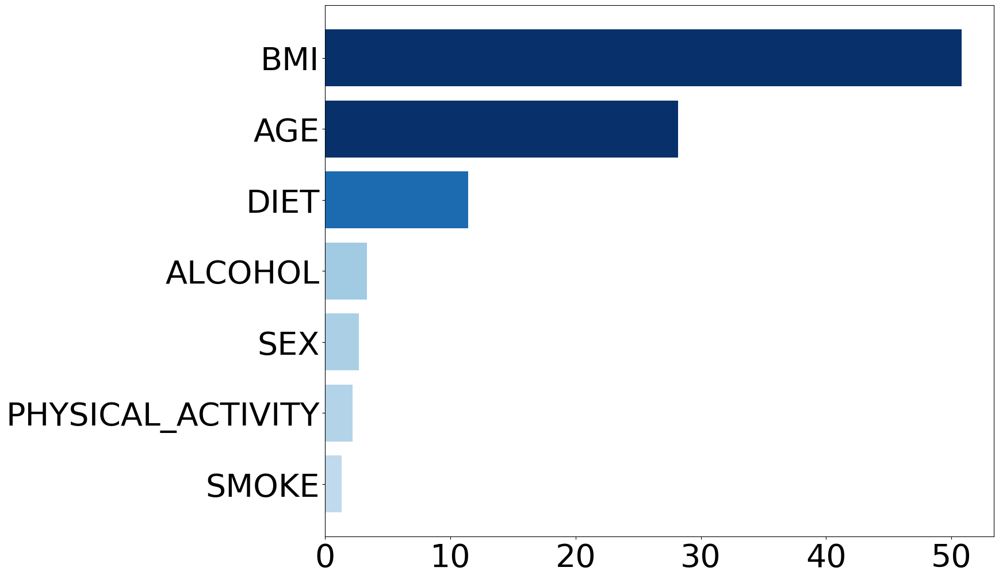

In [165]:
exp1_lgbm_impsum_df2 = FeatureImportancePlot(scale_exp1_lgbm_importances, exp1_column_list2, "Blues", 0.05)

In [131]:
exp1_lr_avg_ROC2 = Average_ROC(exp1_lr_true_df2, exp1_lr_prob_df2, exp1_lr_auc_df2, "LR")
exp1_rf_avg_ROC2 = Average_ROC(exp1_rf_true_df2, exp1_rf_prob_df2, exp1_rf_auc_df2, "RF")
exp1_dt_avg_ROC2 = Average_ROC(exp1_dt_true_df2, exp1_dt_prob_df2, exp1_dt_auc_df2, "DT")
exp1_xgb_avg_ROC2 = Average_ROC(exp1_xgb_true_df2, exp1_xgb_prob_df2, exp1_xgb_auc_df2, "XGB")
exp1_lgbm_avg_ROC2 = Average_ROC(exp1_lgbm_true_df2, exp1_lgbm_prob_df2, exp1_lgbm_auc_df2, "LGBM")

exp1_base_fpr_list2 = [exp1_lr_avg_ROC2[0], exp1_rf_avg_ROC2[0], exp1_dt_avg_ROC2[0], exp1_xgb_avg_ROC2[0], exp1_lgbm_avg_ROC2[0]]
exp1_mean_tprs_list2 = [exp1_lr_avg_ROC2[1], exp1_rf_avg_ROC2[1], exp1_dt_avg_ROC2[1], exp1_xgb_avg_ROC2[1], exp1_lgbm_avg_ROC2[1]]
exp1_tprs_lower_list2 = [exp1_lr_avg_ROC2[2], exp1_rf_avg_ROC2[2], exp1_dt_avg_ROC2[2], exp1_xgb_avg_ROC2[2], exp1_lgbm_avg_ROC2[2]]
exp1_tprs_upper_list2 = [exp1_lr_avg_ROC2[3], exp1_rf_avg_ROC2[3], exp1_dt_avg_ROC2[3], exp1_xgb_avg_ROC2[3], exp1_lgbm_avg_ROC2[3]]
exp1_legend_auc_list2 = [exp1_lr_avg_ROC2[4], exp1_rf_avg_ROC2[4], exp1_dt_avg_ROC2[4], exp1_xgb_avg_ROC2[4], exp1_lgbm_avg_ROC2[4]]

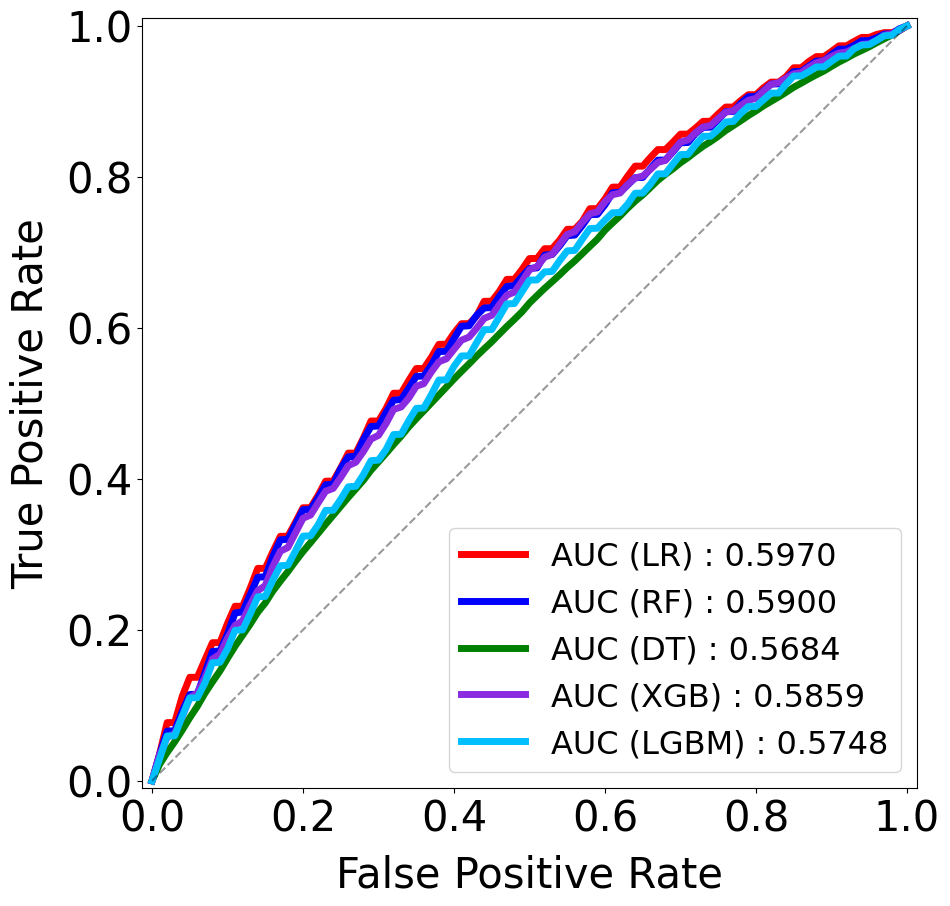

In [132]:
ROC_All_Curve(exp1_base_fpr_list2, exp1_mean_tprs_list2, exp1_tprs_lower_list2, exp1_tprs_upper_list2, exp1_legend_auc_list2)

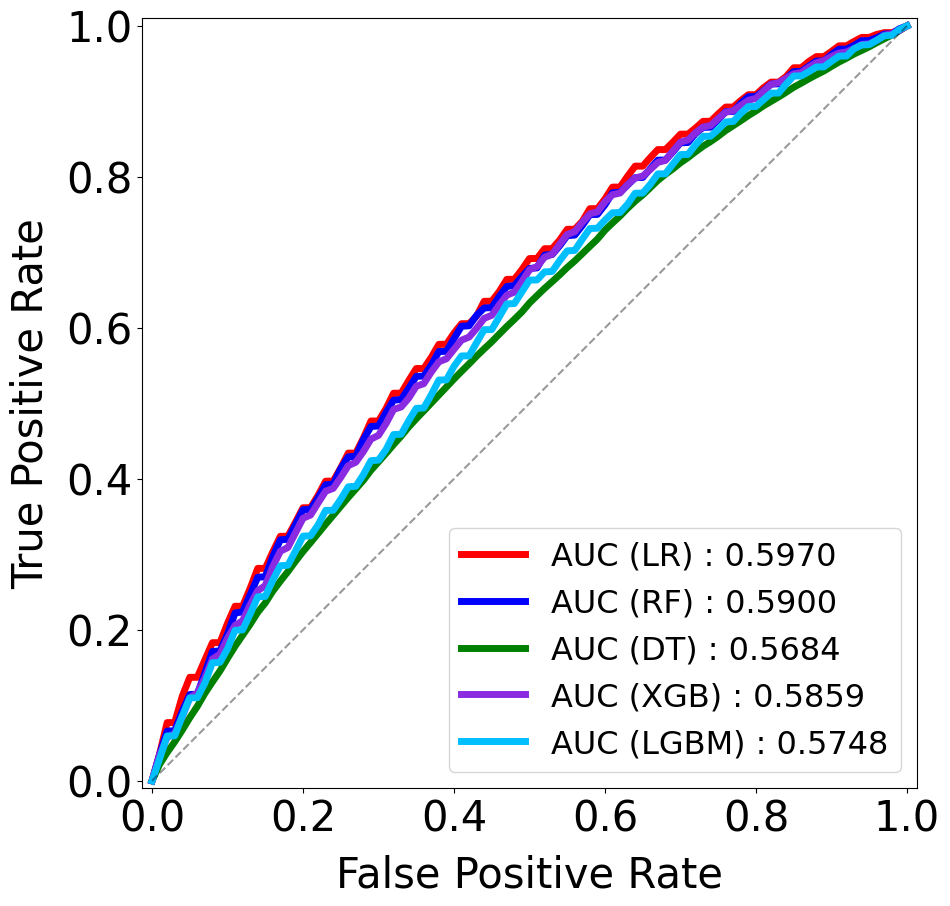

In [10]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp1_mean_tprs_list2)):
    plt.plot(exp1_base_fpr_list2[i], exp1_mean_tprs_list2[i], color_list[i], linewidth = 5, label = exp1_legend_auc_list2[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_Lifestyle_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

### 2. AGE, SEX + Metabolic Syndrome

In [101]:
exp2_column_list2 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA"]
exp2_2_KoGES = pre_2_F_KoGES.loc[:, exp2_column_list2]
exp2_2_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA
0,1,43,2,0,0,0,0,0
1,1,56,2,1,0,0,0,1
2,1,47,1,0,0,0,1,0
3,1,54,1,0,0,1,1,0
4,1,53,1,0,1,1,1,0


In [113]:
# Random Forest
exp2_rf_true_df2, exp2_rf_pred_df2, exp2_rf_prob_df2, exp2_rf_auc_df2, exp2_rf_importances2 = Iter_RandomForest(exp2_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 10}
2 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
3 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 300}
4 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 100}
5 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 10}
6 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 10}
7 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
8 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
9 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
10 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 150}
11 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
12 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 100}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
14 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 50}
15 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
16 {'max_depth': 5, 'min_samples_sp

In [102]:
exp2_lr_true_df2, exp2_lr_pred_df2, exp2_lr_prob_df2, exp2_lr_auc_df2 = Iter_Logistic(exp2_2_KoGES, seed_list, False, nGt_sampling_size)

In [103]:
# Decision Tree
exp2_dt_true_df2, exp2_dt_pred_df2, exp2_dt_prob_df2, exp2_dt_auc_df2, exp2_dt_importances2 = Iter_DecisionTree(exp2_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 10, 'min_samples_split': 5}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 5}
4 {'max_depth': 5, 'min_samples_split': 3}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 10, 'min_samples_split': 7}
7 {'max_depth': 5, 'min_samples_split': 2}
8 {'max_depth': 5, 'min_samples_split': 5}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 10}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 5, 'min_samples_split': 2}
13 {'max_depth': 7, 'min_samples_split': 10}
14 {'max_depth': 5, 'min_samples_split': 10}
15 {'max_depth': 5, 'min_samples_split': 5}
16 {'max_depth': 7, 'min_samples_split': 10}
17 {'max_depth': 5, 'min_samples_split': 2}
18 {'max_depth': 7, 'min_samples_split': 10}
19 {'max_depth': 7, 'min_samples_split': 3}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 7, 'min_samples_split': 3}
22 {'max_depth': 7, 'min_samples_split': 10}
23 {'max_depth': 3, 'min_samples_

In [381]:
# # XGBoost
# exp2_xgb_true_df2, exp2_xgb_pred_df2, exp2_xgb_prob_df2, exp2_xgb_auc_df2, exp2_xgb_importances2 = Iter_XGBoost(exp2_2_KoGES, seed_list, False, nGt_sampling_size)
exp2_xgb_true_df2 = xgb_AfImp_pkl["exp2"][0]
exp2_xgb_pred_df2 = xgb_AfImp_pkl["exp2"][1]
exp2_xgb_prob_df2 = xgb_AfImp_pkl["exp2"][2]
exp2_xgb_auc_df2 = xgb_AfImp_pkl["exp2"][3]
exp2_xgb_importances2 = xgb_AfImp_pkl["exp2"][4]

In [114]:
# LightGBM
exp2_lgbm_true_df2, exp2_lgbm_pred_df2, exp2_lgbm_prob_df2, exp2_lgbm_auc_df2, exp2_lgbm_importances2 = Iter_LightGBM(exp2_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'learning_rate': 0.2, 'n_estimators': 50}
2 {'learning_rate': 0.5, 'n_estimators': 10}
3 {'learning_rate': 0.4, 'n_estimators': 10}
4 {'learning_rate': 0.7, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.9, 'n_estimators': 10}
8 {'learning_rate': 0.1, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.1, 'n_estimators': 10}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.7, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.2, 'n_estimators': 10}
15 {'learning_rate': 0.1, 'n_estimators': 10}
16 {'learning_rate': 0.6, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.1, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 10}
20 {'learning_rate': 0.1, 'n_estimators': 10}
21 {'learning_rate': 0.1, 'n_estimators': 10}
22 {'learning_rate': 0.3, 'n_estimators': 1

#### Outcome

In [331]:
exp2_lr_acc_list2, exp2_lr_f1_list2, exp2_lr_precision_list2, exp2_lr_recall_list2 = Calculate_metrics(exp2_lr_true_df2, exp2_lr_pred_df2)

ACC : 0.6080 (std : 0.0479)
F1-score : 0.5923 (std : 0.0524)
Precision : 0.6026 (std : 0.0521)
Recall : 0.5849 (std : 0.0655)


In [166]:
exp2_rf_acc_list2, exp2_rf_f1_list2, exp2_rf_precision_list2, exp2_rf_recall_list2 = Calculate_metrics(exp2_rf_true_df2, exp2_rf_pred_df2)

ACC : 0.5997
F1-score : 0.5655
Precision : 0.6043
Recall : 0.5352


In [167]:
exp2_dt_acc_list2, exp2_dt_f1_list2, exp2_dt_precision_list2, exp2_dt_recall_list2 = Calculate_metrics(exp2_dt_true_df2, exp2_dt_pred_df2)

ACC : 0.5829
F1-score : 0.5310
Precision : 0.5921
Recall : 0.4917


In [382]:
exp2_xgb_acc_list2, exp2_xgb_f1_list2, exp2_xgb_precision_list2, exp2_xgb_recall_list2 = Calculate_metrics(exp2_xgb_true_df2, exp2_xgb_pred_df2)

ACC : 0.6000 (std : 0.0439)
F1-score : 0.5630 (std : 0.0556)
Precision : 0.6051 (std : 0.0547)
Recall : 0.5317 (std : 0.0771)


In [383]:
exp2_lgbm_acc_list2, exp2_lgbm_f1_list2, exp2_lgbm_precision_list2, exp2_lgbm_recall_list2 = Calculate_metrics(exp2_lgbm_true_df2, exp2_lgbm_pred_df2)

ACC : 0.5805 (std : 0.0417)
F1-score : 0.5536 (std : 0.0526)
Precision : 0.5766 (std : 0.0469)
Recall : 0.5360 (std : 0.0714)


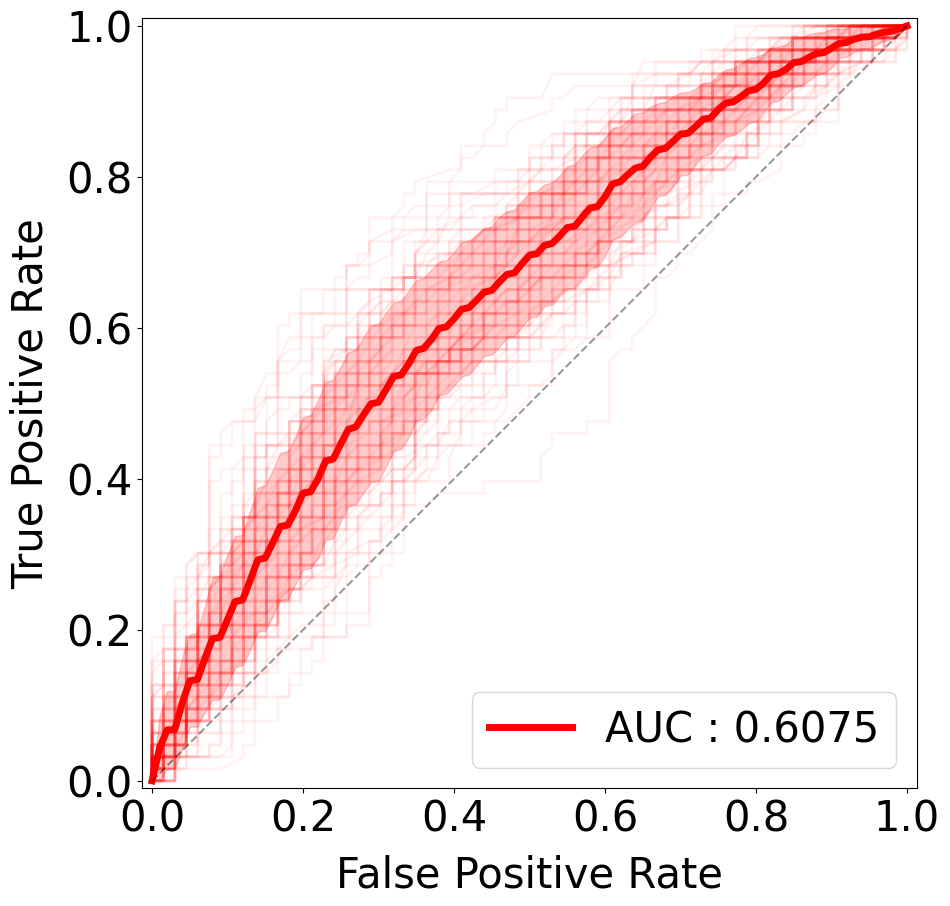

In [332]:
ROC_Curve(exp2_lr_true_df2, exp2_lr_prob_df2, exp2_lr_auc_df2, "r")

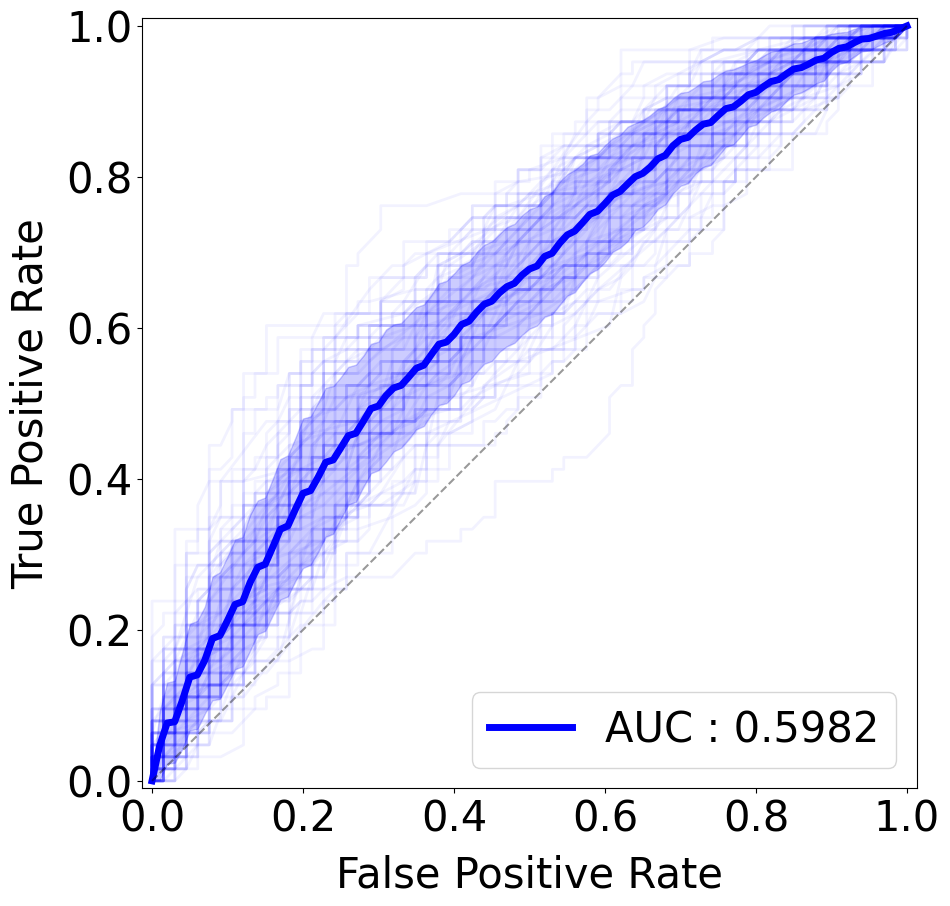

In [329]:
ROC_Curve(exp2_rf_true_df2, exp2_rf_prob_df2, exp2_rf_auc_df2, "b")

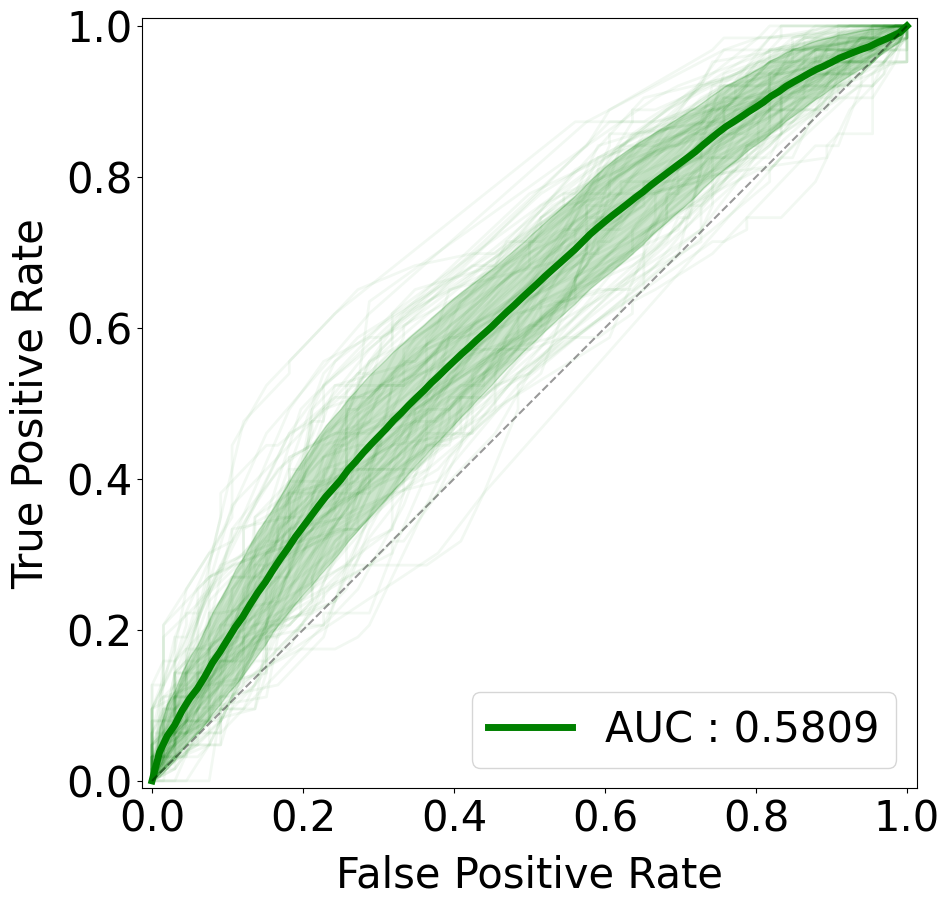

In [171]:
ROC_Curve(exp2_dt_true_df2, exp2_dt_prob_df2, exp2_dt_auc_df2, "green")

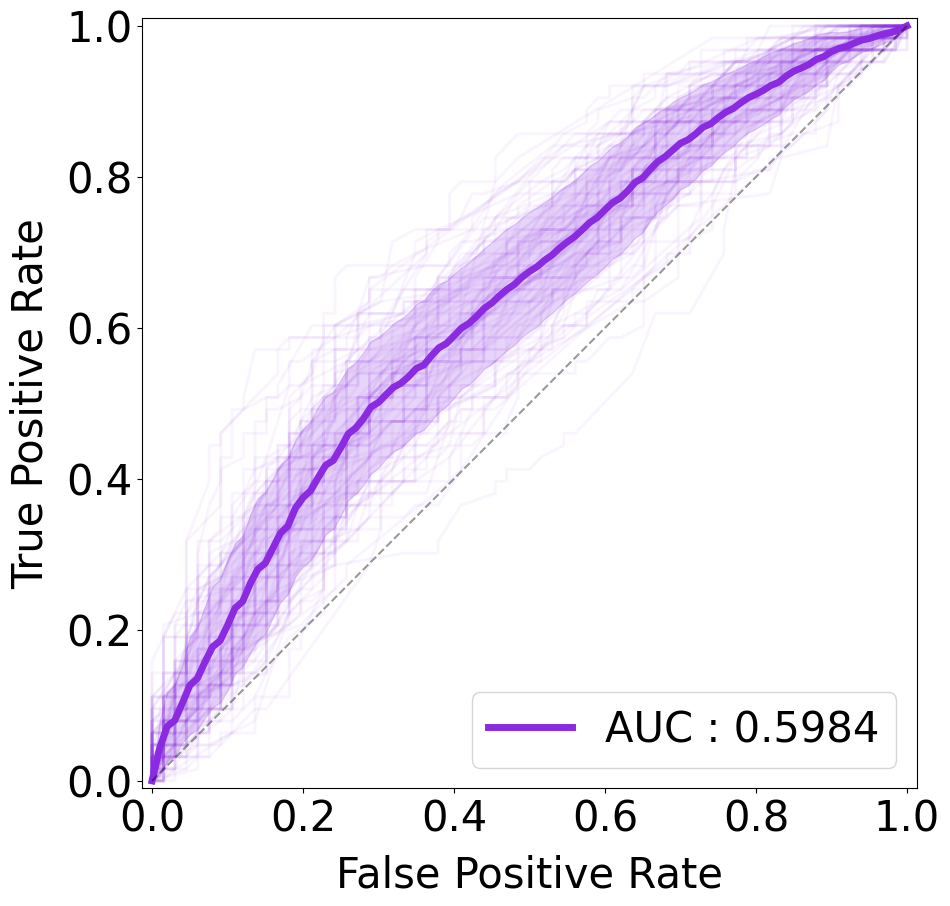

In [172]:
ROC_Curve(exp2_xgb_true_df2, exp2_xgb_prob_df2, exp2_xgb_auc_df2, "blueviolet")

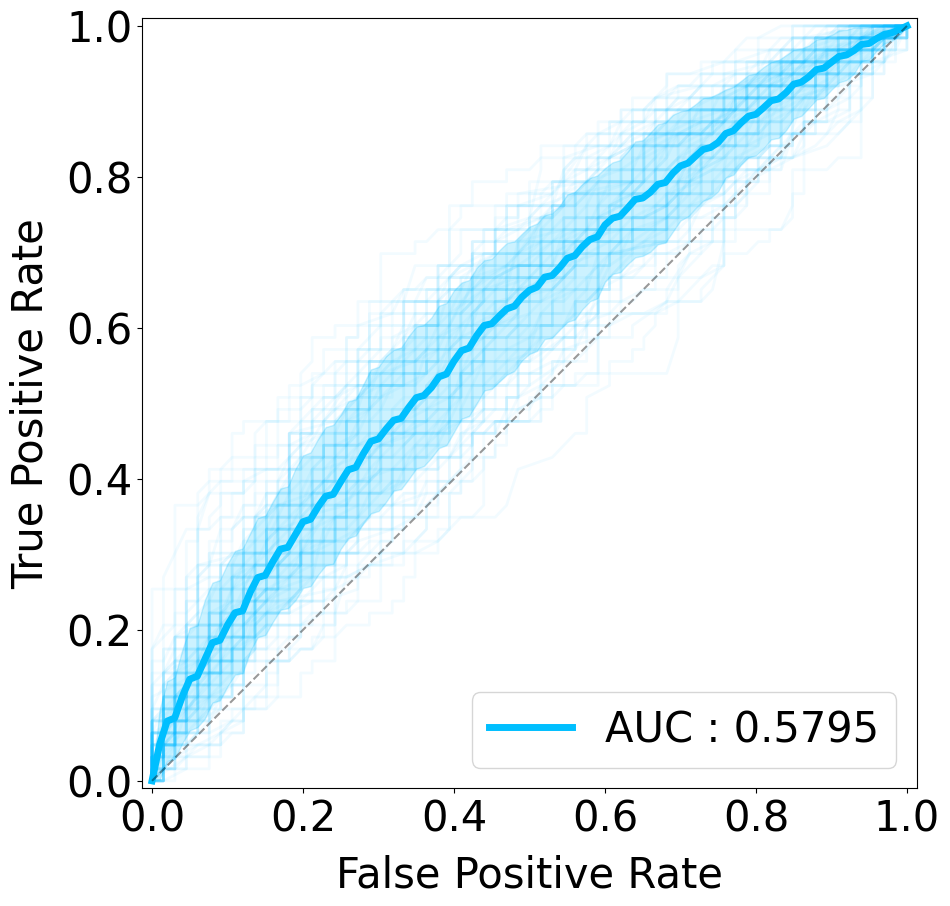

In [173]:
ROC_Curve(exp2_lgbm_true_df2, exp2_lgbm_prob_df2, exp2_lgbm_auc_df2, "deepskyblue")

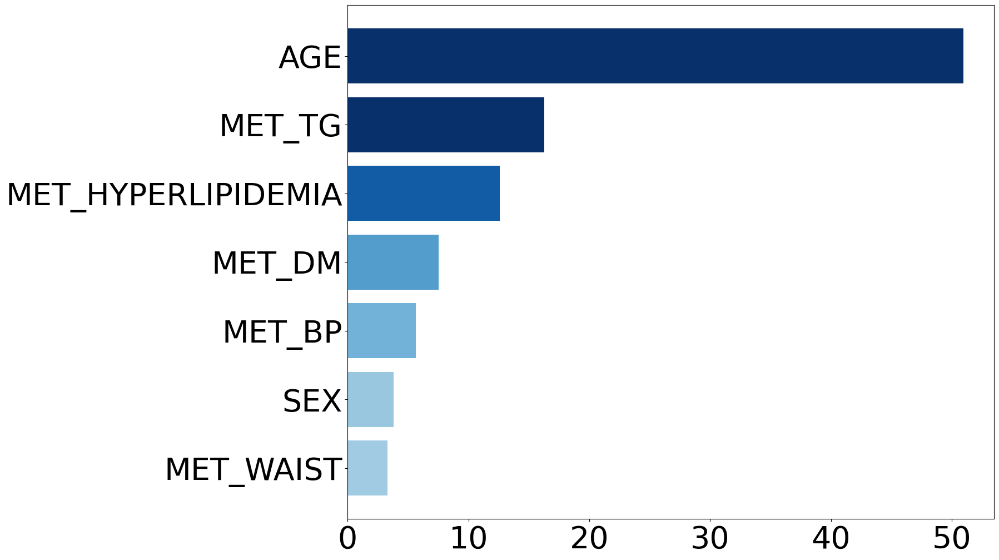

In [330]:
exp2_rf_impsum_df2 = FeatureImportancePlot(exp2_rf_importances2, exp2_column_list2, "Blues", 0.05)

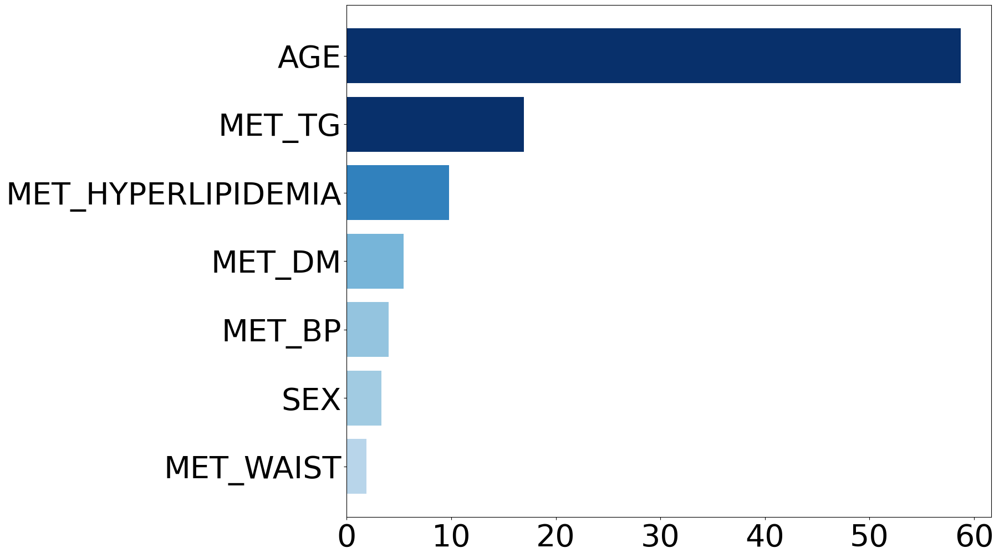

In [175]:
exp2_dt_impsum_df2 = FeatureImportancePlot(exp2_dt_importances2, exp2_column_list2, "Blues", 0.05)

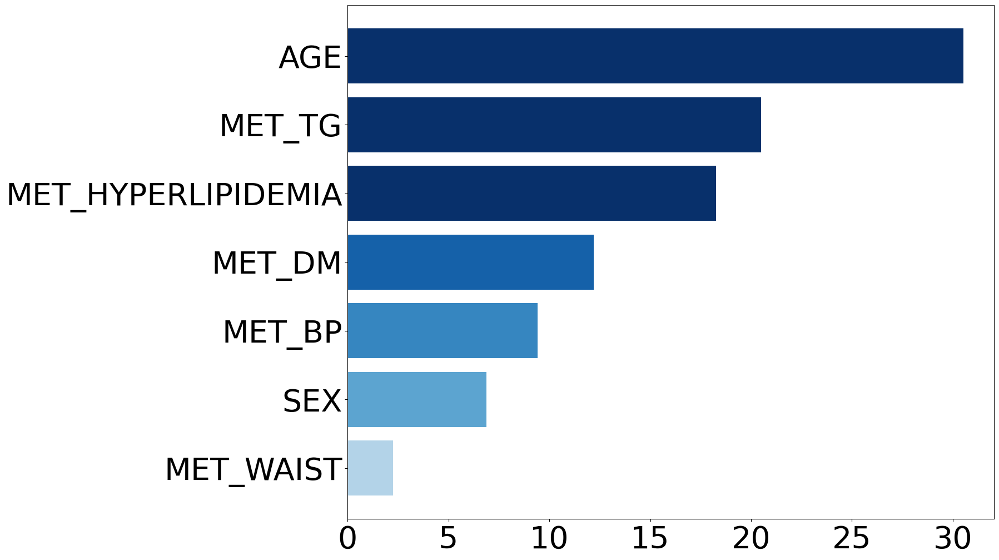

In [176]:
exp2_xgb_impsum_df2 = FeatureImportancePlot(exp2_xgb_importances2, exp2_column_list2, "Blues", 0.05)

In [177]:
# LGBM importances scale 조정
scale_exp2_lgbm_importances = Scale_LGBM_importances(exp2_lgbm_importances2)

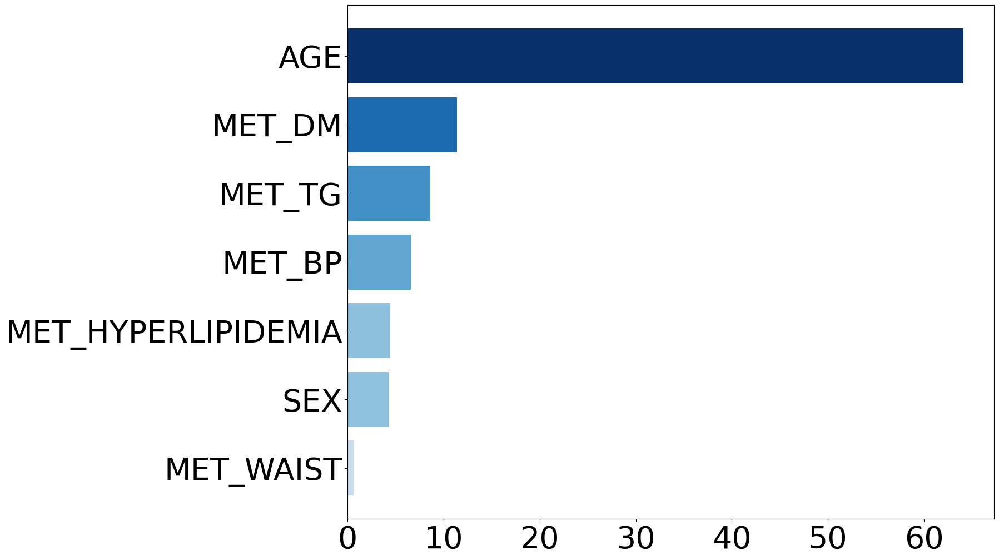

In [178]:
exp2_lgbm_impsum_df2 = FeatureImportancePlot(scale_exp2_lgbm_importances, exp2_column_list2, "Blues", 0.05)

In [333]:
exp2_lr_avg_ROC2 = Average_ROC(exp2_lr_true_df2, exp2_lr_prob_df2, exp2_lr_auc_df2, "LR")
exp2_rf_avg_ROC2 = Average_ROC(exp2_rf_true_df2, exp2_rf_prob_df2, exp2_rf_auc_df2, "RF")
exp2_dt_avg_ROC2 = Average_ROC(exp2_dt_true_df2, exp2_dt_prob_df2, exp2_dt_auc_df2, "DT")
exp2_xgb_avg_ROC2 = Average_ROC(exp2_xgb_true_df2, exp2_xgb_prob_df2, exp2_xgb_auc_df2, "XGB")
exp2_lgbm_avg_ROC2 = Average_ROC(exp2_lgbm_true_df2, exp2_lgbm_prob_df2, exp2_lgbm_auc_df2, "LGBM")

exp2_base_fpr_list2 = [exp2_lr_avg_ROC2[0], exp2_rf_avg_ROC2[0], exp2_dt_avg_ROC2[0], exp2_xgb_avg_ROC2[0], exp2_lgbm_avg_ROC2[0]]
exp2_mean_tprs_list2 = [exp2_lr_avg_ROC2[1], exp2_rf_avg_ROC2[1], exp2_dt_avg_ROC2[1], exp2_xgb_avg_ROC2[1], exp2_lgbm_avg_ROC2[1]]
exp2_tprs_lower_list2 = [exp2_lr_avg_ROC2[2], exp2_rf_avg_ROC2[2], exp2_dt_avg_ROC2[2], exp2_xgb_avg_ROC2[2], exp2_lgbm_avg_ROC2[2]]
exp2_tprs_upper_list2 = [exp2_lr_avg_ROC2[3], exp2_rf_avg_ROC2[3], exp2_dt_avg_ROC2[3], exp2_xgb_avg_ROC2[3], exp2_lgbm_avg_ROC2[3]]
exp2_legend_auc_list2 = [exp2_lr_avg_ROC2[4], exp2_rf_avg_ROC2[4], exp2_dt_avg_ROC2[4], exp2_xgb_avg_ROC2[4], exp2_lgbm_avg_ROC2[4]]

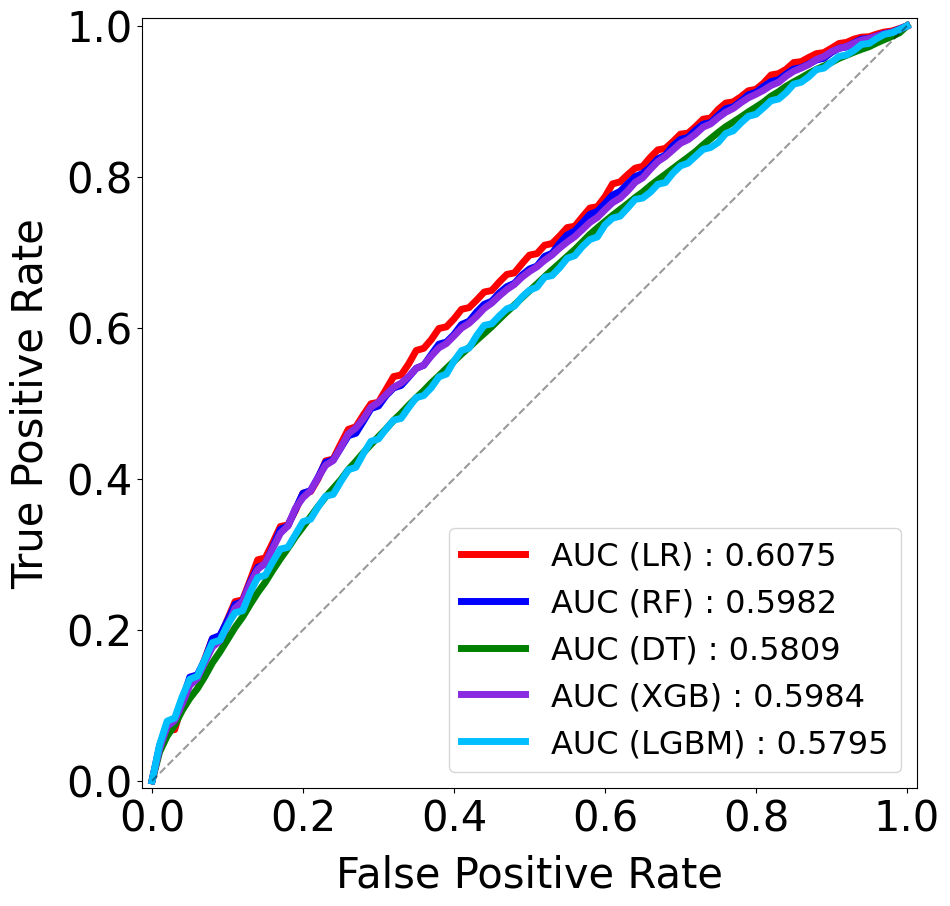

In [334]:
ROC_All_Curve(exp2_base_fpr_list2, exp2_mean_tprs_list2, exp2_tprs_lower_list2, exp2_tprs_upper_list2, exp2_legend_auc_list2)

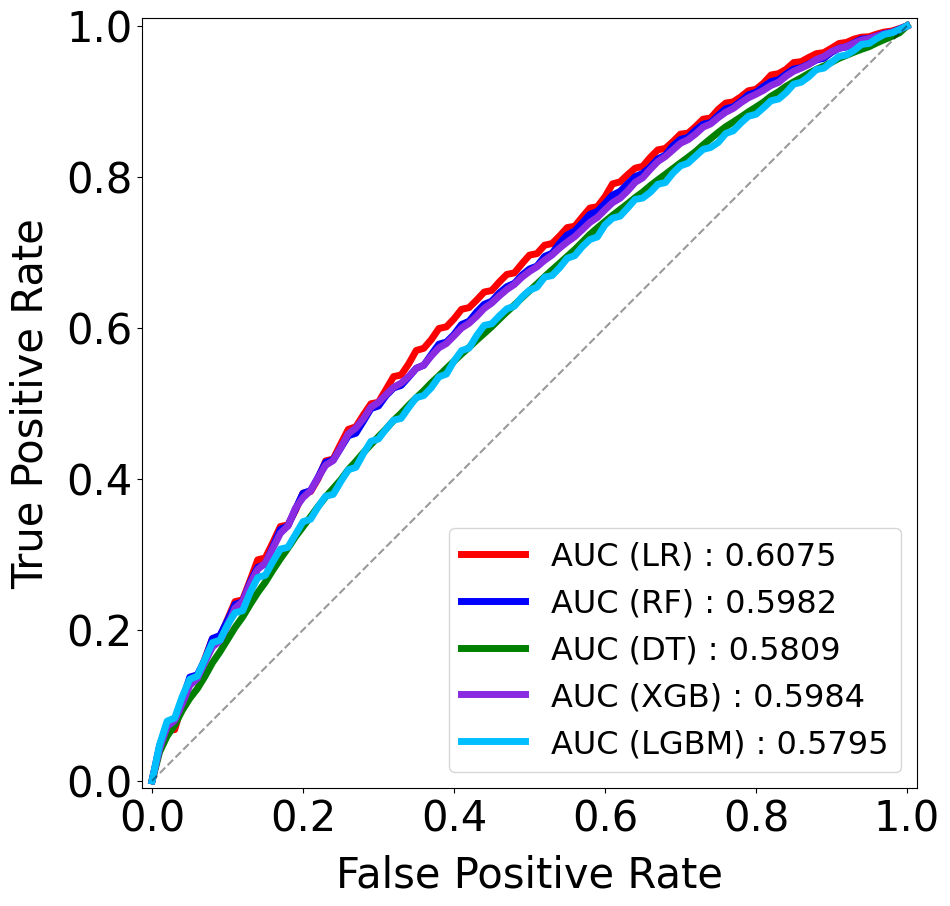

In [11]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp2_mean_tprs_list2)):
    plt.plot(exp2_base_fpr_list2[i], exp2_mean_tprs_list2[i], color_list[i], linewidth = 5, label = exp2_legend_auc_list2[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_MetS_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

### 6. AGE, SEX + Lifestyle + Urate

In [108]:
exp6_column_list2 = ["DISEASE", "AGE", "SEX", 
                    "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY", "DIET", "URICACID"]
exp6_2_KoGES = pre_2_F_KoGES.loc[:, exp6_column_list2]
exp6_2_KoGES.head()

,DISEASE,AGE,SEX,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,DIET,URICACID
0,1,43,2,18.40,0,0,0,6,3.5
1,1,56,2,22.06,0,1,0,7,3.5
2,1,47,1,30.48,1,1,0,5,5.4
3,1,54,1,26.17,0,0,0,5,5.7
4,1,53,1,26.16,0,1,0,4,6.7


In [115]:
# Random Forest
exp6_rf_true_df2, exp6_rf_pred_df2, exp6_rf_prob_df2, exp6_rf_auc_df2, exp6_rf_importances2 = Iter_RandomForest(exp6_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
2 {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
3 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 10}
4 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 50}
5 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 10}
6 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 50}
7 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 300}
8 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 50}
9 {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 150}
10 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 10}
11 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 300}
12 {'max_depth': 5, 'min_samples_split': 3, 'n_estimators': 100}
13 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
14 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 10}
15 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 100}
16 {'max_depth': 7, 'min_samples_spl

In [116]:
exp6_lr_true_df2, exp6_lr_pred_df2, exp6_lr_prob_df2, exp6_lr_auc_df2 = Iter_Logistic(exp6_2_KoGES, seed_list, False, nGt_sampling_size)

In [117]:
# Decision Tree
exp6_dt_true_df2, exp6_dt_pred_df2, exp6_dt_prob_df2, exp6_dt_auc_df2, exp6_dt_importances2 = Iter_DecisionTree(exp6_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 10}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 3, 'min_samples_split': 2}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 3, 'min_samples_split': 2}
8 {'max_depth': 3, 'min_samples_split': 2}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 7, 'min_samples_split': 10}
12 {'max_depth': 5, 'min_samples_split': 7}
13 {'max_depth': 3, 'min_samples_split': 2}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 5, 'min_samples_split': 10}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 5, 'min_samples_split': 2}
19 {'max_depth': 3, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 3, 'min_samples_split

In [338]:
# # XGBoost
# exp6_xgb_true_df2, exp6_xgb_pred_df2, exp6_xgb_prob_df2, exp6_xgb_auc_df2, exp6_xgb_importances2 = Iter_XGBoost(exp6_2_KoGES, seed_list, False, nGt_sampling_size)
exp6_xgb_true_df2 = xgb_AfImp_pkl["exp6"][0]
exp6_xgb_pred_df2 = xgb_AfImp_pkl["exp6"][1]
exp6_xgb_prob_df2 = xgb_AfImp_pkl["exp6"][2]
exp6_xgb_auc_df2 = xgb_AfImp_pkl["exp6"][3]
exp6_xgb_importances2 = xgb_AfImp_pkl["exp6"][4]

In [118]:
# LightGBM
exp6_lgbm_true_df2, exp6_lgbm_pred_df2, exp6_lgbm_prob_df2, exp6_lgbm_auc_df2, exp6_lgbm_importances2 = Iter_LightGBM(exp6_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.6, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.1, 'n_estimators': 50}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.1, 'n_estimators': 10}
10 {'learning_rate': 0.3, 'n_estimators': 10}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 50}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.1, 'n_estimators': 10}
16 {'learning_rate': 0.1, 'n_estimators': 10}
17 {'learning_rate': 0.2, 'n_estimators': 10}
18 {'learning_rate': 0.3, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 50}
20 {'learning_rate': 0.1, 'n_estimators': 10}
21 {'learning_rate': 0.1, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

#### Outcome

In [390]:
exp6_lr_acc_list2, exp6_lr_f1_list2, exp6_lr_precision_list2, exp6_lr_recall_list2 = Calculate_metrics(exp6_lr_true_df2, exp6_lr_pred_df2)

ACC : 0.7105 (std : 0.0367)
F1-score : 0.6938 (std : 0.0410)
Precision : 0.7183 (std : 0.0439)
Recall : 0.6733 (std : 0.0553)


In [336]:
exp6_rf_acc_list2, exp6_rf_f1_list2, exp6_rf_precision_list2, exp6_rf_recall_list2 = Calculate_metrics(exp6_rf_true_df2, exp6_rf_pred_df2)

ACC : 0.7096 (std : 0.0408)
F1-score : 0.6579 (std : 0.0549)
Precision : 0.7753 (std : 0.0602)
Recall : 0.5760 (std : 0.0707)


In [337]:
exp6_dt_acc_list2, exp6_dt_f1_list2, exp6_dt_precision_list2, exp6_dt_recall_list2 = Calculate_metrics(exp6_dt_true_df2, exp6_dt_pred_df2)

ACC : 0.7004 (std : 0.0378)
F1-score : 0.6499 (std : 0.0557)
Precision : 0.7582 (std : 0.0597)
Recall : 0.5756 (std : 0.0796)


In [339]:
exp6_xgb_acc_list2, exp6_xgb_f1_list2, exp6_xgb_precision_list2, exp6_xgb_recall_list2 = Calculate_metrics(exp6_xgb_true_df2, exp6_xgb_pred_df2)

ACC : 0.7087 (std : 0.0420)
F1-score : 0.6677 (std : 0.0522)
Precision : 0.7554 (std : 0.0615)
Recall : 0.6027 (std : 0.0695)


In [340]:
exp6_lgbm_acc_list2, exp6_lgbm_f1_list2, exp6_lgbm_precision_list2, exp6_lgbm_recall_list2 = Calculate_metrics(exp6_lgbm_true_df2, exp6_lgbm_pred_df2)

ACC : 0.6946 (std : 0.0402)
F1-score : 0.6700 (std : 0.0464)
Precision : 0.7107 (std : 0.0516)
Recall : 0.6376 (std : 0.0654)


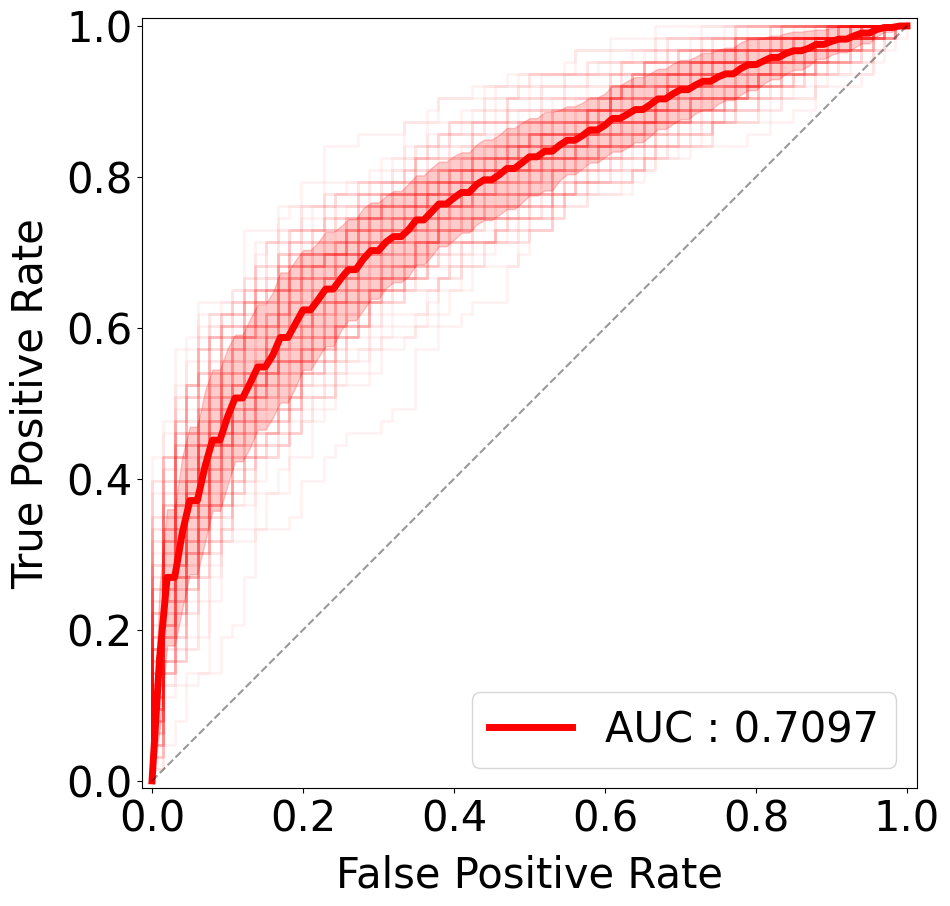

In [342]:
ROC_Curve(exp6_lr_true_df2, exp6_lr_prob_df2, exp6_lr_auc_df2, "r")

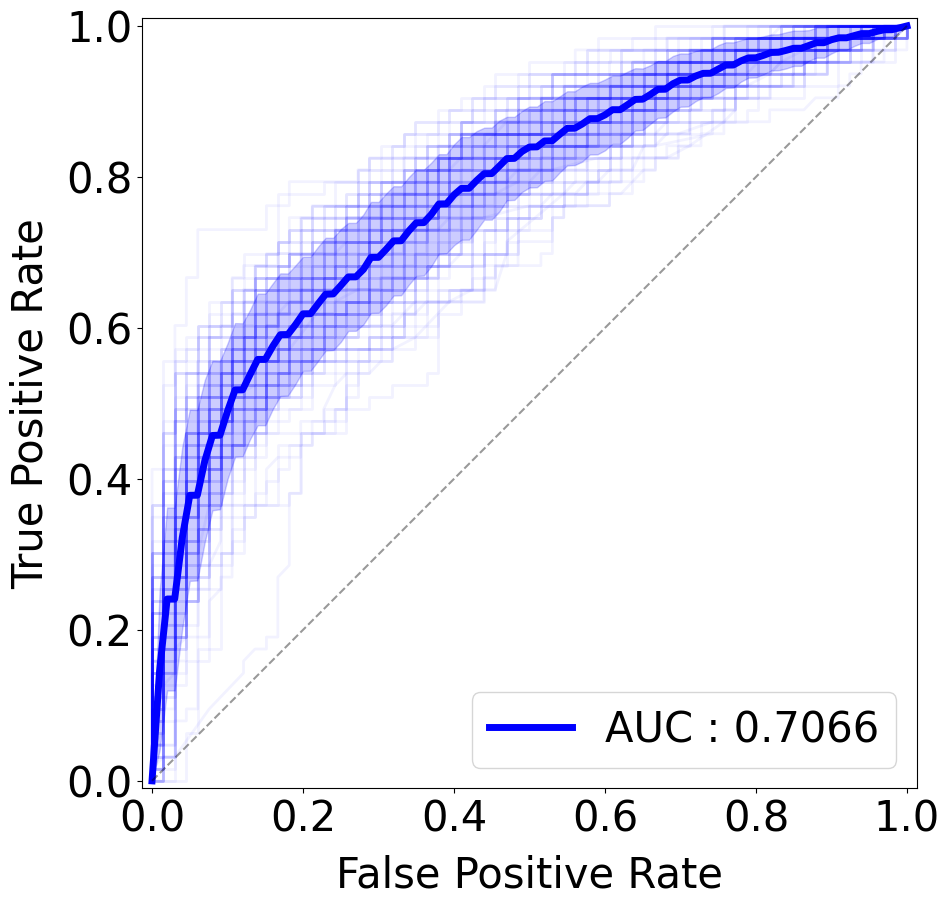

In [341]:
ROC_Curve(exp6_rf_true_df2, exp6_rf_prob_df2, exp6_rf_auc_df2, "b")

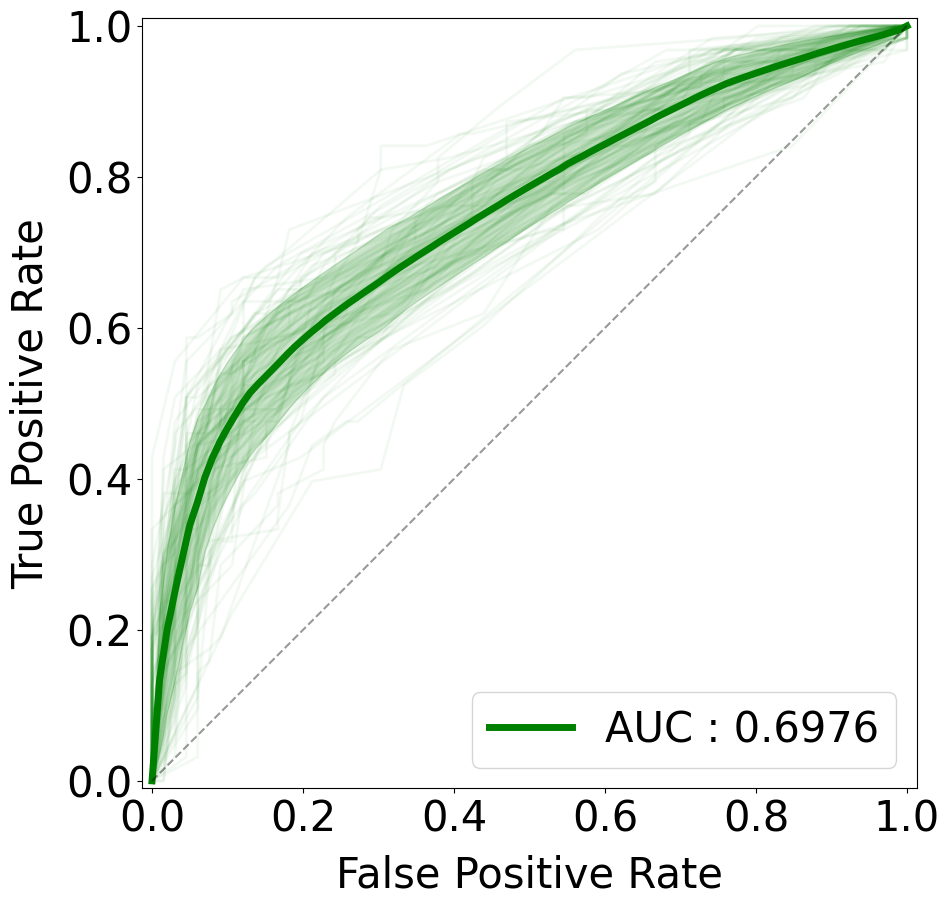

In [184]:
ROC_Curve(exp6_dt_true_df2, exp6_dt_prob_df2, exp6_dt_auc_df2, "green")

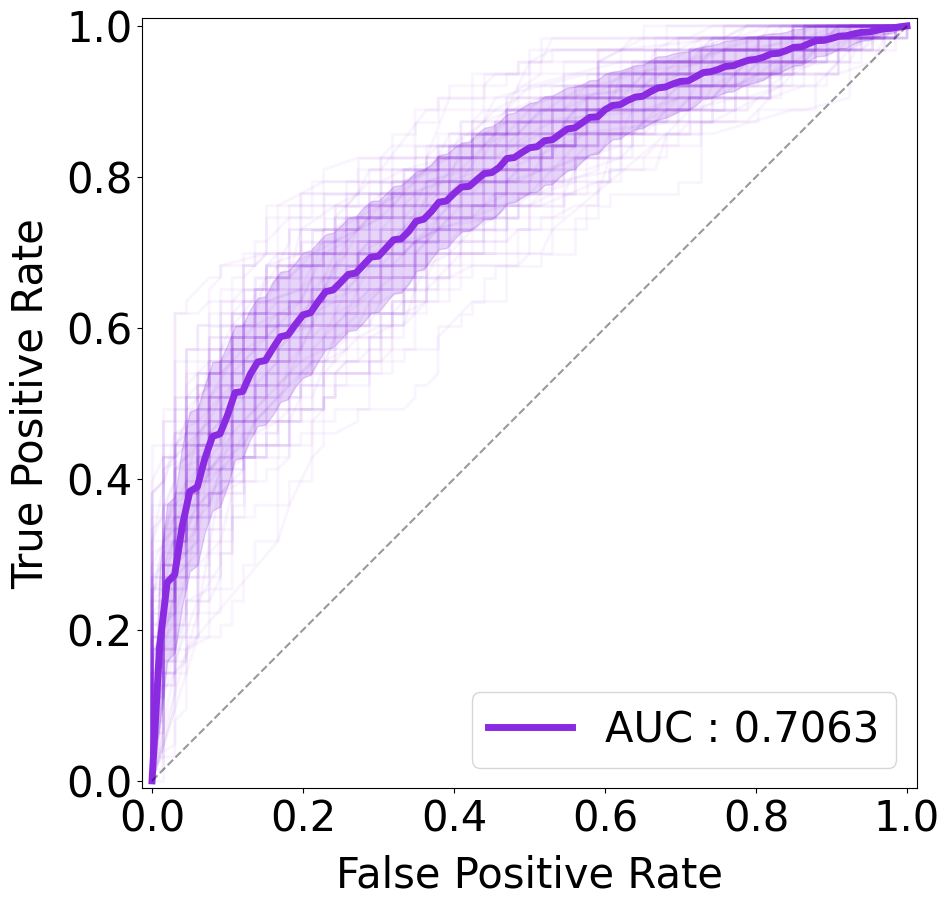

In [185]:
ROC_Curve(exp6_xgb_true_df2, exp6_xgb_prob_df2, exp6_xgb_auc_df2, "blueviolet")

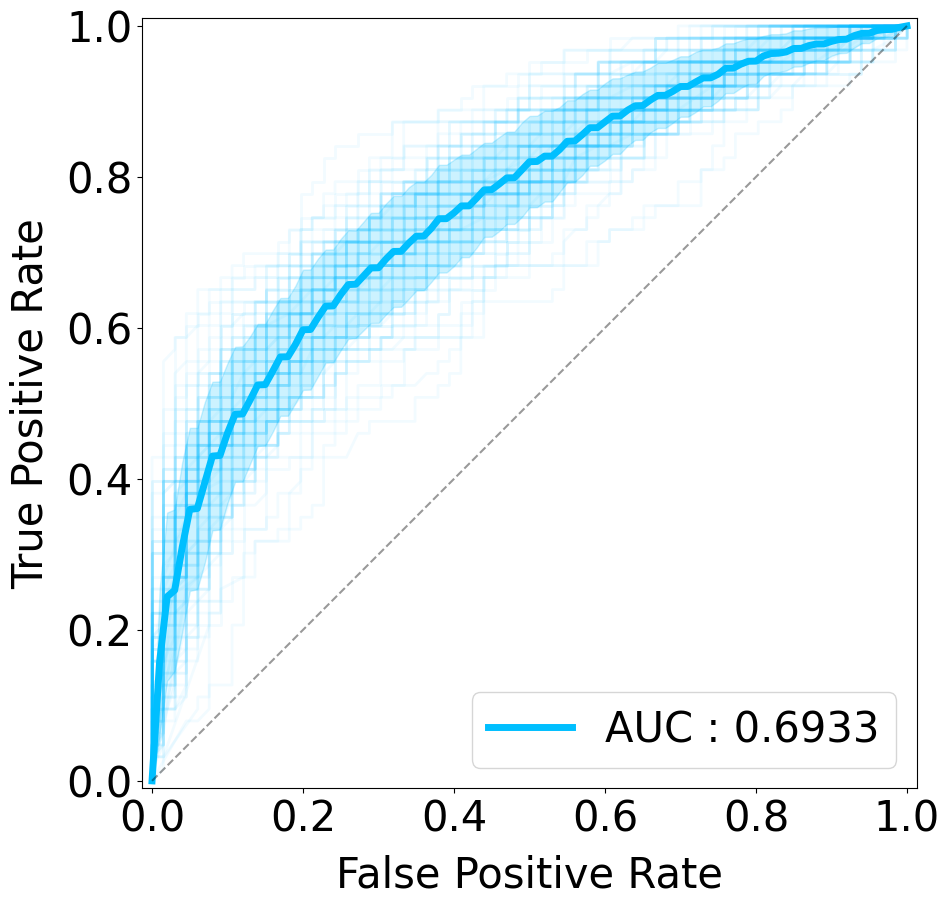

In [186]:
ROC_Curve(exp6_lgbm_true_df2, exp6_lgbm_prob_df2, exp6_lgbm_auc_df2, "deepskyblue")

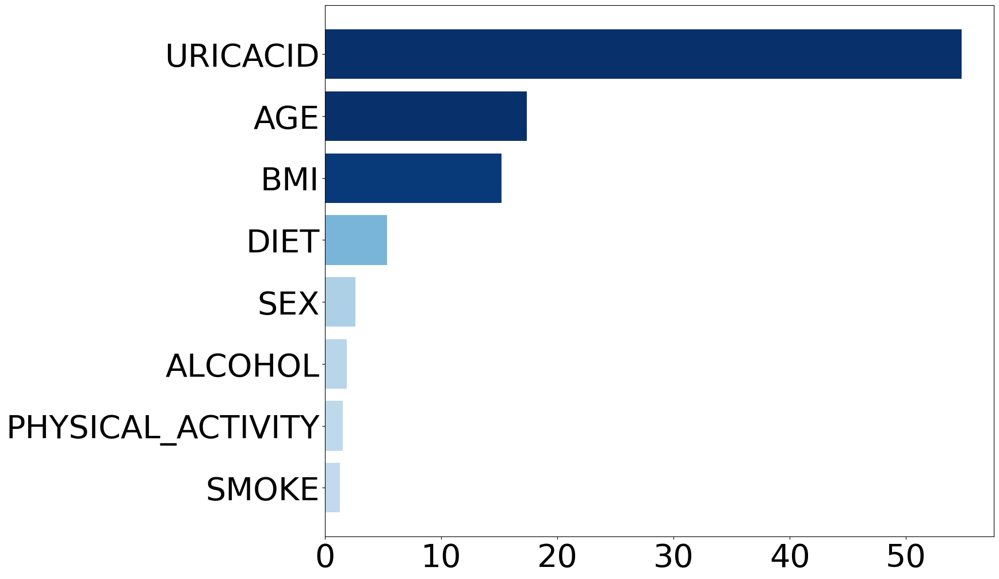

In [343]:
exp6_rf_impsum_df2 = FeatureImportancePlot(exp6_rf_importances2, exp6_column_list2, "Blues", 0.05)

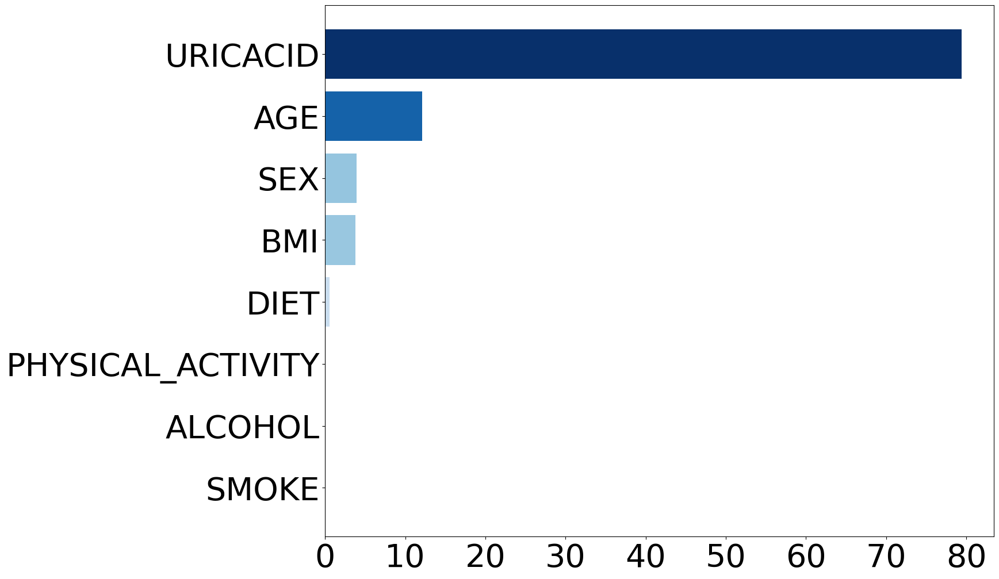

In [188]:
exp6_dt_impsum_df2 = FeatureImportancePlot(exp6_dt_importances2, exp6_column_list2, "Blues", 0.05)

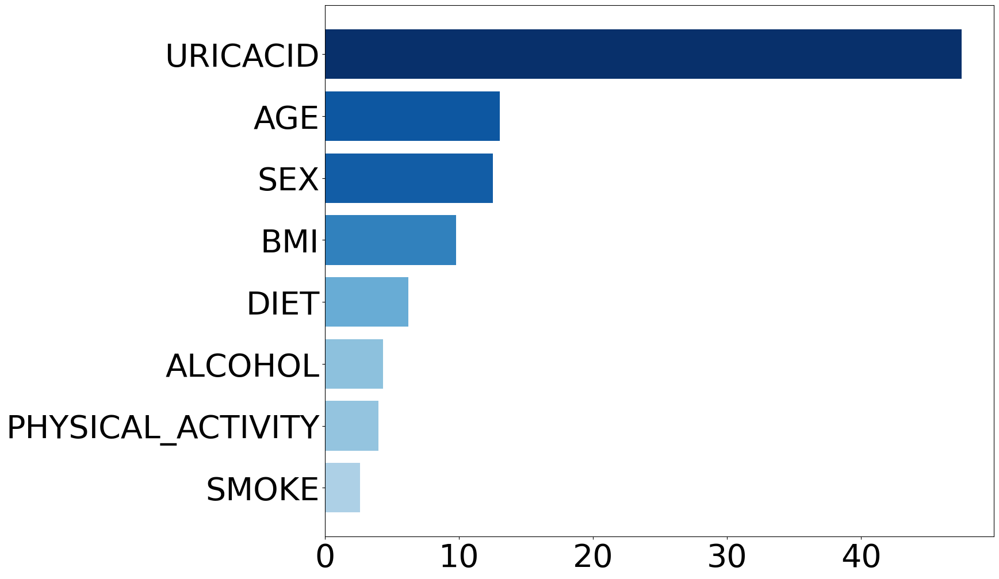

In [189]:
exp6_xgb_impsum_df2 = FeatureImportancePlot(exp6_xgb_importances2, exp6_column_list2, "Blues", 0.05)

In [190]:
# LGBM importances scale 조정
scale_exp6_lgbm_importances = Scale_LGBM_importances(exp6_lgbm_importances2)

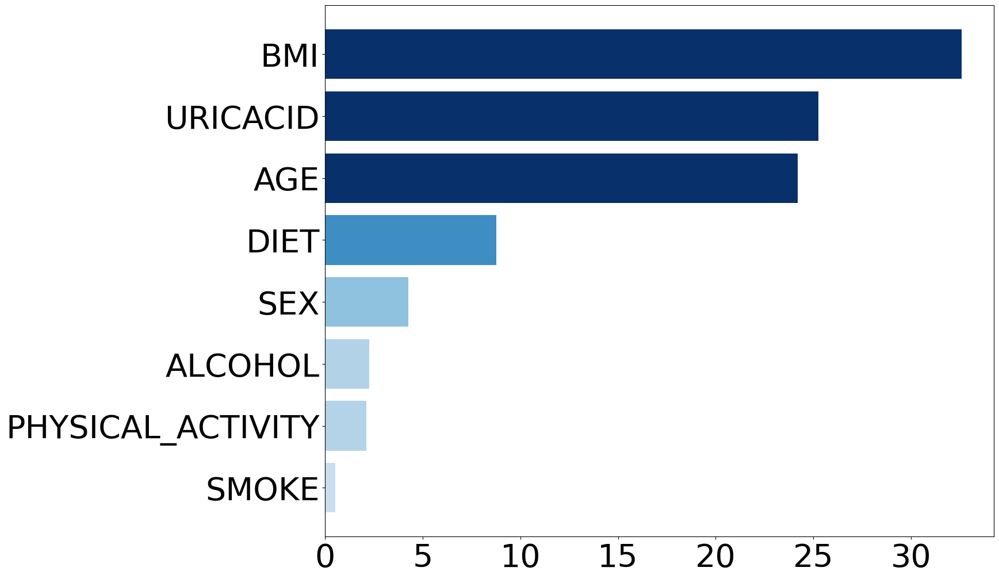

In [191]:
exp6_lgbm_impsum_df2 = FeatureImportancePlot(scale_exp6_lgbm_importances, exp6_column_list2, "Blues", 0.05)

In [149]:
exp6_lr_avg_ROC2 = Average_ROC(exp6_lr_true_df2, exp6_lr_prob_df2, exp6_lr_auc_df2, "LR")
exp6_rf_avg_ROC2 = Average_ROC(exp6_rf_true_df2, exp6_rf_prob_df2, exp6_rf_auc_df2, "RF")
exp6_dt_avg_ROC2 = Average_ROC(exp6_dt_true_df2, exp6_dt_prob_df2, exp6_dt_auc_df2, "DT")
exp6_xgb_avg_ROC2 = Average_ROC(exp6_xgb_true_df2, exp6_xgb_prob_df2, exp6_xgb_auc_df2, "XGB")
exp6_lgbm_avg_ROC2 = Average_ROC(exp6_lgbm_true_df2, exp6_lgbm_prob_df2, exp6_lgbm_auc_df2, "LGBM")

exp6_base_fpr_list2 = [exp6_lr_avg_ROC2[0], exp6_rf_avg_ROC2[0], exp6_dt_avg_ROC2[0], exp6_xgb_avg_ROC2[0], exp6_lgbm_avg_ROC2[0]]
exp6_mean_tprs_list2 = [exp6_lr_avg_ROC2[1], exp6_rf_avg_ROC2[1], exp6_dt_avg_ROC2[1], exp6_xgb_avg_ROC2[1], exp6_lgbm_avg_ROC2[1]]
exp6_tprs_lower_list2 = [exp6_lr_avg_ROC2[2], exp6_rf_avg_ROC2[2], exp6_dt_avg_ROC2[2], exp6_xgb_avg_ROC2[2], exp6_lgbm_avg_ROC2[2]]
exp6_tprs_upper_list2 = [exp6_lr_avg_ROC2[3], exp6_rf_avg_ROC2[3], exp6_dt_avg_ROC2[3], exp6_xgb_avg_ROC2[3], exp6_lgbm_avg_ROC2[3]]
exp6_legend_auc_list2 = [exp6_lr_avg_ROC2[4], exp6_rf_avg_ROC2[4], exp6_dt_avg_ROC2[4], exp6_xgb_avg_ROC2[4], exp6_lgbm_avg_ROC2[4]]

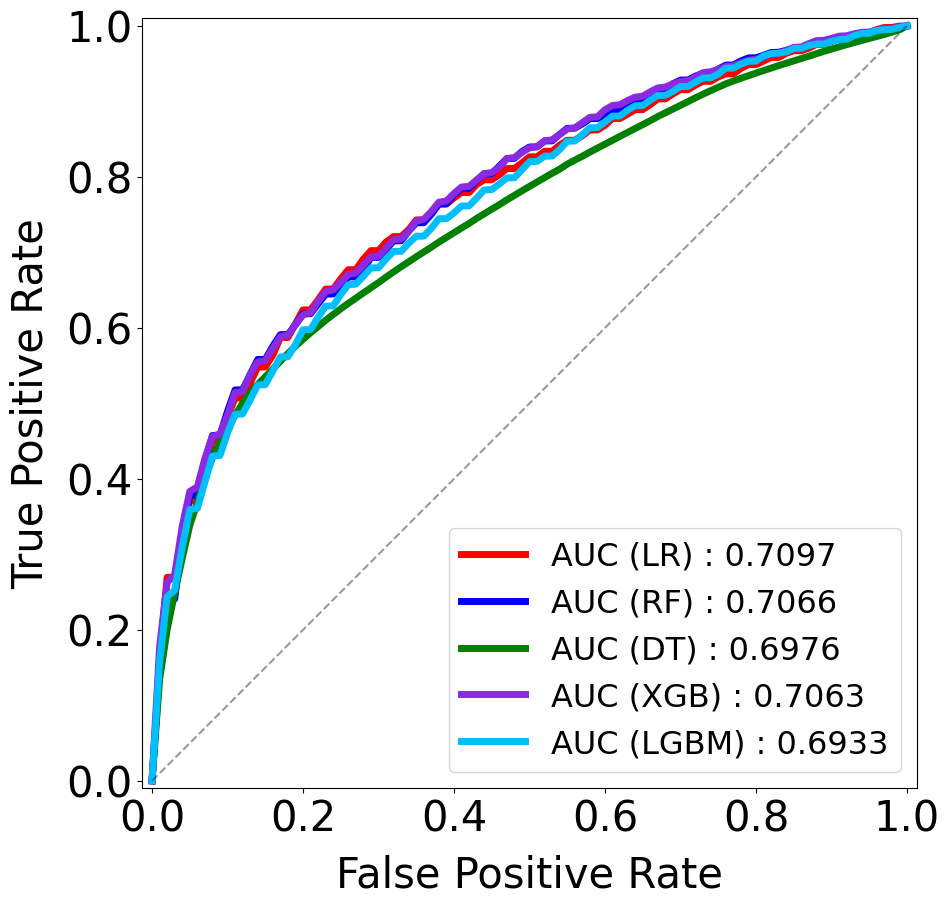

In [150]:
ROC_All_Curve(exp6_base_fpr_list2, exp6_mean_tprs_list2, exp6_tprs_lower_list2, exp6_tprs_upper_list2, exp6_legend_auc_list2)

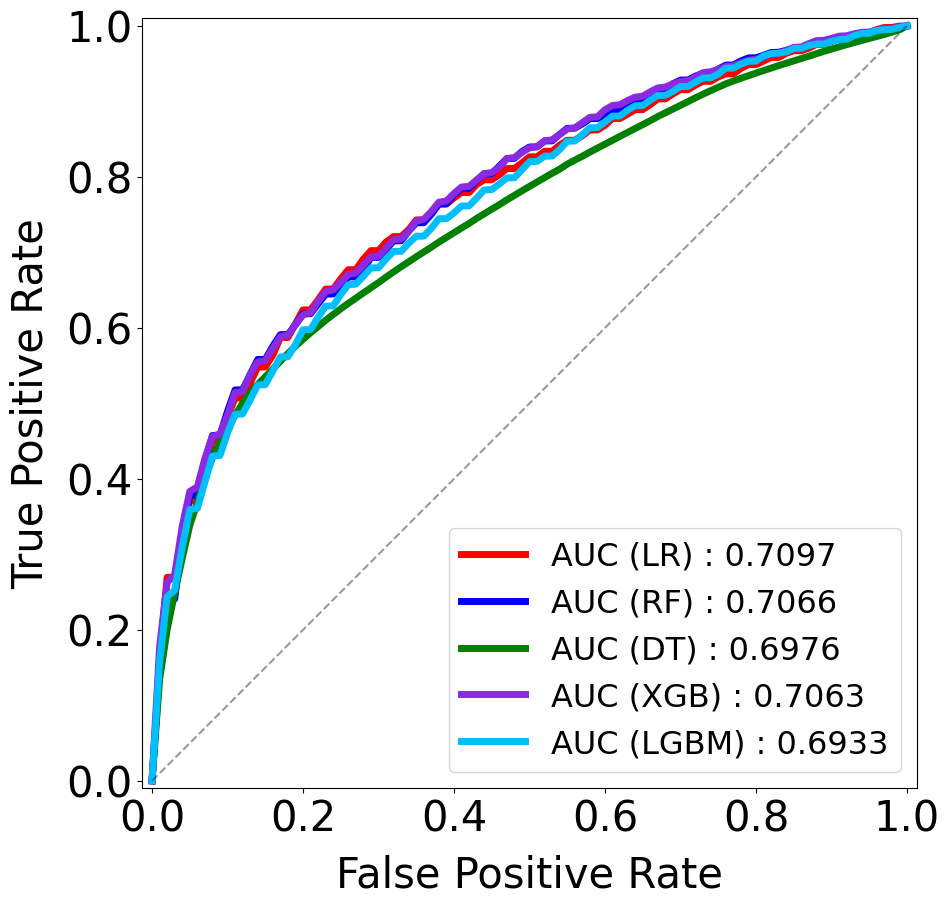

In [14]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp6_mean_tprs_list2)):
    plt.plot(exp6_base_fpr_list2[i], exp6_mean_tprs_list2[i], color_list[i], linewidth = 5, label = exp6_legend_auc_list2[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_Lifestyle_UA_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

### 7. AGE, SEX + Met + Urate

In [109]:
exp7_column_list2 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA", "URICACID"]
exp7_2_KoGES = pre_2_F_KoGES.loc[:, exp7_column_list2]
exp7_2_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA,URICACID
0,1,43,2,0,0,0,0,0,3.5
1,1,56,2,1,0,0,0,1,3.5
2,1,47,1,0,0,0,1,0,5.4
3,1,54,1,0,0,1,1,0,5.7
4,1,53,1,0,1,1,1,0,6.7


In [119]:
# Random Forest
exp7_rf_true_df2, exp7_rf_pred_df2, exp7_rf_prob_df2, exp7_rf_auc_df2, exp7_rf_importances2 = Iter_RandomForest(exp7_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 50}
2 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 150}
3 {'max_depth': 5, 'min_samples_split': 3, 'n_estimators': 10}
4 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 300}
5 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
6 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 300}
7 {'max_depth': 3, 'min_samples_split': 3, 'n_estimators': 100}
8 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
9 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
10 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
11 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 50}
12 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 300}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 300}
14 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 150}
15 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 300}
16 {'max_depth': 5, 'min_samples_sp

In [120]:
exp7_lr_true_df2, exp7_lr_pred_df2, exp7_lr_prob_df2, exp7_lr_auc_df2 = Iter_Logistic(exp7_2_KoGES, seed_list, False, nGt_sampling_size)

In [121]:
# Decision Tree
exp7_dt_true_df2, exp7_dt_pred_df2, exp7_dt_prob_df2, exp7_dt_auc_df2, exp7_dt_importances2 = Iter_DecisionTree(exp7_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'max_depth': 3, 'min_samples_split': 2}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 3, 'min_samples_split': 2}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 10}
8 {'max_depth': 3, 'min_samples_split': 2}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 10}
11 {'max_depth': 3, 'min_samples_split': 2}
12 {'max_depth': 3, 'min_samples_split': 2}
13 {'max_depth': 3, 'min_samples_split': 2}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 5, 'min_samples_split': 7}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 3, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 10}
20 {'max_depth': 5, 'min_samples_split': 5}
21 {'max_depth': 5, 'min_samples_split': 7}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 3, 'min_samples_split

In [347]:
# # XGBoost
# exp7_xgb_true_df2, exp7_xgb_pred_df2, exp7_xgb_prob_df2, exp7_xgb_auc_df2, exp7_xgb_importances2 = Iter_XGBoost(exp7_2_KoGES, seed_list, False, nGt_sampling_size)
exp7_xgb_true_df2 = xgb_AfImp_pkl["exp7"][0]
exp7_xgb_pred_df2 = xgb_AfImp_pkl["exp7"][1]
exp7_xgb_prob_df2 = xgb_AfImp_pkl["exp7"][2]
exp7_xgb_auc_df2 = xgb_AfImp_pkl["exp7"][3]
exp7_xgb_importances2 = xgb_AfImp_pkl["exp7"][4]

In [122]:
# LightGBM
exp7_lgbm_true_df2, exp7_lgbm_pred_df2, exp7_lgbm_prob_df2, exp7_lgbm_auc_df2, exp7_lgbm_importances2 = Iter_LightGBM(exp7_2_KoGES, seed_list, False, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.2, 'n_estimators': 10}
3 {'learning_rate': 0.2, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.1, 'n_estimators': 50}
7 {'learning_rate': 0.3, 'n_estimators': 10}
8 {'learning_rate': 0.1, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.5, 'n_estimators': 10}
11 {'learning_rate': 0.2, 'n_estimators': 10}
12 {'learning_rate': 0.2, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.1, 'n_estimators': 10}
15 {'learning_rate': 0.2, 'n_estimators': 10}
16 {'learning_rate': 0.1, 'n_estimators': 50}
17 {'learning_rate': 0.3, 'n_estimators': 10}
18 {'learning_rate': 0.4, 'n_estimators': 10}
19 {'learning_rate': 0.2, 'n_estimators': 10}
20 {'learning_rate': 0.1, 'n_estimators': 10}
21 {'learning_rate': 0.4, 'n_estimators': 10}
22 {'learning_rate': 0.2, 'n_estimators': 1

#### Outcome

In [344]:
exp7_lr_acc_list2, exp7_lr_f1_list2, exp7_lr_precision_list2, exp7_lr_recall_list2 = Calculate_metrics(exp7_lr_true_df2, exp7_lr_pred_df2)

ACC : 0.7131 (std : 0.0331)
F1-score : 0.6959 (std : 0.0375)
Precision : 0.7220 (std : 0.0408)
Recall : 0.6741 (std : 0.0539)


In [345]:
exp7_rf_acc_list2, exp7_rf_f1_list2, exp7_rf_precision_list2, exp7_rf_recall_list2 = Calculate_metrics(exp7_rf_true_df2, exp7_rf_pred_df2)

ACC : 0.7192 (std : 0.0379)
F1-score : 0.6797 (std : 0.0488)
Precision : 0.7673 (std : 0.0516)
Recall : 0.6137 (std : 0.0656)


In [346]:
exp7_dt_acc_list2, exp7_dt_f1_list2, exp7_dt_precision_list2, exp7_dt_recall_list2 = Calculate_metrics(exp7_dt_true_df2, exp7_dt_pred_df2)

ACC : 0.7037 (std : 0.0386)
F1-score : 0.6549 (std : 0.0518)
Precision : 0.7596 (std : 0.0560)
Recall : 0.5795 (std : 0.0684)


In [348]:
exp7_xgb_acc_list2, exp7_xgb_f1_list2, exp7_xgb_precision_list2, exp7_xgb_recall_list2 = Calculate_metrics(exp7_xgb_true_df2, exp7_xgb_pred_df2)

ACC : 0.7141 (std : 0.0393)
F1-score : 0.6784 (std : 0.0521)
Precision : 0.7518 (std : 0.0498)
Recall : 0.6225 (std : 0.0744)


In [349]:
exp7_lgbm_acc_list2, exp7_lgbm_f1_list2, exp7_lgbm_precision_list2, exp7_lgbm_recall_list2 = Calculate_metrics(exp7_lgbm_true_df2, exp7_lgbm_pred_df2)

ACC : 0.7043 (std : 0.0410)
F1-score : 0.6795 (std : 0.0473)
Precision : 0.7228 (std : 0.0514)
Recall : 0.6443 (std : 0.0630)


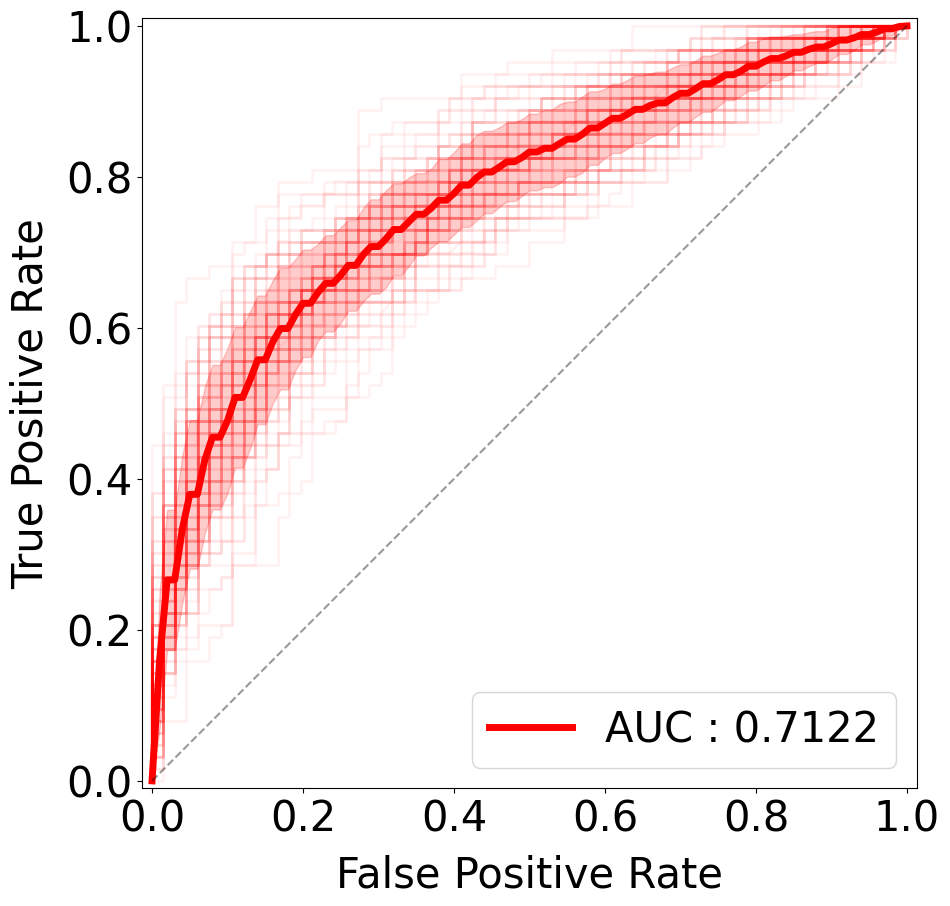

In [351]:
ROC_Curve(exp7_lr_true_df2, exp7_lr_prob_df2, exp7_lr_auc_df2, "r")

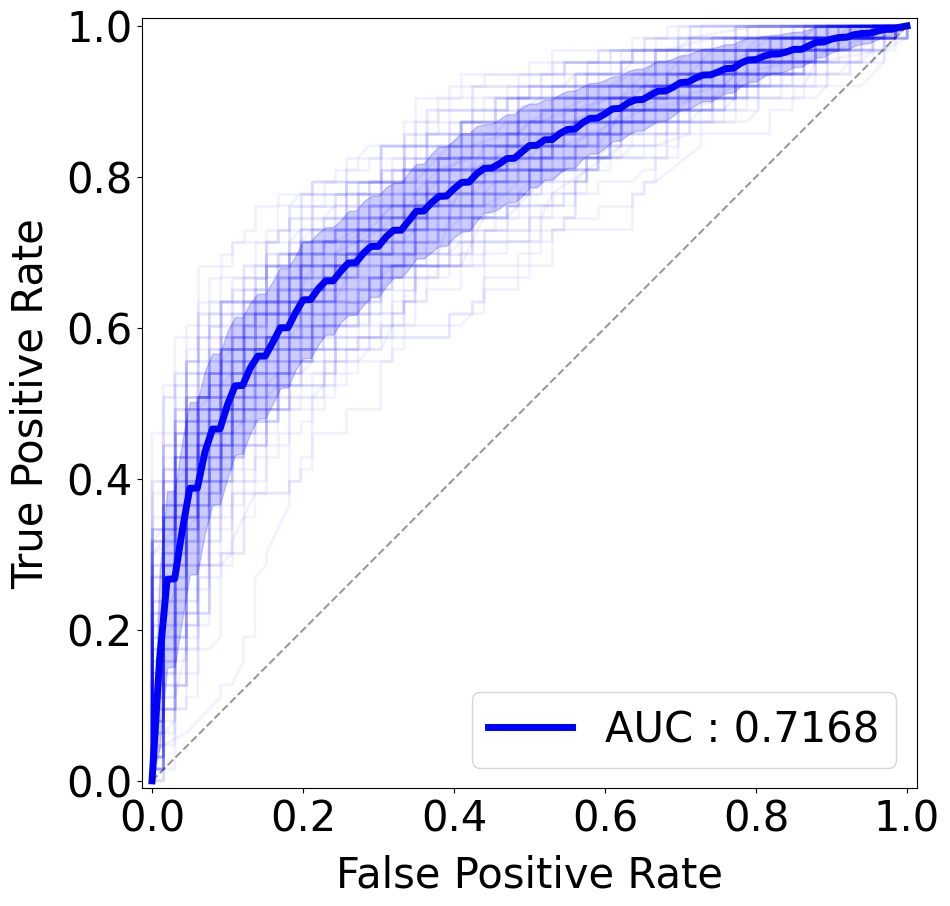

In [350]:
ROC_Curve(exp7_rf_true_df2, exp7_rf_prob_df2, exp7_rf_auc_df2, "b")

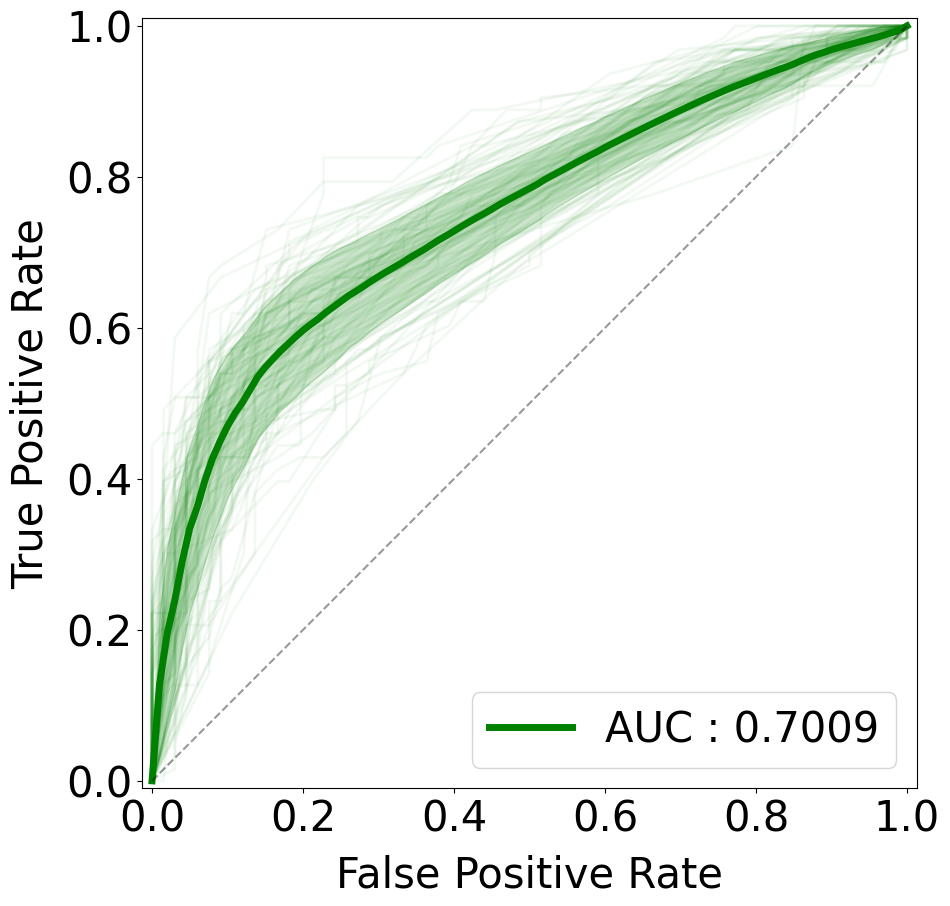

In [197]:
ROC_Curve(exp7_dt_true_df2, exp7_dt_prob_df2, exp7_dt_auc_df2, "green")

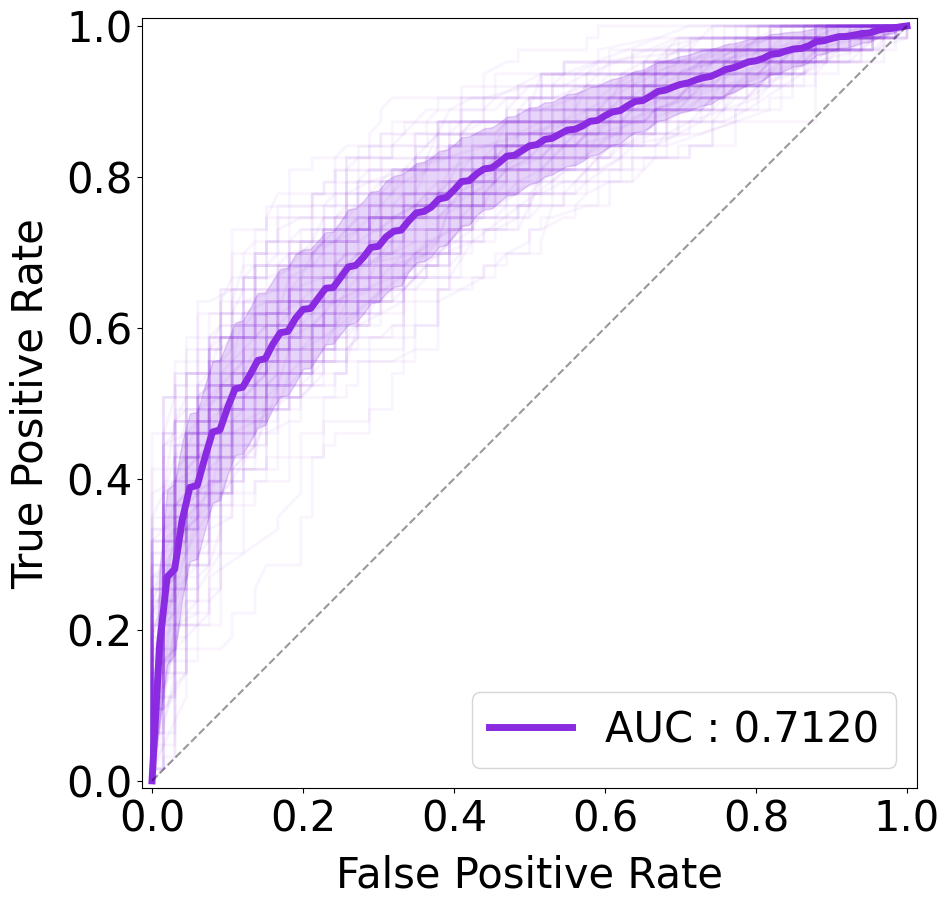

In [198]:
ROC_Curve(exp7_xgb_true_df2, exp7_xgb_prob_df2, exp7_xgb_auc_df2, "blueviolet")

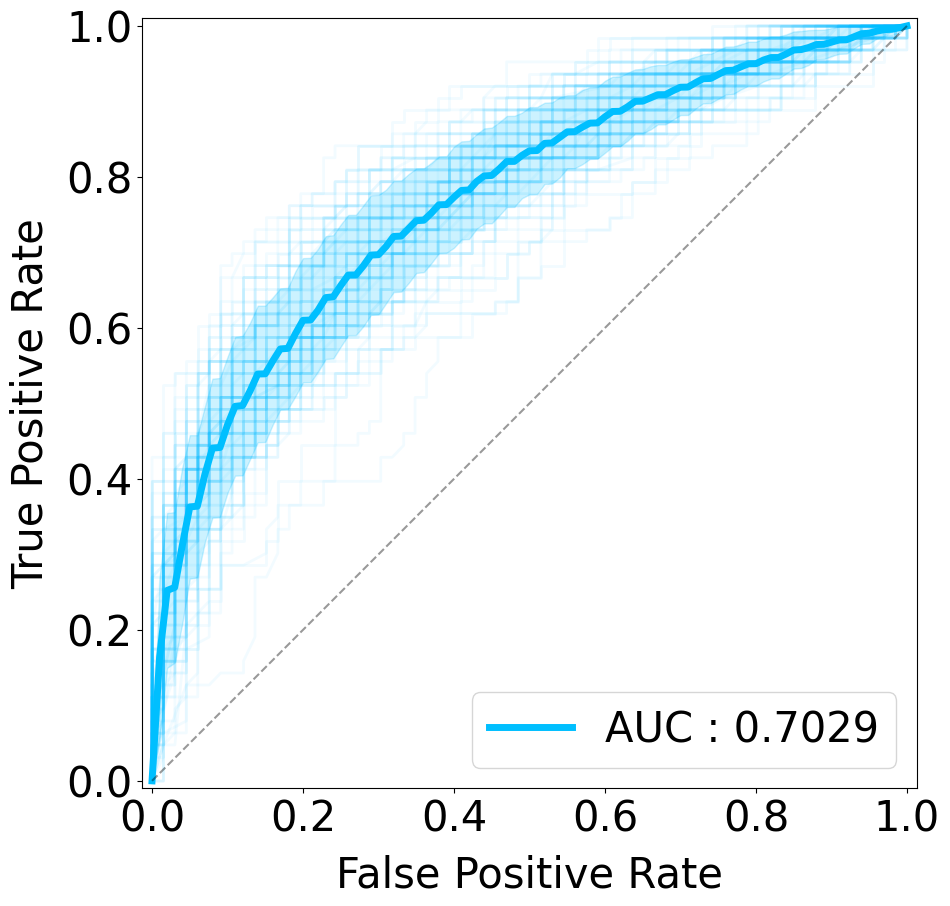

In [199]:
ROC_Curve(exp7_lgbm_true_df2, exp7_lgbm_prob_df2, exp7_lgbm_auc_df2, "deepskyblue")

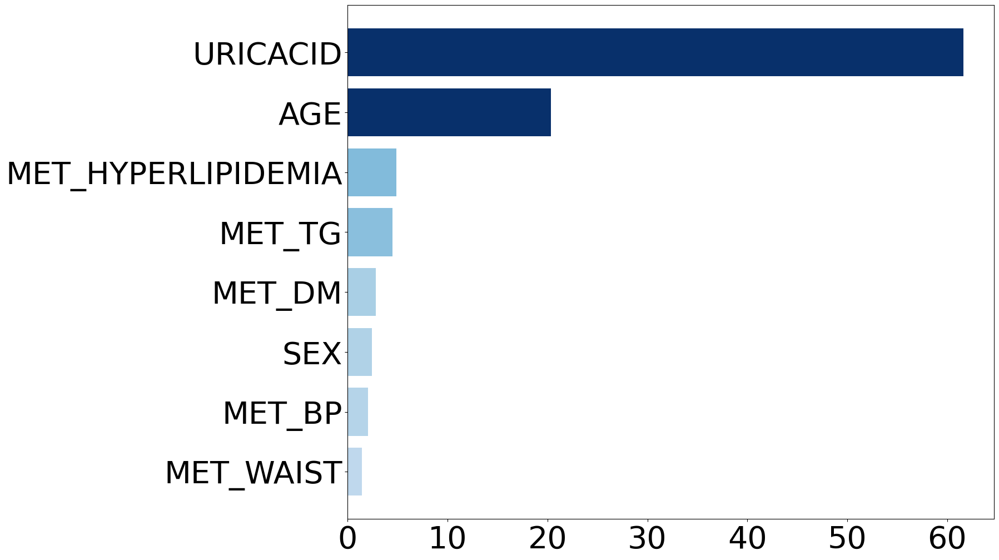

In [352]:
exp7_rf_impsum_df2 = FeatureImportancePlot(exp7_rf_importances2, exp7_column_list2, "Blues", 0.05)

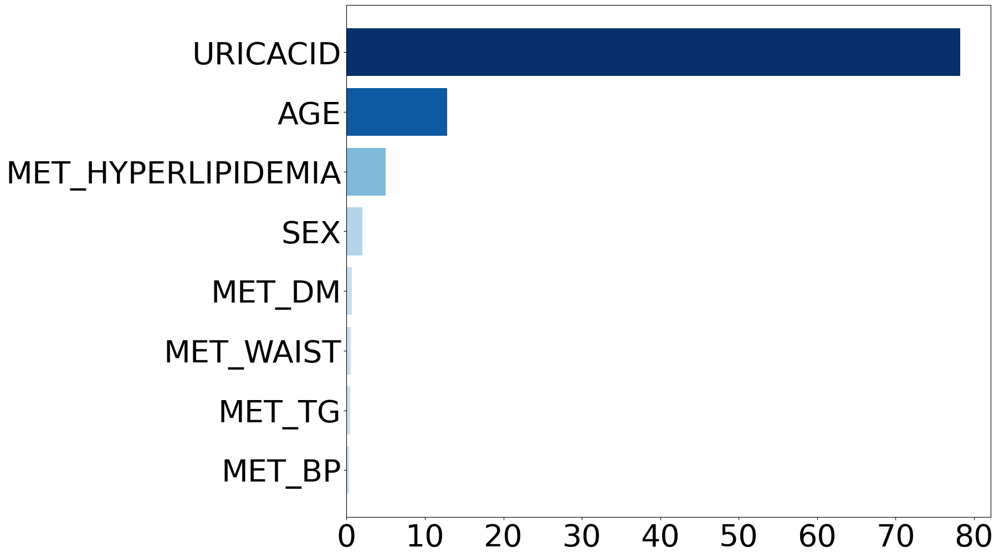

In [201]:
exp7_dt_impsum_df2 = FeatureImportancePlot(exp7_dt_importances2, exp7_column_list2, "Blues", 0.05)

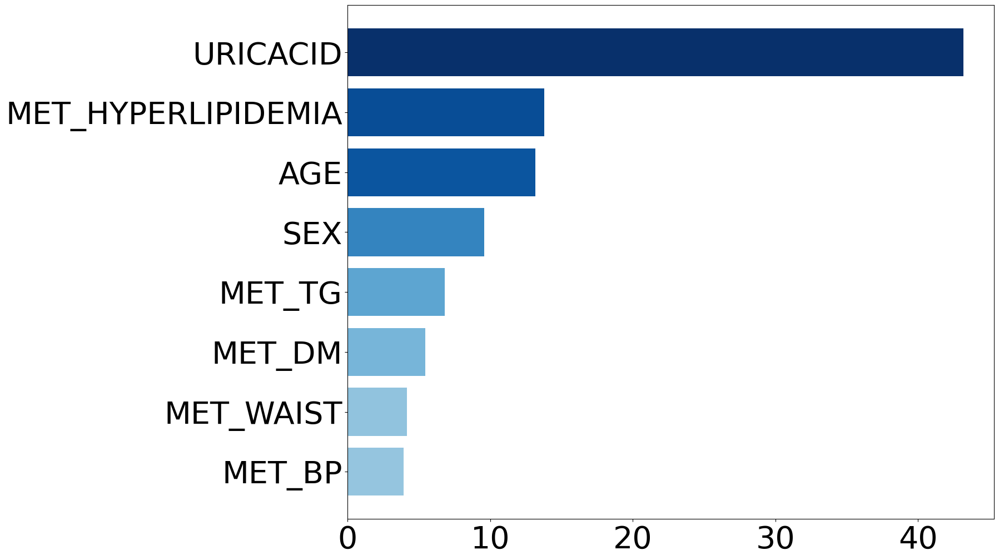

In [202]:
exp7_xgb_impsum_df2 = FeatureImportancePlot(exp7_xgb_importances2, exp7_column_list2, "Blues", 0.05)

In [203]:
# LGBM importances scale 조정
scale_exp7_lgbm_importances = Scale_LGBM_importances(exp7_lgbm_importances2)

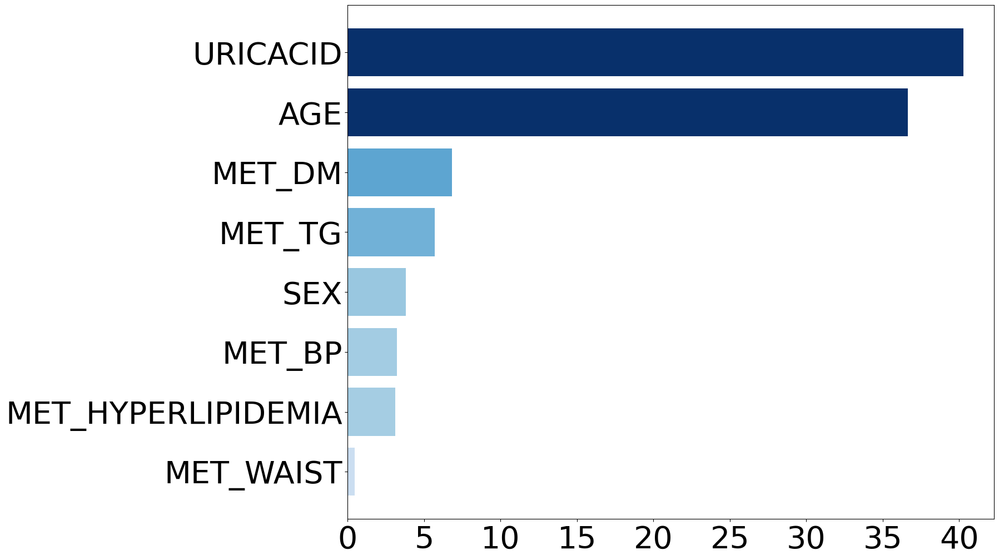

In [204]:
exp7_lgbm_impsum_df2 = FeatureImportancePlot(scale_exp7_lgbm_importances, exp7_column_list2, "Blues", 0.05)

In [151]:
exp7_lr_avg_ROC2 = Average_ROC(exp7_lr_true_df2, exp7_lr_prob_df2, exp7_lr_auc_df2, "LR")
exp7_rf_avg_ROC2 = Average_ROC(exp7_rf_true_df2, exp7_rf_prob_df2, exp7_rf_auc_df2, "RF")
exp7_dt_avg_ROC2 = Average_ROC(exp7_dt_true_df2, exp7_dt_prob_df2, exp7_dt_auc_df2, "DT")
exp7_xgb_avg_ROC2 = Average_ROC(exp7_xgb_true_df2, exp7_xgb_prob_df2, exp7_xgb_auc_df2, "XGB")
exp7_lgbm_avg_ROC2 = Average_ROC(exp7_lgbm_true_df2, exp7_lgbm_prob_df2, exp7_lgbm_auc_df2, "LGBM")

exp7_base_fpr_list2 = [exp7_lr_avg_ROC2[0], exp7_rf_avg_ROC2[0], exp7_dt_avg_ROC2[0], exp7_xgb_avg_ROC2[0], exp7_lgbm_avg_ROC2[0]]
exp7_mean_tprs_list2 = [exp7_lr_avg_ROC2[1], exp7_rf_avg_ROC2[1], exp7_dt_avg_ROC2[1], exp7_xgb_avg_ROC2[1], exp7_lgbm_avg_ROC2[1]]
exp7_tprs_lower_list2 = [exp7_lr_avg_ROC2[2], exp7_rf_avg_ROC2[2], exp7_dt_avg_ROC2[2], exp7_xgb_avg_ROC2[2], exp7_lgbm_avg_ROC2[2]]
exp7_tprs_upper_list2 = [exp7_lr_avg_ROC2[3], exp7_rf_avg_ROC2[3], exp7_dt_avg_ROC2[3], exp7_xgb_avg_ROC2[3], exp7_lgbm_avg_ROC2[3]]
exp7_legend_auc_list2 = [exp7_lr_avg_ROC2[4], exp7_rf_avg_ROC2[4], exp7_dt_avg_ROC2[4], exp7_xgb_avg_ROC2[4], exp7_lgbm_avg_ROC2[4]]

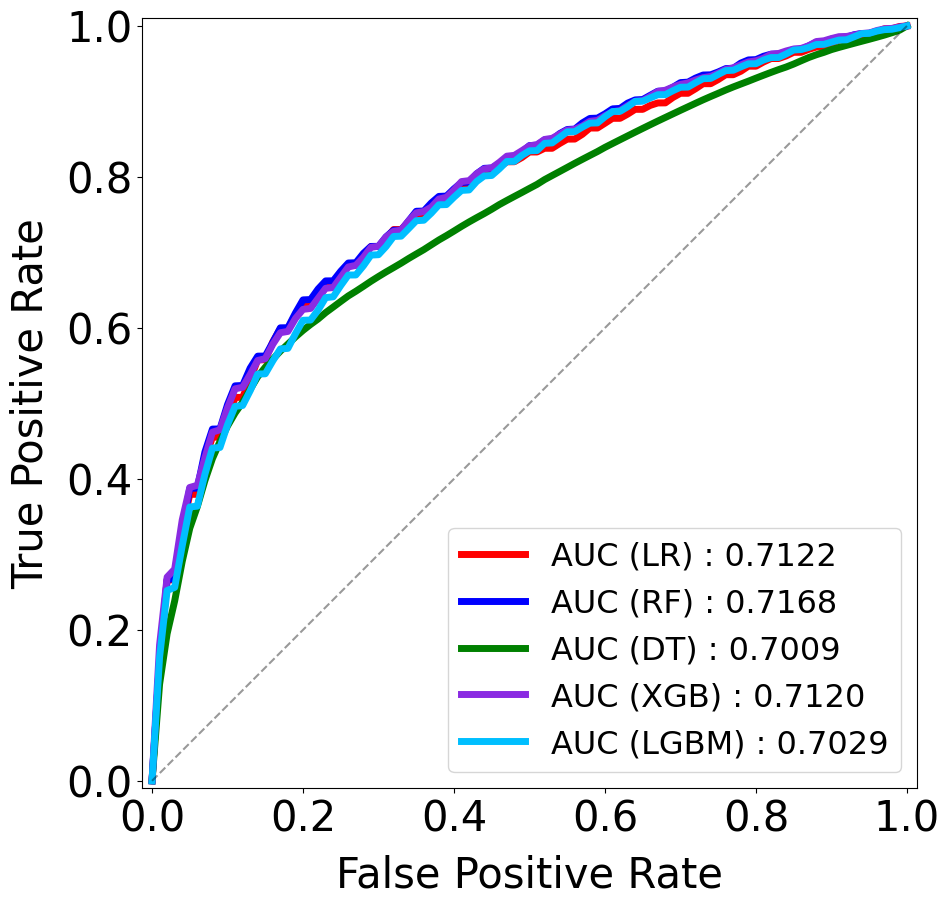

In [152]:
ROC_All_Curve(exp7_base_fpr_list2, exp7_mean_tprs_list2, exp7_tprs_lower_list2, exp7_tprs_upper_list2, exp7_legend_auc_list2)

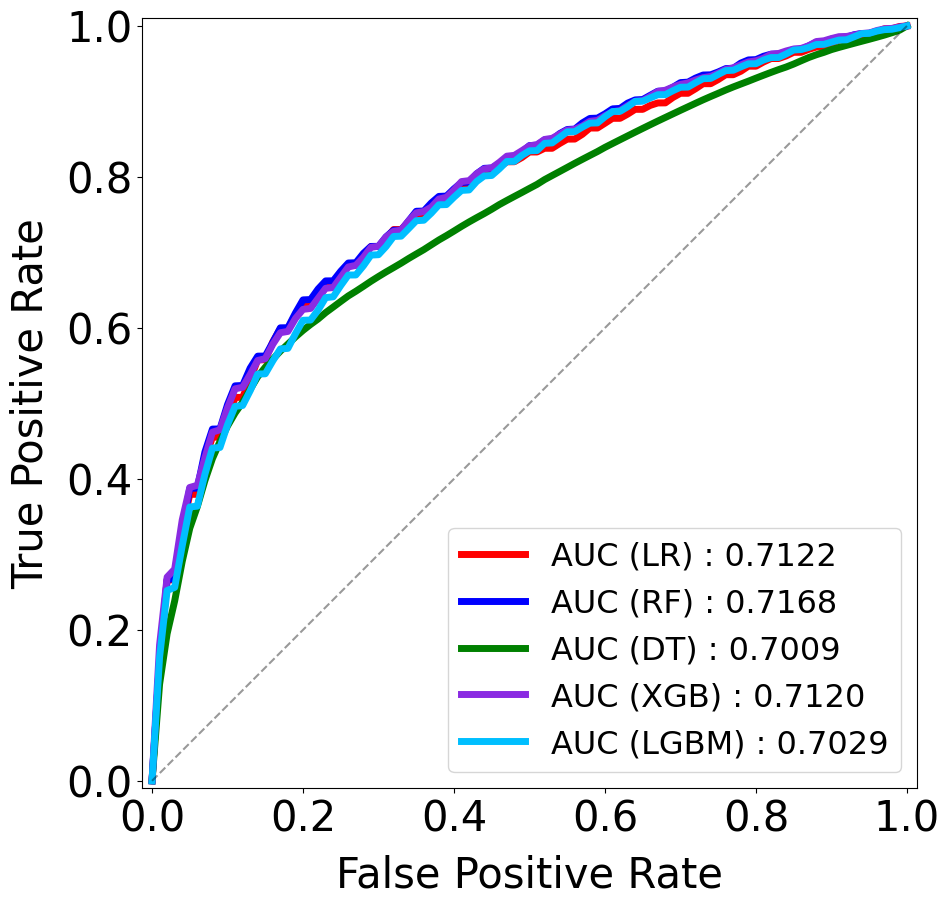

In [13]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp7_mean_tprs_list2)):
    plt.plot(exp7_base_fpr_list2[i], exp7_mean_tprs_list2[i], color_list[i], linewidth = 5, label = exp7_legend_auc_list2[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_MetS_UA_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

## 성능이 가장 좋은 PRS(PGS002762) 만 이용한 Modeling

### 3-2. only PGS002762

In [403]:
exp3_column_list3_2 = ["DISEASE", "PGS002762"]
exp3_3_KoGES_2 = pre_2_F_KoGES.loc[:, exp3_column_list3_2]
exp3_3_KoGES_2.head()

,DISEASE,PGS002762
0,1,-1.124843
1,1,-0.679097
2,1,-0.683763
3,1,-0.657040
4,1,-0.339189


In [405]:
# Random Forest
exp3_rf_true_df3_2, exp3_rf_pred_df3_2, exp3_rf_prob_df3_2, exp3_rf_auc_df3_2, exp3_rf_importances3_2 = Iter_RandomForest2(exp3_3_KoGES, ["PGS002762"], seed_list, True, nGt_sampling_size)

1 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
2 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
3 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 300}
4 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
5 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 50}
6 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 150}
7 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 50}
8 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
9 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
10 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 300}
11 {'max_depth': 5, 'min_samples_split': 3, 'n_estimators': 300}
12 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 300}
14 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 300}
15 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
16 {'max_depth': 3, 'min_samples_split

In [401]:
# Logistic
exp3_lr_true_df3_2, exp3_lr_pred_df3_2, exp3_lr_prob_df3_2, exp3_lr_auc_df3_2 = Iter_Logistic2(exp3_3_KoGES, ["PGS002762"], seed_list, True, nGt_sampling_size)

In [402]:
# Decision Tree
exp3_dt_true_df3_2, exp3_dt_pred_df3_2, exp3_dt_prob_df3_2, exp3_dt_auc_df3_2, exp3_dt_importances3_2 = Iter_DecisionTree2(exp3_3_KoGES, ["PGS002762"], seed_list, True, nGt_sampling_size)

1 {'max_depth': 3, 'min_samples_split': 2}
2 {'max_depth': 5, 'min_samples_split': 7}
3 {'max_depth': 5, 'min_samples_split': 10}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 3, 'min_samples_split': 2}
8 {'max_depth': 3, 'min_samples_split': 2}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 3, 'min_samples_split': 2}
11 {'max_depth': 3, 'min_samples_split': 2}
12 {'max_depth': 3, 'min_samples_split': 2}
13 {'max_depth': 3, 'min_samples_split': 2}
14 {'max_depth': 7, 'min_samples_split': 3}
15 {'max_depth': 5, 'min_samples_split': 5}
16 {'max_depth': 3, 'min_samples_split': 2}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 3, 'min_samples_split': 2}
19 {'max_depth': 3, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 3, 'min_samples_split':

In [414]:
# XGBoost
exp3_xgb_true_df3_2 = xgb_AfImp_pkl_prs1["exp3_2"][0]
exp3_xgb_pred_df3_2 = xgb_AfImp_pkl_prs1["exp3_2"][1]
exp3_xgb_prob_df3_2 = xgb_AfImp_pkl_prs1["exp3_2"][2]
exp3_xgb_auc_df3_2 = xgb_AfImp_pkl_prs1["exp3_2"][3]
exp3_xgb_importances3_2 = xgb_AfImp_pkl_prs1["exp3_2"][4]

In [406]:
# LightGBM
exp3_lgbm_true_df3_2, exp3_lgbm_pred_df3_2, exp3_lgbm_prob_df3_2, exp3_lgbm_auc_df3_2, exp3_lgbm_importances3_2 = Iter_LightGBM2(exp3_3_KoGES, ["PGS002762"], seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.1, 'n_estimators': 50}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 50}
6 {'learning_rate': 0.1, 'n_estimators': 10}
7 {'learning_rate': 0.1, 'n_estimators': 10}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.2, 'n_estimators': 150}
11 {'learning_rate': 0.2, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.2, 'n_estimators': 10}
15 {'learning_rate': 0.1, 'n_estimators': 150}
16 {'learning_rate': 0.6, 'n_estimators': 10}
17 {'learning_rate': 0.2, 'n_estimators': 10}
18 {'learning_rate': 0.2, 'n_estimators': 10}
19 {'learning_rate': 0.4, 'n_estimators': 10}
20 {'learning_rate': 0.2, 'n_estimators': 10}
21 {'learning_rate': 0.1, 'n_estimators': 50}
22 {'learning_rate': 0.3, 'n_estimators':

#### Outcome

#### Metrics

In [410]:
exp3_lr_acc_list3_2, exp3_lr_f1_list3_2, exp3_lr_precision_list3_2, exp3_lr_recall_list3_2 = Calculate_metrics(exp3_lr_true_df3_2, exp3_lr_pred_df3_2)

ACC : 0.6230 (std : 0.0420)
F1-score : 0.6054 (std : 0.0448)
Precision : 0.6195 (std : 0.0456)
Recall : 0.5929 (std : 0.0497)


In [411]:
exp3_rf_acc_list3_2, exp3_rf_f1_list3_2, exp3_rf_precision_list3_2, exp3_rf_recall_list3_2 = Calculate_metrics(exp3_rf_true_df3_2, exp3_rf_pred_df3_2)

ACC : 0.6194 (std : 0.0394)
F1-score : 0.5833 (std : 0.0449)
Precision : 0.6287 (std : 0.0501)
Recall : 0.5473 (std : 0.0577)


In [412]:
exp3_dt_acc_list3_2, exp3_dt_f1_list3_2, exp3_dt_precision_list3_2, exp3_dt_recall_list3_2 = Calculate_metrics(exp3_dt_true_df3_2, exp3_dt_pred_df3_2)

ACC : 0.6143 (std : 0.0405)
F1-score : 0.5793 (std : 0.0501)
Precision : 0.6240 (std : 0.0576)
Recall : 0.5483 (std : 0.0782)


In [416]:
exp3_xgb_acc_list3_2, exp3_xgb_f1_list3_2, exp3_xgb_precision_list3_2, exp3_xgb_recall_list3_2 = Calculate_metrics(exp3_xgb_true_df3_2, exp3_xgb_pred_df3_2)

ACC : 0.6228 (std : 0.0393)
F1-score : 0.5871 (std : 0.0467)
Precision : 0.6325 (std : 0.0513)
Recall : 0.5514 (std : 0.0633)


In [417]:
exp3_lgbm_acc_list3_2, exp3_lgbm_f1_list3_2, exp3_lgbm_precision_list3_2, exp3_lgbm_recall_list3_2 = Calculate_metrics(exp3_lgbm_true_df3_2, exp3_lgbm_pred_df3_2)

ACC : 0.5899 (std : 0.0416)
F1-score : 0.5594 (std : 0.0429)
Precision : 0.5911 (std : 0.0515)
Recall : 0.5338 (std : 0.0530)


#### feature importances

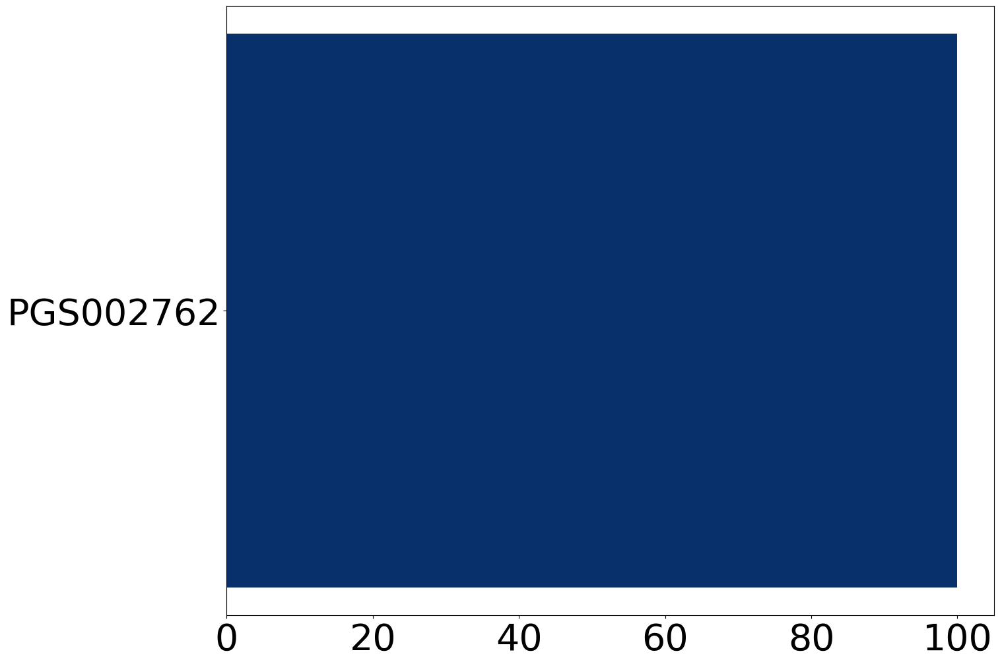

In [418]:
exp3_rf_impsum_df3_2 = FeatureImportancePlot(exp3_rf_importances3_2, exp3_column_list3_2, "Blues", 0.05)

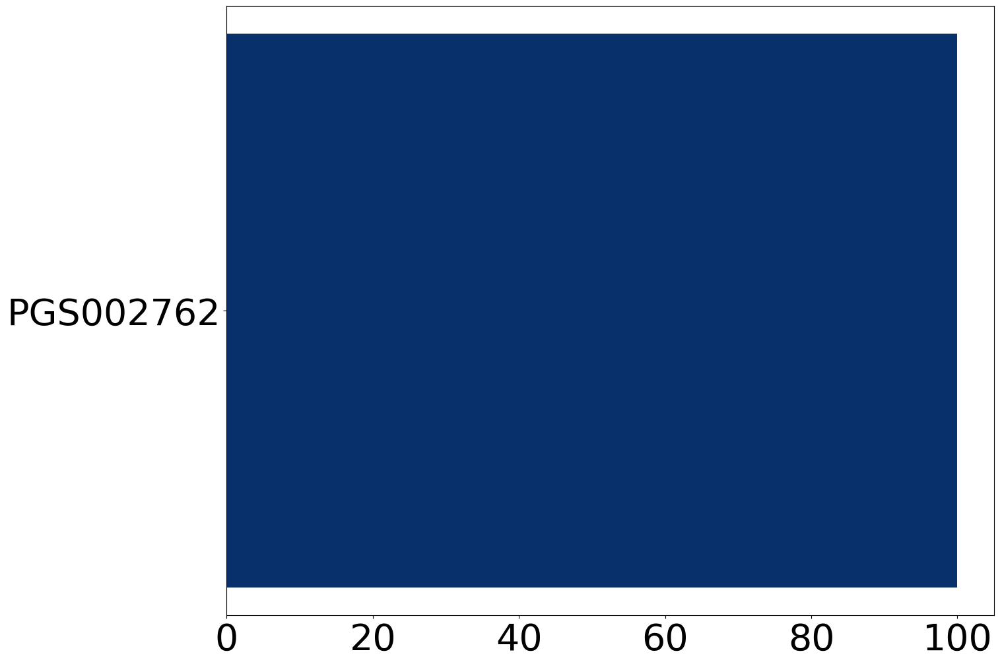

In [419]:
exp3_dt_impsum_df3_2 = FeatureImportancePlot(exp3_dt_importances3_2, exp3_column_list3_2, "Blues", 0.05)

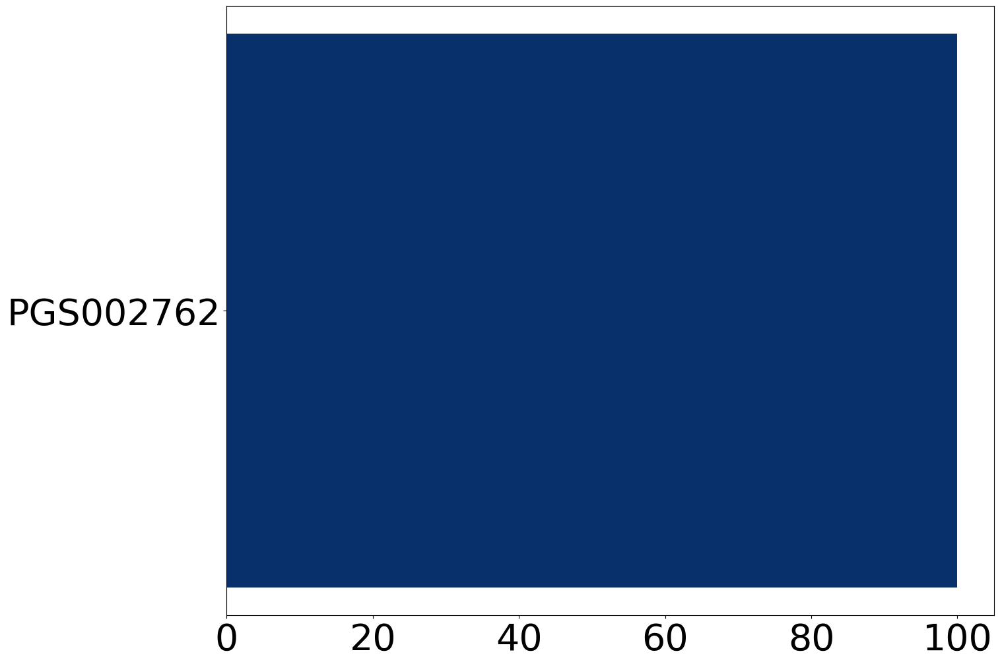

In [420]:
exp3_xgb_impsum_df3_2 = FeatureImportancePlot(exp3_xgb_importances3_2, exp3_column_list3_2, "Blues", 0.05)

In [421]:
# LGBM importances scale 조정
scale_exp3_lgbm_importances3_2 = Scale_LGBM_importances(exp3_lgbm_importances3_2)

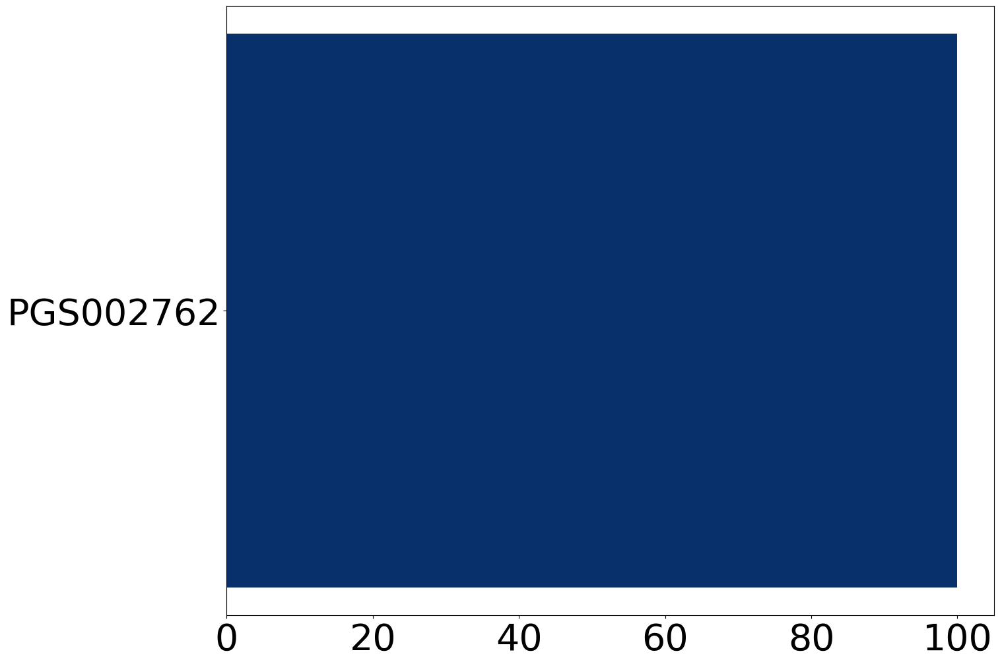

In [422]:
exp3_lgbm_impsum_df3_2 = FeatureImportancePlot(scale_exp3_lgbm_importances3_2, exp3_column_list3_2, "Blues", 0.05)

#### ROC curve

In [423]:
exp3_lr_avg_ROC3_2 = Average_ROC(exp3_lr_true_df3_2, exp3_lr_prob_df3_2, exp3_lr_auc_df3_2, "LR")
exp3_rf_avg_ROC3_2 = Average_ROC(exp3_rf_true_df3_2, exp3_rf_prob_df3_2, exp3_rf_auc_df3_2, "RF")
exp3_dt_avg_ROC3_2 = Average_ROC(exp3_dt_true_df3_2, exp3_dt_prob_df3_2, exp3_dt_auc_df3_2, "DT")
exp3_xgb_avg_ROC3_2 = Average_ROC(exp3_xgb_true_df3_2, exp3_xgb_prob_df3_2, exp3_xgb_auc_df3_2, "XGB")
exp3_lgbm_avg_ROC3_2 = Average_ROC(exp3_lgbm_true_df3_2, exp3_lgbm_prob_df3_2, exp3_lgbm_auc_df3_2, "LGBM")

exp3_base_fpr_list3_2 = [exp3_lr_avg_ROC3_2[0], exp3_rf_avg_ROC3_2[0], exp3_dt_avg_ROC3_2[0], exp3_xgb_avg_ROC3_2[0], exp3_lgbm_avg_ROC3_2[0]]
exp3_mean_tprs_list3_2 = [exp3_lr_avg_ROC3_2[1], exp3_rf_avg_ROC3_2[1], exp3_dt_avg_ROC3_2[1], exp3_xgb_avg_ROC3_2[1], exp3_lgbm_avg_ROC3_2[1]]
exp3_tprs_lower_list3_2 = [exp3_lr_avg_ROC3_2[2], exp3_rf_avg_ROC3_2[2], exp3_dt_avg_ROC3_2[2], exp3_xgb_avg_ROC3_2[2], exp3_lgbm_avg_ROC3_2[2]]
exp3_tprs_upper_list3_2 = [exp3_lr_avg_ROC3_2[3], exp3_rf_avg_ROC3_2[3], exp3_dt_avg_ROC3_2[3], exp3_xgb_avg_ROC3_2[3], exp3_lgbm_avg_ROC3_2[3]]
exp3_legend_auc_list3_2 = [exp3_lr_avg_ROC3_2[4], exp3_rf_avg_ROC3_2[4], exp3_dt_avg_ROC3_2[4], exp3_xgb_avg_ROC3_2[4], exp3_lgbm_avg_ROC3_2[4]]

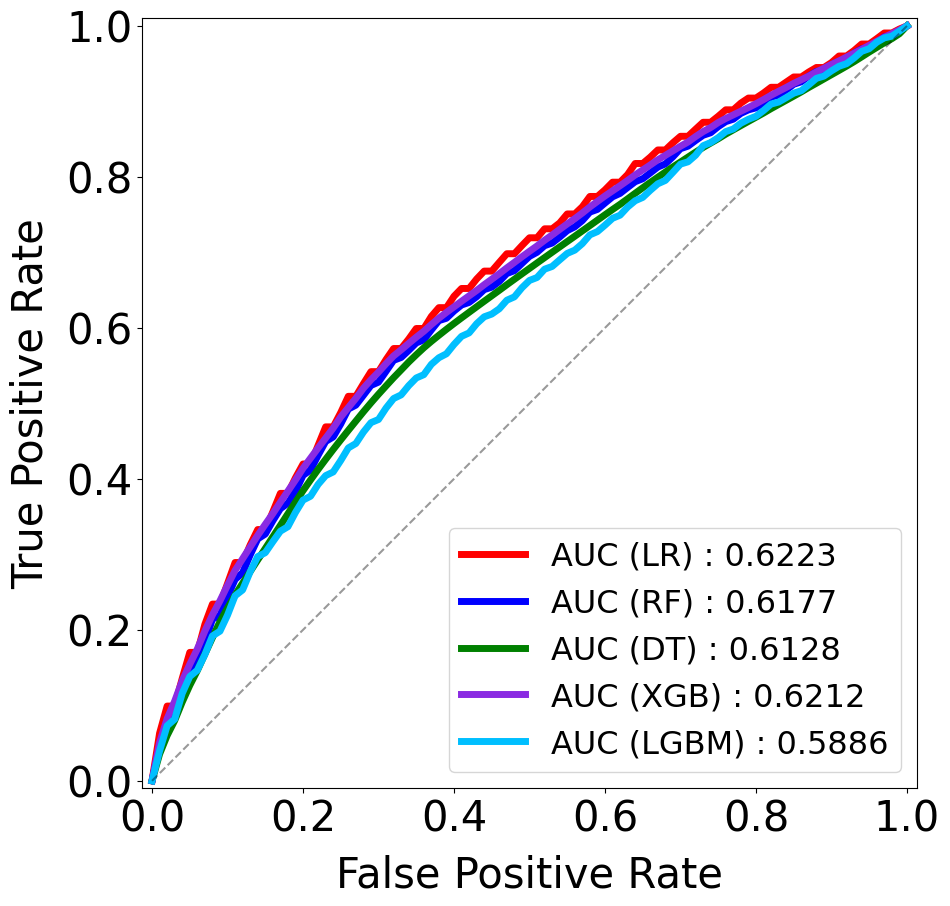

In [424]:
ROC_All_Curve(exp3_base_fpr_list3_2, exp3_mean_tprs_list3_2, exp3_tprs_lower_list3_2, exp3_tprs_upper_list3_2, exp3_legend_auc_list3_2)

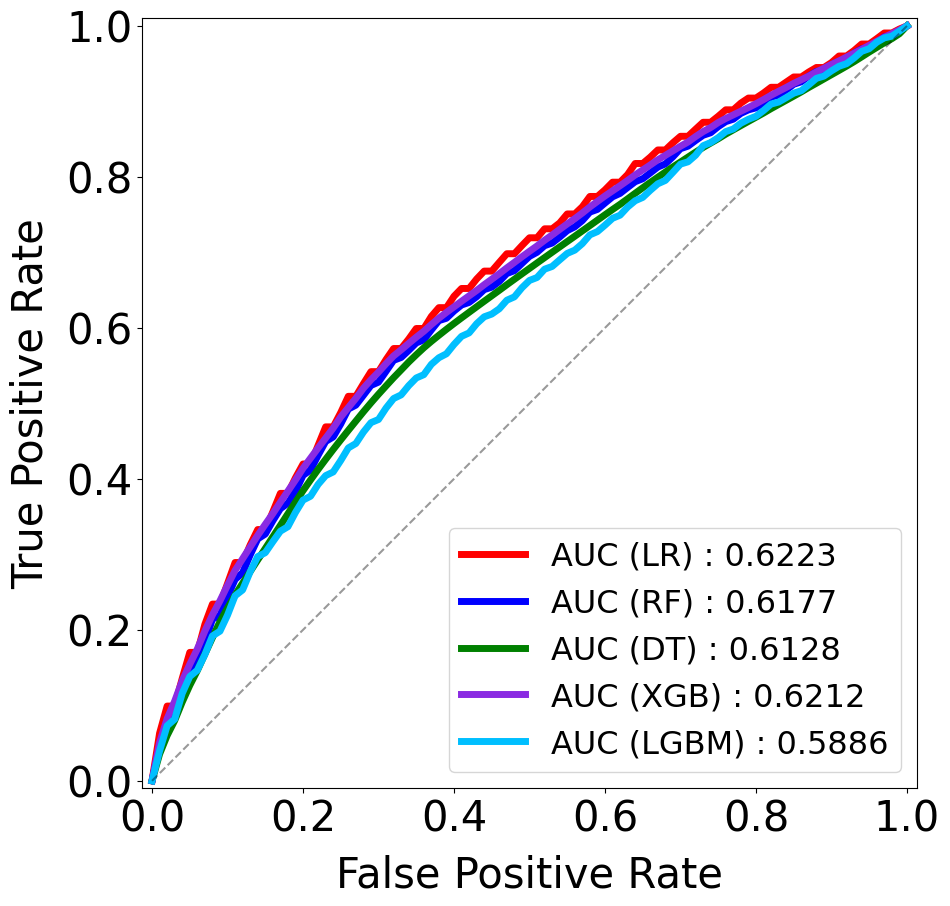

In [18]:
import matplotlib as mpl

# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp3_mean_tprs_list3_2)):
    plt.plot(exp3_base_fpr_list3_2[i], exp3_mean_tprs_list3_2[i], color_list[i], linewidth = 5, label = exp3_legend_auc_list3_2[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_PRS_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

### 4. AGE, SEX, Lifestyle, PRS (Figure에 싣지 않음)

In [31]:
exp4_column_list3 = ["DISEASE", "AGE", "SEX", 
                    "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY", "DIET",
                    "PGS002762"]
exp4_3_KoGES = pre_2_F_KoGES.loc[:, exp4_column_list3]
exp4_3_KoGES.head()

,DISEASE,AGE,SEX,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,DIET,PGS002762
0,1,43,2,18.40,0,0,0,6,-1.124843
1,1,56,2,22.06,0,1,0,7,-0.679097
2,1,47,1,30.48,1,1,0,5,-0.683763
3,1,54,1,26.17,0,0,0,5,-0.657040
4,1,53,1,26.16,0,1,0,4,-0.339189


In [32]:
# Random Forest
exp4_rf_true_df3, exp4_rf_pred_df3, exp4_rf_prob_df3, exp4_rf_auc_df3, exp4_rf_importances3 = Iter_RandomForest(exp4_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 50}
2 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 50}
3 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 50}
4 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 50}
5 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 150}
6 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 50}
7 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 300}
8 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 50}
9 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
10 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 100}
11 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 100}
12 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}
13 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 50}
14 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 150}
15 {'max_depth': 10, 'min_samples_split': 3, 'n_estimators': 50}
16 {'max_depth': 7, 'min_samples_split

In [53]:
# Logistic
exp4_lr_true_df3, exp4_lr_pred_df3, exp4_lr_prob_df3, exp4_lr_auc_df3 = Iter_Logistic(exp4_3_KoGES, seed_list, True, nGt_sampling_size)

In [54]:
# DecisionTree
exp4_dt_true_df3, exp4_dt_pred_df3, exp4_dt_prob_df3, exp4_dt_auc_df3, exp4_dt_importances3 = Iter_DecisionTree(exp4_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 3, 'min_samples_split': 2}
2 {'max_depth': 5, 'min_samples_split': 2}
3 {'max_depth': 7, 'min_samples_split': 10}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 5, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 2}
8 {'max_depth': 3, 'min_samples_split': 2}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 3, 'min_samples_split': 2}
12 {'max_depth': 5, 'min_samples_split': 2}
13 {'max_depth': 5, 'min_samples_split': 2}
14 {'max_depth': 5, 'min_samples_split': 10}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 3, 'min_samples_split': 2}
17 {'max_depth': 5, 'min_samples_split': 10}
18 {'max_depth': 3, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 10}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 7, 'min_samples_split': 5}
23 {'max_depth': 3, 'min_samples_spli

In [73]:
exp4_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp4"][0]
exp4_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp4"][1]
exp4_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp4"][2]
exp4_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp4"][3]
exp4_xgb_importances3 = xgb_AfImp_pkl_prs1["exp4"][4]

In [65]:
# LightGBM
exp4_lgbm_true_df3, exp4_lgbm_pred_df3, exp4_lgbm_prob_df3, exp4_lgbm_auc_df3, exp4_lgbm_importances3 = Iter_LightGBM(exp4_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.7, 'n_estimators': 100}
2 {'learning_rate': 0.2, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.3, 'n_estimators': 10}
7 {'learning_rate': 0.2, 'n_estimators': 10}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.1, 'n_estimators': 10}
10 {'learning_rate': 0.2, 'n_estimators': 10}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.5, 'n_estimators': 10}
13 {'learning_rate': 0.1, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.9, 'n_estimators': 10}
16 {'learning_rate': 0.1, 'n_estimators': 50}
17 {'learning_rate': 0.3, 'n_estimators': 10}
18 {'learning_rate': 0.1, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 10}
20 {'learning_rate': 0.2, 'n_estimators': 10}
21 {'learning_rate': 0.1, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 

#### Metrics

In [107]:
exp4_lr_acc_list3, exp4_lr_f1_list3, exp4_lr_precision_list3, exp4_lr_recall_list3 = Calculate_metrics(exp4_lr_true_df3, exp4_lr_pred_df3)

ACC : 0.6544 (std : 0.0402)
F1-score : 0.6424 (std : 0.0431)
Precision : 0.6498 (std : 0.0439)
Recall : 0.6365 (std : 0.0515)


In [108]:
exp4_rf_acc_list3, exp4_rf_f1_list3, exp4_rf_precision_list3, exp4_rf_recall_list3 = Calculate_metrics(exp4_rf_true_df3, exp4_rf_pred_df3)

ACC : 0.6453 (std : 0.0379)
F1-score : 0.6173 (std : 0.0445)
Precision : 0.6529 (std : 0.0452)
Recall : 0.5876 (std : 0.0572)


In [109]:
exp4_dt_acc_list3, exp4_dt_f1_list3, exp4_dt_precision_list3, exp4_dt_recall_list3 = Calculate_metrics(exp4_dt_true_df3, exp4_dt_pred_df3)

ACC : 0.6190 (std : 0.0410)
F1-score : 0.5957 (std : 0.0578)
Precision : 0.6216 (std : 0.0533)
Recall : 0.5837 (std : 0.1011)


In [110]:
exp4_xgb_acc_list3, exp4_xgb_f1_list3, exp4_xgb_precision_list3, exp4_xgb_recall_list3 = Calculate_metrics(exp4_xgb_true_df3, exp4_xgb_pred_df3)

ACC : 0.6395 (std : 0.0392)
F1-score : 0.6139 (std : 0.0466)
Precision : 0.6436 (std : 0.0455)
Recall : 0.5890 (std : 0.0597)


In [111]:
exp4_lgbm_acc_list3, exp4_lgbm_f1_list3, exp4_lgbm_precision_list3, exp4_lgbm_recall_list3 = Calculate_metrics(exp4_lgbm_true_df3, exp4_lgbm_pred_df3)

ACC : 0.6200 (std : 0.0467)
F1-score : 0.6016 (std : 0.0520)
Precision : 0.6167 (std : 0.0502)
Recall : 0.5895 (std : 0.0643)


#### feature importances

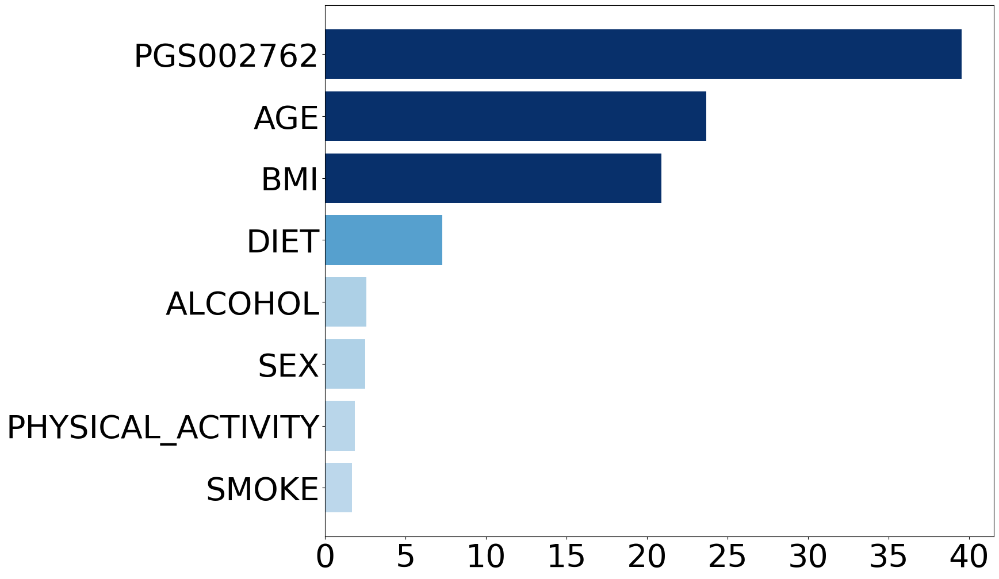

In [112]:
exp4_rf_impsum_df3 = FeatureImportancePlot(exp4_rf_importances3, exp4_column_list3, "Blues", 0.05)

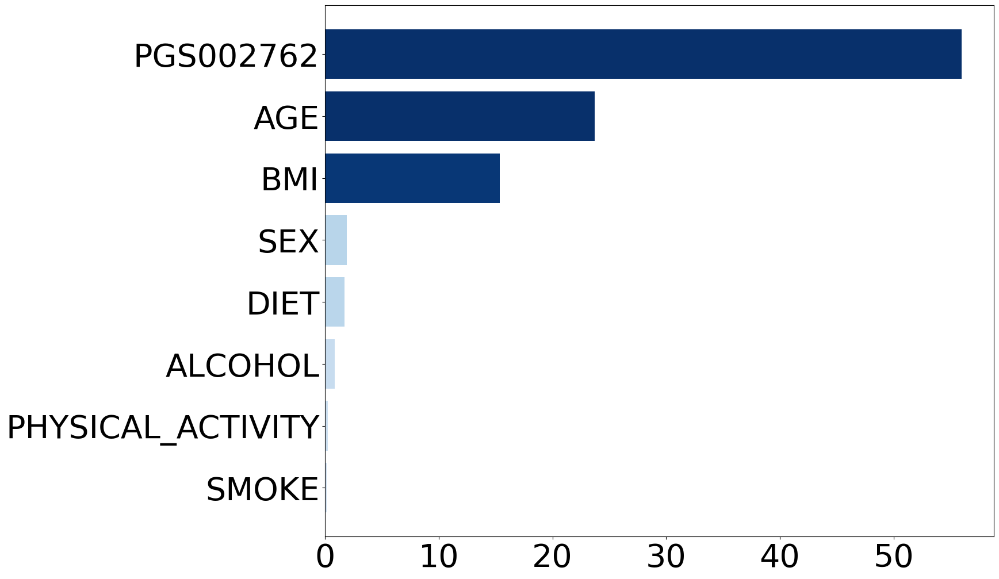

In [113]:
exp4_dt_impsum_df3 = FeatureImportancePlot(exp4_dt_importances3, exp4_column_list3, "Blues", 0.05)

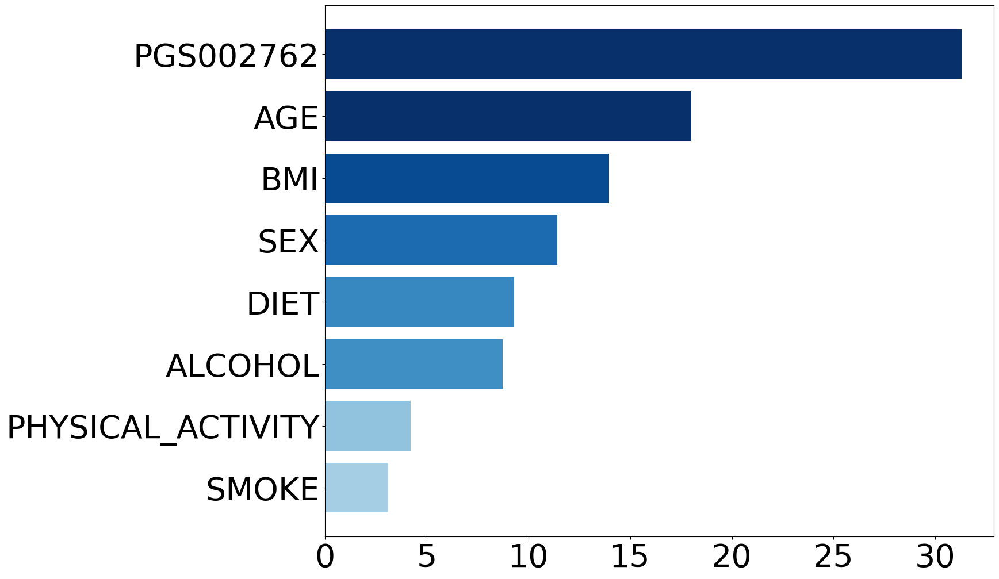

In [114]:
exp4_xgb_impsum_df3 = FeatureImportancePlot(exp4_xgb_importances3, exp4_column_list3, "Blues", 0.05)

In [115]:
# LGBM importances scale 조정
scale_exp4_lgbm_importances3 = Scale_LGBM_importances(exp4_lgbm_importances3)

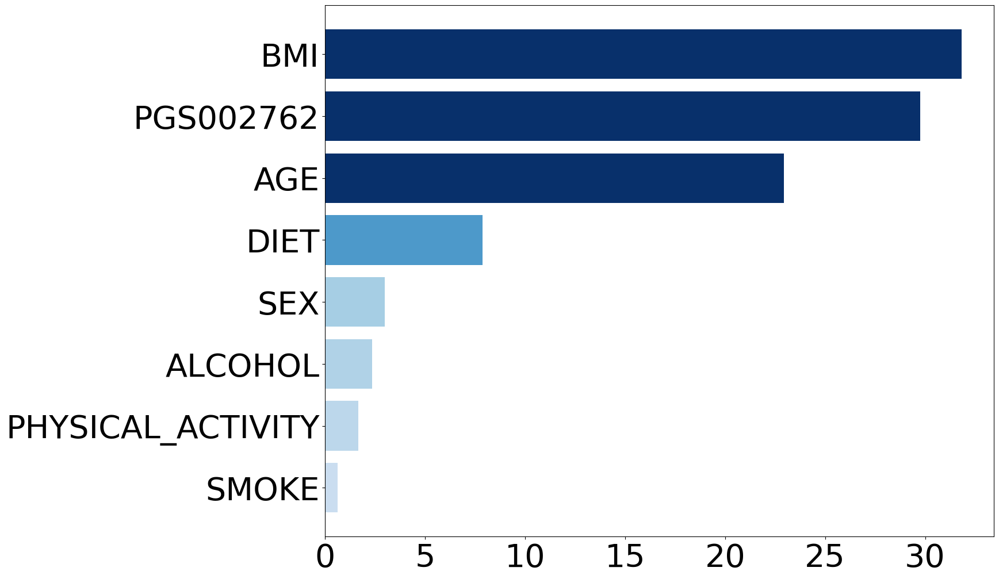

In [116]:
exp4_lgbm_impsum_df3 = FeatureImportancePlot(scale_exp4_lgbm_importances3, exp4_column_list3, "Blues", 0.05)

#### ROC curve

In [82]:
exp4_lr_avg_ROC3 = Average_ROC(exp4_lr_true_df3, exp4_lr_prob_df3, exp4_lr_auc_df3, "LR")
exp4_rf_avg_ROC3 = Average_ROC(exp4_rf_true_df3, exp4_rf_prob_df3, exp4_rf_auc_df3, "RF")
exp4_dt_avg_ROC3 = Average_ROC(exp4_dt_true_df3, exp4_dt_prob_df3, exp4_dt_auc_df3, "DT")
exp4_xgb_avg_ROC3 = Average_ROC(exp4_xgb_true_df3, exp4_xgb_prob_df3, exp4_xgb_auc_df3, "XGB")
exp4_lgbm_avg_ROC3 = Average_ROC(exp4_lgbm_true_df3, exp4_lgbm_prob_df3, exp4_lgbm_auc_df3, "LGBM")

exp4_base_fpr_list3 = [exp4_lr_avg_ROC3[0], exp4_rf_avg_ROC3[0], exp4_dt_avg_ROC3[0], exp4_xgb_avg_ROC3[0], exp4_lgbm_avg_ROC3[0]]
exp4_mean_tprs_list3 = [exp4_lr_avg_ROC3[1], exp4_rf_avg_ROC3[1], exp4_dt_avg_ROC3[1], exp4_xgb_avg_ROC3[1], exp4_lgbm_avg_ROC3[1]]
exp4_tprs_lower_list3 = [exp4_lr_avg_ROC3[2], exp4_rf_avg_ROC3[2], exp4_dt_avg_ROC3[2], exp4_xgb_avg_ROC3[2], exp4_lgbm_avg_ROC3[2]]
exp4_tprs_upper_list3 = [exp4_lr_avg_ROC3[3], exp4_rf_avg_ROC3[3], exp4_dt_avg_ROC3[3], exp4_xgb_avg_ROC3[3], exp4_lgbm_avg_ROC3[3]]
exp4_legend_auc_list3 = [exp4_lr_avg_ROC3[4], exp4_rf_avg_ROC3[4], exp4_dt_avg_ROC3[4], exp4_xgb_avg_ROC3[4], exp4_lgbm_avg_ROC3[4]]

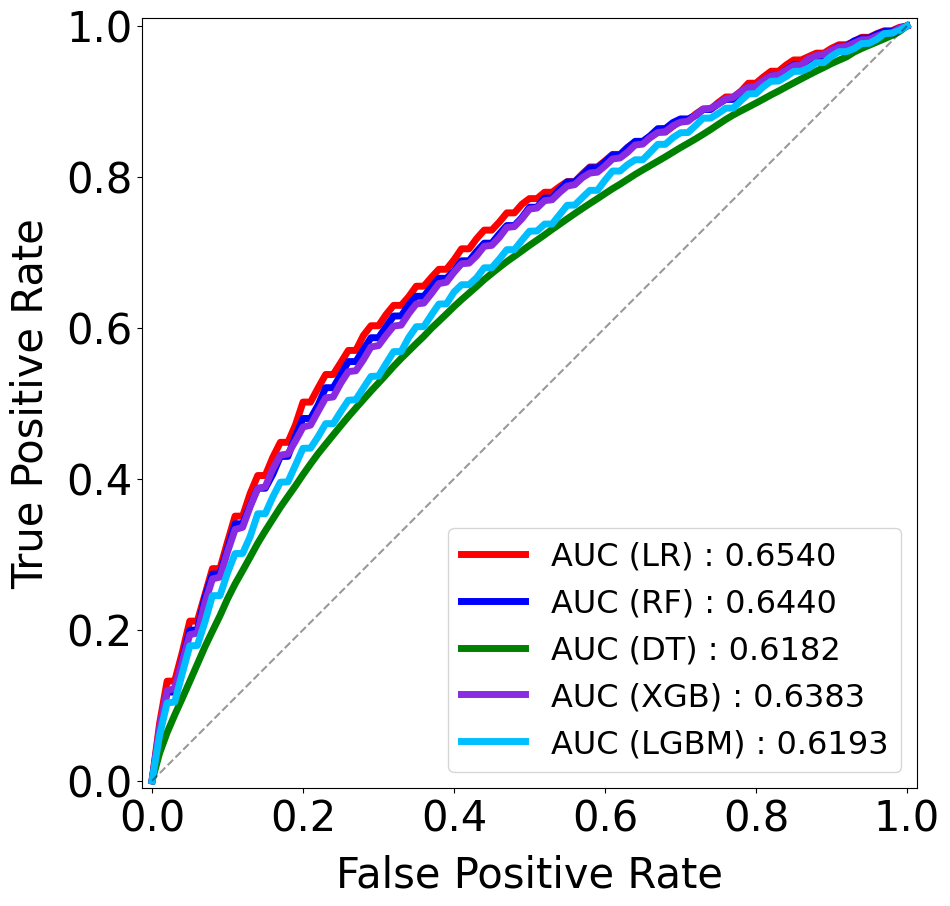

In [83]:
ROC_All_Curve(exp4_base_fpr_list3, exp4_mean_tprs_list3, exp4_tprs_lower_list3, exp4_tprs_upper_list3, exp4_legend_auc_list3)

### 5. AGE, SEX, Metabolic syndrome, PRS (Figure에 싣지 않음)

In [34]:
exp5_column_list3 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                     "PGS002762"]
exp5_3_KoGES = pre_2_F_KoGES.loc[:, exp5_column_list3]
exp5_3_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA,PGS002762
0,1,43,2,0,0,0,0,0,-1.124843
1,1,56,2,1,0,0,0,1,-0.679097
2,1,47,1,0,0,0,1,0,-0.683763
3,1,54,1,0,0,1,1,0,-0.657040
4,1,53,1,0,1,1,1,0,-0.339189


In [35]:
# Random Forest
exp5_rf_true_df3, exp5_rf_pred_df3, exp5_rf_prob_df3, exp5_rf_auc_df3, exp5_rf_importances3 = Iter_RandomForest(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 300}
2 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
3 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
4 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 100}
5 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 300}
6 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}
7 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 150}
8 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 150}
9 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
10 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}
11 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 300}
12 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 150}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
14 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
15 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
16 {'max_depth': 7, 'min_samples_s

In [55]:
exp5_lr_true_df3, exp5_lr_pred_df3, exp5_lr_prob_df3, exp5_lr_auc_df3 = Iter_Logistic(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

In [56]:
exp5_dt_true_df3, exp5_dt_pred_df3, exp5_dt_prob_df3, exp5_dt_auc_df3, exp5_dt_importances3 = Iter_DecisionTree(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 7}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 3, 'min_samples_split': 2}
8 {'max_depth': 5, 'min_samples_split': 2}
9 {'max_depth': 5, 'min_samples_split': 3}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 5, 'min_samples_split': 10}
13 {'max_depth': 5, 'min_samples_split': 10}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 5, 'min_samples_split': 10}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 5, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 5, 'min_samples_split': 2}
22 {'max_depth': 5, 'min_samples_split': 10}
23 {'max_depth': 5, 'min_samples_spl

In [74]:
exp5_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp5"][0]
exp5_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp5"][1]
exp5_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp5"][2]
exp5_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp5"][3]
exp5_xgb_importances3 = xgb_AfImp_pkl_prs1["exp5"][4]

In [66]:
exp5_lgbm_true_df3, exp5_lgbm_pred_df3, exp5_lgbm_prob_df3, exp5_lgbm_auc_df3, exp5_lgbm_importances3 = Iter_LightGBM(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.3, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.2, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.2, 'n_estimators': 10}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.1, 'n_estimators': 50}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.4, 'n_estimators': 10}
16 {'learning_rate': 0.3, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.2, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 50}
20 {'learning_rate': 0.4, 'n_estimators': 10}
21 {'learning_rate': 0.3, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

In [34]:
exp5_column_list3 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                     "PGS002762"]
exp5_3_KoGES = pre_2_F_KoGES.loc[:, exp5_column_list3]
exp5_3_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA,PGS002762
0,1,43,2,0,0,0,0,0,-1.124843
1,1,56,2,1,0,0,0,1,-0.679097
2,1,47,1,0,0,0,1,0,-0.683763
3,1,54,1,0,0,1,1,0,-0.657040
4,1,53,1,0,1,1,1,0,-0.339189


In [35]:
# Random Forest
exp5_rf_true_df3, exp5_rf_pred_df3, exp5_rf_prob_df3, exp5_rf_auc_df3, exp5_rf_importances3 = Iter_RandomForest(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 300}
2 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
3 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
4 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 100}
5 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 300}
6 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}
7 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 150}
8 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 150}
9 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
10 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}
11 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 300}
12 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 150}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
14 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
15 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
16 {'max_depth': 7, 'min_samples_s

In [55]:
exp5_lr_true_df3, exp5_lr_pred_df3, exp5_lr_prob_df3, exp5_lr_auc_df3 = Iter_Logistic(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

In [56]:
exp5_dt_true_df3, exp5_dt_pred_df3, exp5_dt_prob_df3, exp5_dt_auc_df3, exp5_dt_importances3 = Iter_DecisionTree(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 7}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 3, 'min_samples_split': 2}
8 {'max_depth': 5, 'min_samples_split': 2}
9 {'max_depth': 5, 'min_samples_split': 3}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 5, 'min_samples_split': 10}
13 {'max_depth': 5, 'min_samples_split': 10}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 5, 'min_samples_split': 10}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 5, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 5, 'min_samples_split': 2}
22 {'max_depth': 5, 'min_samples_split': 10}
23 {'max_depth': 5, 'min_samples_spl

In [74]:
exp5_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp5"][0]
exp5_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp5"][1]
exp5_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp5"][2]
exp5_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp5"][3]
exp5_xgb_importances3 = xgb_AfImp_pkl_prs1["exp5"][4]

In [66]:
exp5_lgbm_true_df3, exp5_lgbm_pred_df3, exp5_lgbm_prob_df3, exp5_lgbm_auc_df3, exp5_lgbm_importances3 = Iter_LightGBM(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.3, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.2, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.2, 'n_estimators': 10}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.1, 'n_estimators': 50}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.4, 'n_estimators': 10}
16 {'learning_rate': 0.3, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.2, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 50}
20 {'learning_rate': 0.4, 'n_estimators': 10}
21 {'learning_rate': 0.3, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

In [34]:
exp5_column_list3 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                     "PGS002762"]
exp5_3_KoGES = pre_2_F_KoGES.loc[:, exp5_column_list3]
exp5_3_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA,PGS002762
0,1,43,2,0,0,0,0,0,-1.124843
1,1,56,2,1,0,0,0,1,-0.679097
2,1,47,1,0,0,0,1,0,-0.683763
3,1,54,1,0,0,1,1,0,-0.657040
4,1,53,1,0,1,1,1,0,-0.339189


In [35]:
# Random Forest
exp5_rf_true_df3, exp5_rf_pred_df3, exp5_rf_prob_df3, exp5_rf_auc_df3, exp5_rf_importances3 = Iter_RandomForest(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 300}
2 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
3 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
4 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 100}
5 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 300}
6 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}
7 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 150}
8 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 150}
9 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
10 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 150}
11 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 300}
12 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 150}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
14 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
15 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
16 {'max_depth': 7, 'min_samples_s

In [55]:
exp5_lr_true_df3, exp5_lr_pred_df3, exp5_lr_prob_df3, exp5_lr_auc_df3 = Iter_Logistic(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

In [56]:
exp5_dt_true_df3, exp5_dt_pred_df3, exp5_dt_prob_df3, exp5_dt_auc_df3, exp5_dt_importances3 = Iter_DecisionTree(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 10}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 7}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 3, 'min_samples_split': 2}
8 {'max_depth': 5, 'min_samples_split': 2}
9 {'max_depth': 5, 'min_samples_split': 3}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 5, 'min_samples_split': 10}
13 {'max_depth': 5, 'min_samples_split': 10}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 3, 'min_samples_split': 2}
16 {'max_depth': 5, 'min_samples_split': 10}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 5, 'min_samples_split': 2}
19 {'max_depth': 5, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 5, 'min_samples_split': 2}
22 {'max_depth': 5, 'min_samples_split': 10}
23 {'max_depth': 5, 'min_samples_spl

In [74]:
exp5_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp5"][0]
exp5_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp5"][1]
exp5_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp5"][2]
exp5_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp5"][3]
exp5_xgb_importances3 = xgb_AfImp_pkl_prs1["exp5"][4]

In [66]:
exp5_lgbm_true_df3, exp5_lgbm_pred_df3, exp5_lgbm_prob_df3, exp5_lgbm_auc_df3, exp5_lgbm_importances3 = Iter_LightGBM(exp5_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.3, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.2, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.2, 'n_estimators': 10}
8 {'learning_rate': 0.2, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.1, 'n_estimators': 50}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.4, 'n_estimators': 10}
16 {'learning_rate': 0.3, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.2, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 50}
20 {'learning_rate': 0.4, 'n_estimators': 10}
21 {'learning_rate': 0.3, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

#### Metrics

In [117]:
exp5_lr_acc_list3, exp5_lr_f1_list3, exp5_lr_precision_list3, exp5_lr_recall_list3 = Calculate_metrics(exp5_lr_true_df3, exp5_lr_pred_df3)

ACC : 0.6640 (std : 0.0426)
F1-score : 0.6533 (std : 0.0457)
Precision : 0.6587 (std : 0.0453)
Recall : 0.6494 (std : 0.0543)


In [118]:
exp5_rf_acc_list3, exp5_rf_f1_list3, exp5_rf_precision_list3, exp5_rf_recall_list3 = Calculate_metrics(exp5_rf_true_df3, exp5_rf_pred_df3)

ACC : 0.6528 (std : 0.0415)
F1-score : 0.6298 (std : 0.0478)
Precision : 0.6572 (std : 0.0470)
Recall : 0.6068 (std : 0.0611)


In [119]:
exp5_dt_acc_list3, exp5_dt_f1_list3, exp5_dt_precision_list3, exp5_dt_recall_list3 = Calculate_metrics(exp5_dt_true_df3, exp5_dt_pred_df3)

ACC : 0.6295 (std : 0.0400)
F1-score : 0.5972 (std : 0.0574)
Precision : 0.6368 (std : 0.0490)
Recall : 0.5687 (std : 0.0854)


In [120]:
exp5_xgb_acc_list3, exp5_xgb_f1_list3, exp5_xgb_precision_list3, exp5_xgb_recall_list3 = Calculate_metrics(exp5_xgb_true_df3, exp5_xgb_pred_df3)

ACC : 0.6484 (std : 0.0401)
F1-score : 0.6291 (std : 0.0462)
Precision : 0.6489 (std : 0.0441)
Recall : 0.6129 (std : 0.0615)


In [121]:
exp5_lgbm_acc_list3, exp5_lgbm_f1_list3, exp5_lgbm_precision_list3, exp5_lgbm_recall_list3 = Calculate_metrics(exp5_lgbm_true_df3, exp5_lgbm_pred_df3)

ACC : 0.6295 (std : 0.0405)
F1-score : 0.6152 (std : 0.0452)
Precision : 0.6248 (std : 0.0445)
Recall : 0.6086 (std : 0.0615)


#### feature importances

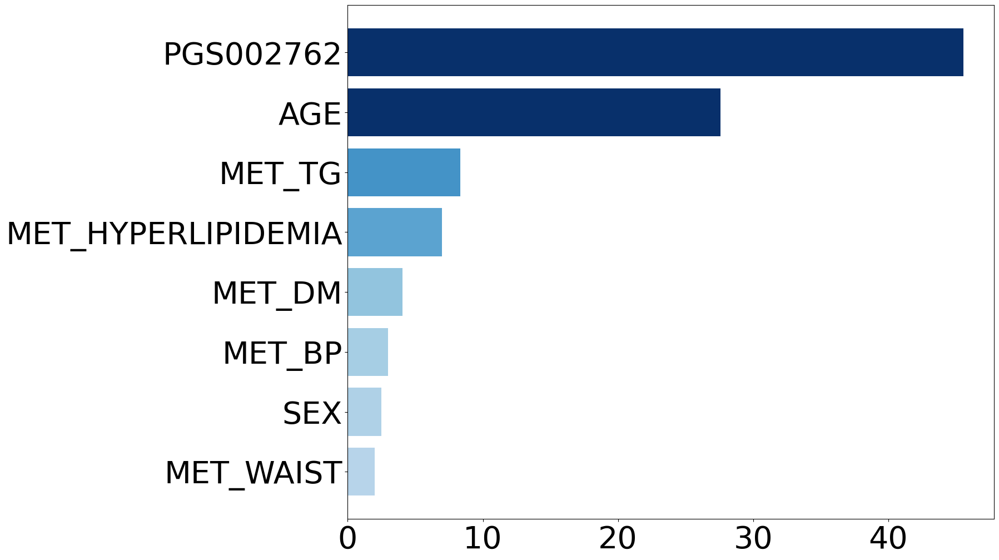

In [122]:
exp5_rf_impsum_df3 = FeatureImportancePlot(exp5_rf_importances3, exp5_column_list3, "Blues", 0.05)

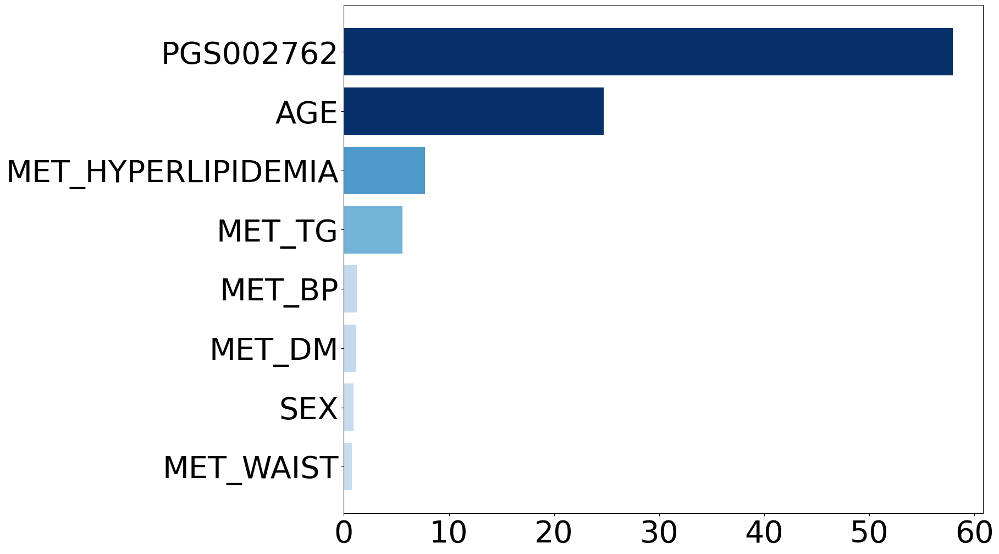

In [123]:
exp5_dt_impsum_df3 = FeatureImportancePlot(exp5_dt_importances3, exp5_column_list3, "Blues", 0.05)

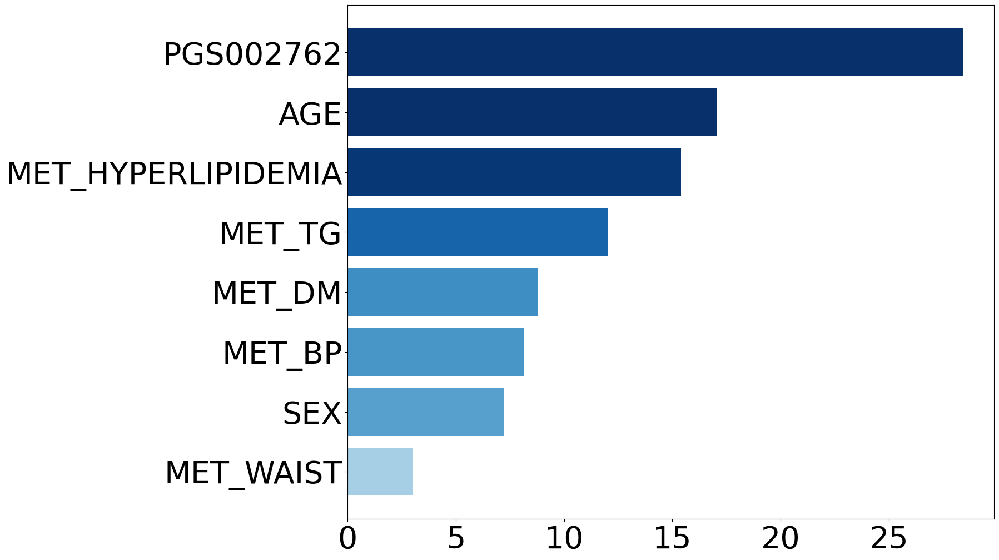

In [124]:
exp5_xgb_impsum_df3 = FeatureImportancePlot(exp5_xgb_importances3, exp5_column_list3, "Blues", 0.05)

In [125]:
# LGBM importances scale 조정
scale_exp5_lgbm_importances3 = Scale_LGBM_importances(exp5_lgbm_importances3)

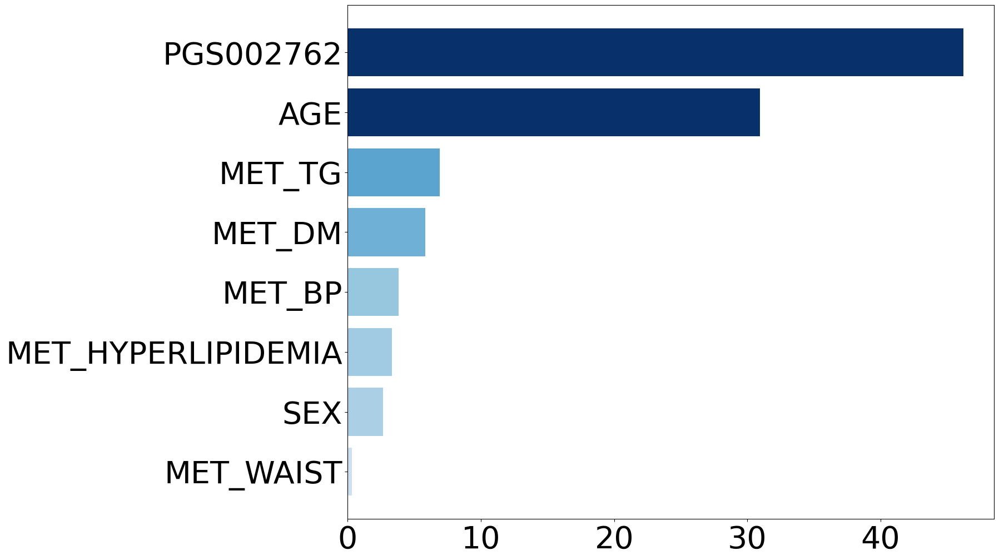

In [127]:
exp5_lgbm_impsum_df3 = FeatureImportancePlot(scale_exp5_lgbm_importances3, exp5_column_list3, "Blues", 0.05)

#### ROC curve

In [84]:
exp5_lr_avg_ROC3 = Average_ROC(exp5_lr_true_df3, exp5_lr_prob_df3, exp5_lr_auc_df3, "LR")
exp5_rf_avg_ROC3 = Average_ROC(exp5_rf_true_df3, exp5_rf_prob_df3, exp5_rf_auc_df3, "RF")
exp5_dt_avg_ROC3 = Average_ROC(exp5_dt_true_df3, exp5_dt_prob_df3, exp5_dt_auc_df3, "DT")
exp5_xgb_avg_ROC3 = Average_ROC(exp5_xgb_true_df3, exp5_xgb_prob_df3, exp5_xgb_auc_df3, "XGB")
exp5_lgbm_avg_ROC3 = Average_ROC(exp5_lgbm_true_df3, exp5_lgbm_prob_df3, exp5_lgbm_auc_df3, "LGBM")

exp5_base_fpr_list3 = [exp5_lr_avg_ROC3[0], exp5_rf_avg_ROC3[0], exp5_dt_avg_ROC3[0], exp5_xgb_avg_ROC3[0], exp5_lgbm_avg_ROC3[0]]
exp5_mean_tprs_list3 = [exp5_lr_avg_ROC3[1], exp5_rf_avg_ROC3[1], exp5_dt_avg_ROC3[1], exp5_xgb_avg_ROC3[1], exp5_lgbm_avg_ROC3[1]]
exp5_tprs_lower_list3 = [exp5_lr_avg_ROC3[2], exp5_rf_avg_ROC3[2], exp5_dt_avg_ROC3[2], exp5_xgb_avg_ROC3[2], exp5_lgbm_avg_ROC3[2]]
exp5_tprs_upper_list3 = [exp5_lr_avg_ROC3[3], exp5_rf_avg_ROC3[3], exp5_dt_avg_ROC3[3], exp5_xgb_avg_ROC3[3], exp5_lgbm_avg_ROC3[3]]
exp5_legend_auc_list3 = [exp5_lr_avg_ROC3[4], exp5_rf_avg_ROC3[4], exp5_dt_avg_ROC3[4], exp5_xgb_avg_ROC3[4], exp5_lgbm_avg_ROC3[4]]

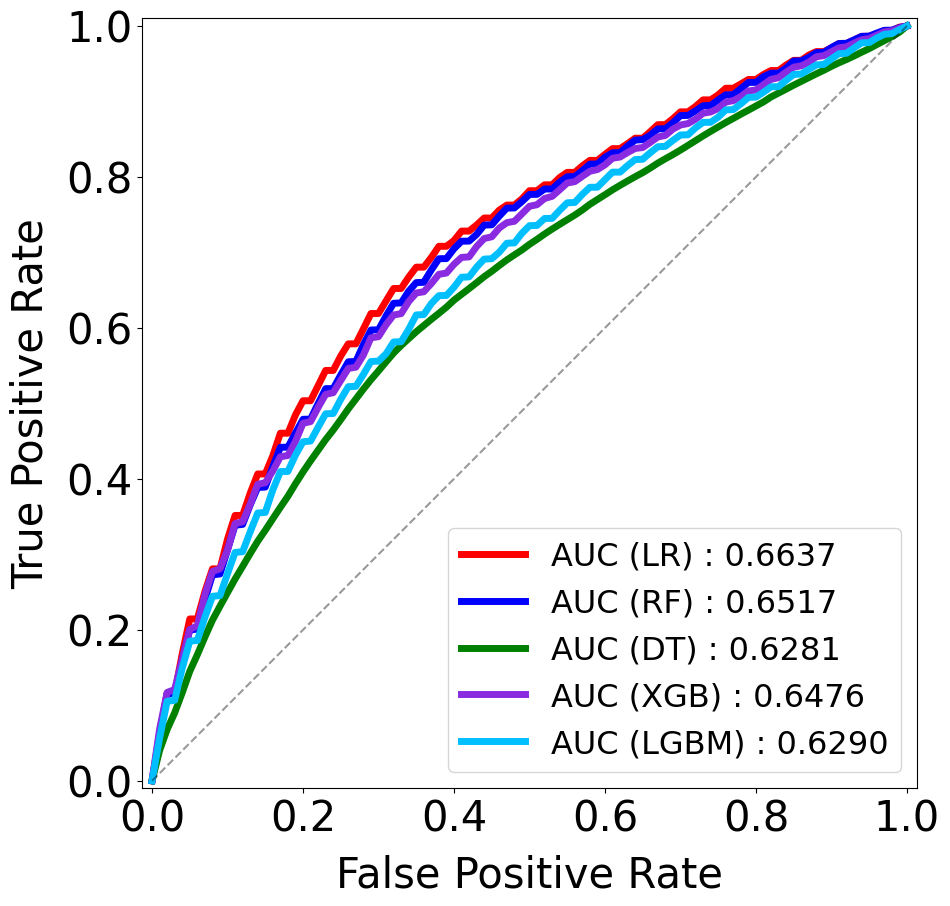

In [85]:
ROC_All_Curve(exp5_base_fpr_list3, exp5_mean_tprs_list3, exp5_tprs_lower_list3, exp5_tprs_upper_list3, exp5_legend_auc_list3)

### 8. AGE, SEX, PRS, Uric acid (Figure에 싣지 않음)

In [37]:
exp8_column_list3 = ["DISEASE", "AGE", "SEX", "PGS002762", "URICACID"]
exp8_3_KoGES = pre_2_F_KoGES.loc[:, exp8_column_list3]
exp8_3_KoGES.head()

,DISEASE,AGE,SEX,PGS002762,URICACID
0,1,43,2,-1.124843,3.5
1,1,56,2,-0.679097,3.5
2,1,47,1,-0.683763,5.4
3,1,54,1,-0.657040,5.7
4,1,53,1,-0.339189,6.7


In [38]:
# Random Forest
exp8_rf_true_df3, exp8_rf_pred_df3, exp8_rf_prob_df3, exp8_rf_auc_df3, exp8_rf_importances3 = Iter_RandomForest(exp8_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 150}
2 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 150}
3 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
4 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
5 {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 150}
6 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 50}
7 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 150}
8 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 10}
9 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
10 {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 10}
11 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 10}
12 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}
13 {'max_depth': 10, 'min_samples_split': 7, 'n_estimators': 150}
14 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 50}
15 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}
16 {'max_depth': 3, 'min_samples_spli

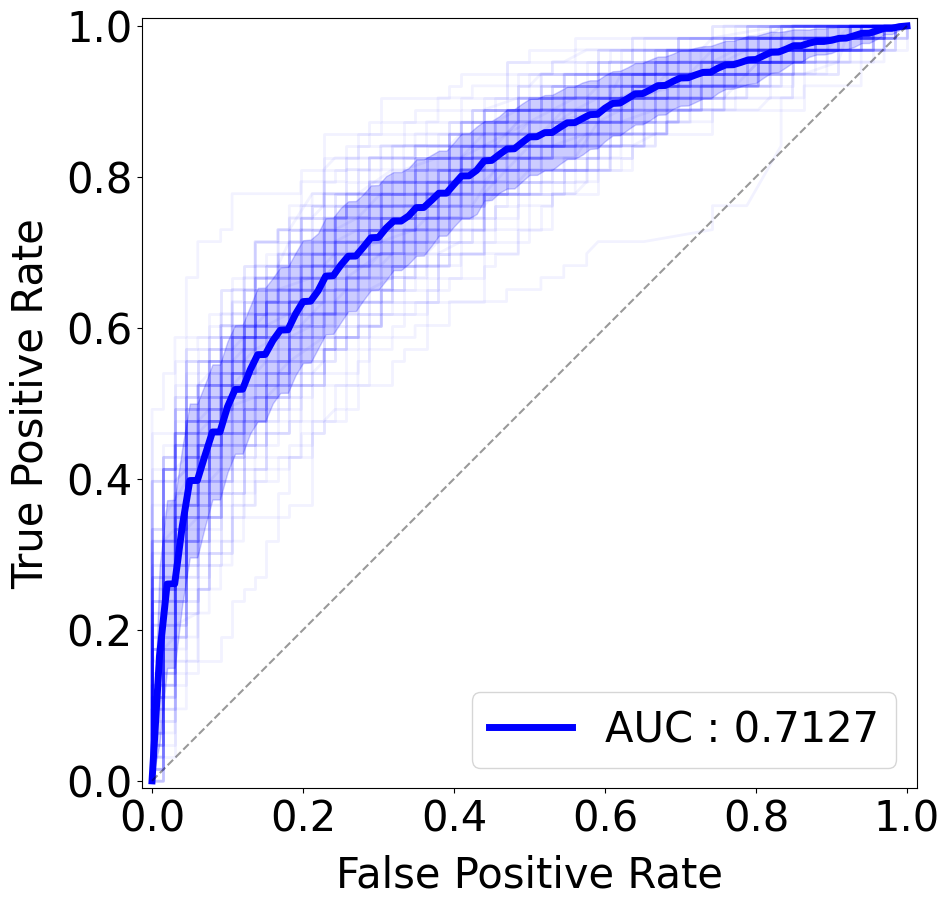

In [39]:
ROC_Curve(exp8_rf_true_df3, exp8_rf_prob_df3, exp8_rf_auc_df3, "b")

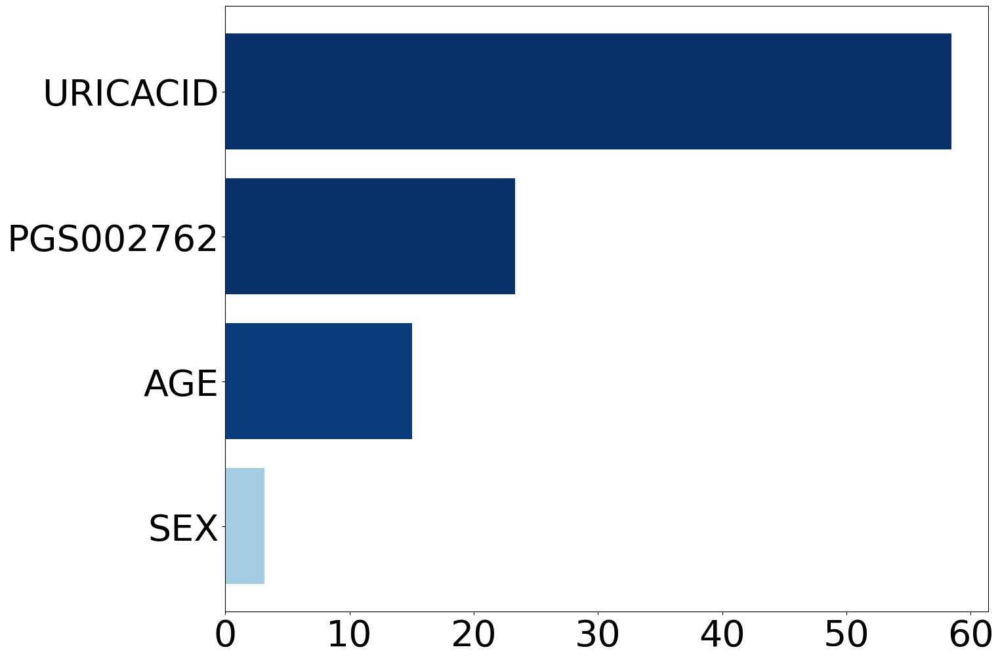

In [140]:
exp8_rf_impsum_df3 = FeatureImportancePlot(exp8_rf_importances3, exp8_column_list3, "Blues", 0.05)

In [57]:
exp8_lr_true_df3, exp8_lr_pred_df3, exp8_lr_prob_df3, exp8_lr_auc_df3 = Iter_Logistic(exp8_3_KoGES, seed_list, True, nGt_sampling_size)

In [58]:
exp8_dt_true_df3, exp8_dt_pred_df3, exp8_dt_prob_df3, exp8_dt_auc_df3, exp8_dt_importances3 = Iter_DecisionTree(exp8_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 2}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 10}
4 {'max_depth': 5, 'min_samples_split': 10}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 5, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 10}
8 {'max_depth': 5, 'min_samples_split': 7}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 3, 'min_samples_split': 2}
13 {'max_depth': 3, 'min_samples_split': 2}
14 {'max_depth': 7, 'min_samples_split': 10}
15 {'max_depth': 5, 'min_samples_split': 7}
16 {'max_depth': 3, 'min_samples_split': 2}
17 {'max_depth': 5, 'min_samples_split': 10}
18 {'max_depth': 5, 'min_samples_split': 10}
19 {'max_depth': 3, 'min_samples_split': 2}
20 {'max_depth': 5, 'min_samples_split': 10}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 5, 'min_samples_s

In [75]:
exp8_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp8"][0]
exp8_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp8"][1]
exp8_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp8"][2]
exp8_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp8"][3]
exp8_xgb_importances3 = xgb_AfImp_pkl_prs1["exp8"][4]

In [67]:
exp8_lgbm_true_df3, exp8_lgbm_pred_df3, exp8_lgbm_prob_df3, exp8_lgbm_auc_df3, exp8_lgbm_importances3 = Iter_LightGBM(exp8_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.2, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 10}
7 {'learning_rate': 0.1, 'n_estimators': 10}
8 {'learning_rate': 0.1, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.2, 'n_estimators': 10}
11 {'learning_rate': 0.2, 'n_estimators': 10}
12 {'learning_rate': 0.1, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.3, 'n_estimators': 10}
15 {'learning_rate': 0.3, 'n_estimators': 10}
16 {'learning_rate': 0.2, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 10}
18 {'learning_rate': 0.3, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 10}
20 {'learning_rate': 0.1, 'n_estimators': 50}
21 {'learning_rate': 0.2, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

#### Metrics

In [128]:
exp8_lr_acc_list3, exp8_lr_f1_list3, exp8_lr_precision_list3, exp8_lr_recall_list3 = Calculate_metrics(exp8_lr_true_df3, exp8_lr_pred_df3)

ACC : 0.7148 (std : 0.0339)
F1-score : 0.6966 (std : 0.0376)
Precision : 0.7256 (std : 0.0415)
Recall : 0.6717 (std : 0.0494)


In [129]:
exp8_rf_acc_list3, exp8_rf_f1_list3, exp8_rf_precision_list3, exp8_rf_recall_list3 = Calculate_metrics(exp8_rf_true_df3, exp8_rf_pred_df3)

ACC : 0.7150 (std : 0.0373)
F1-score : 0.6760 (std : 0.0497)
Precision : 0.7606 (std : 0.0543)
Recall : 0.6132 (std : 0.0705)


In [130]:
exp8_dt_acc_list3, exp8_dt_f1_list3, exp8_dt_precision_list3, exp8_dt_recall_list3 = Calculate_metrics(exp8_dt_true_df3, exp8_dt_pred_df3)

ACC : 0.7036 (std : 0.0362)
F1-score : 0.6577 (std : 0.0500)
Precision : 0.7590 (std : 0.0671)
Recall : 0.5887 (std : 0.0799)


In [131]:
exp8_xgb_acc_list3, exp8_xgb_f1_list3, exp8_xgb_precision_list3, exp8_xgb_recall_list3 = Calculate_metrics(exp8_xgb_true_df3, exp8_xgb_pred_df3)

ACC : 0.7164 (std : 0.0399)
F1-score : 0.6838 (std : 0.0507)
Precision : 0.7505 (std : 0.0517)
Recall : 0.6321 (std : 0.0706)


In [132]:
exp8_lgbm_acc_list3, exp8_lgbm_f1_list3, exp8_lgbm_precision_list3, exp8_lgbm_recall_list3 = Calculate_metrics(exp8_lgbm_true_df3, exp8_lgbm_pred_df3)

ACC : 0.7031 (std : 0.0405)
F1-score : 0.6818 (std : 0.0452)
Precision : 0.7166 (std : 0.0511)
Recall : 0.6530 (std : 0.0596)


#### feature importances

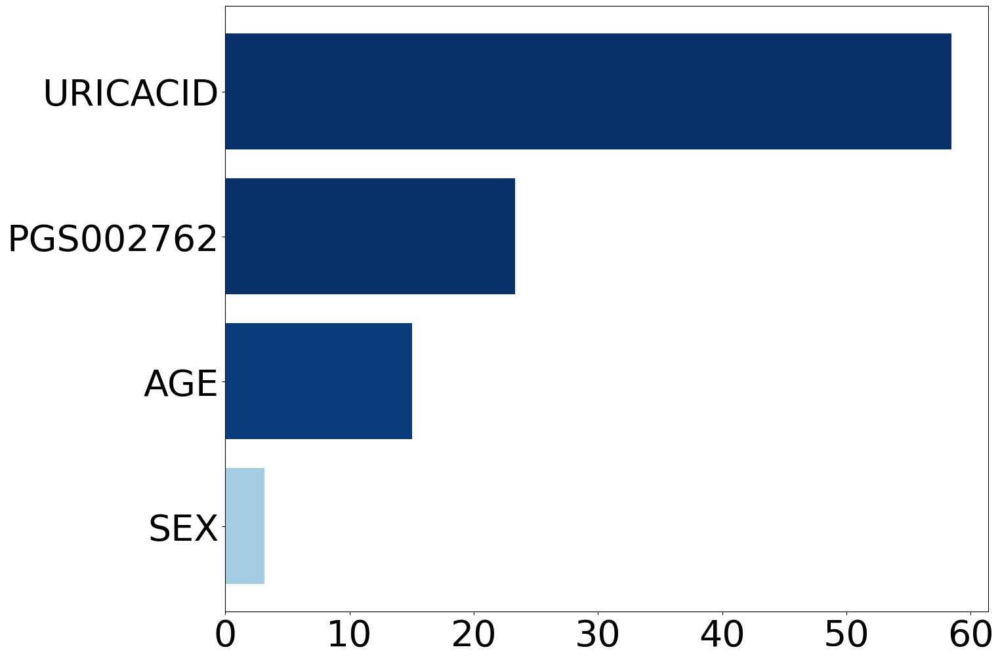

In [133]:
exp8_rf_impsum_df3 = FeatureImportancePlot(exp8_rf_importances3, exp8_column_list3, "Blues", 0.05)

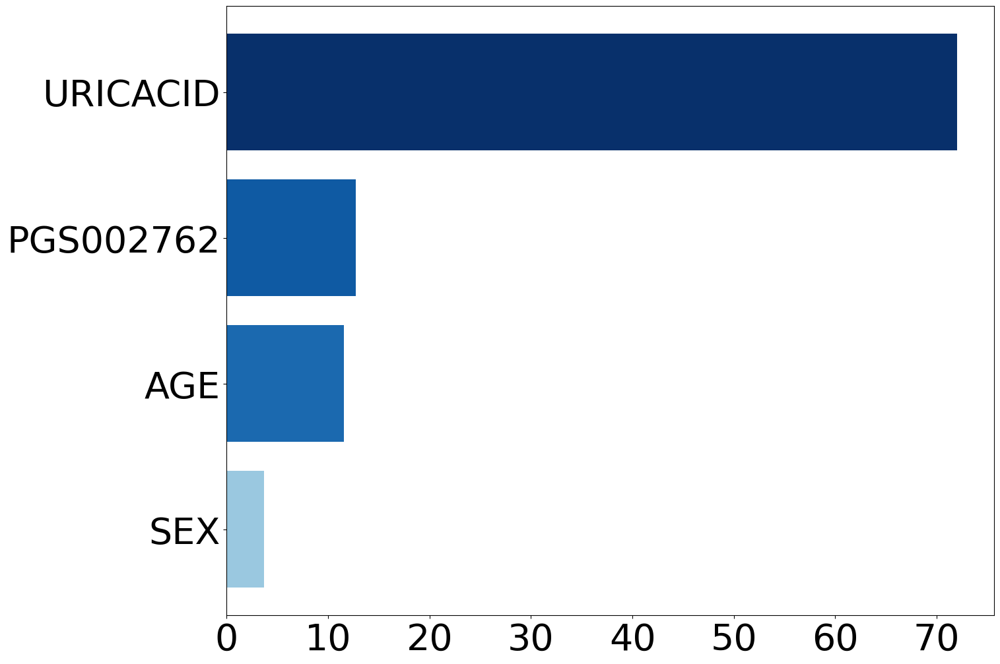

In [134]:
exp8_dt_impsum_df3 = FeatureImportancePlot(exp8_dt_importances3, exp8_column_list3, "Blues", 0.05)

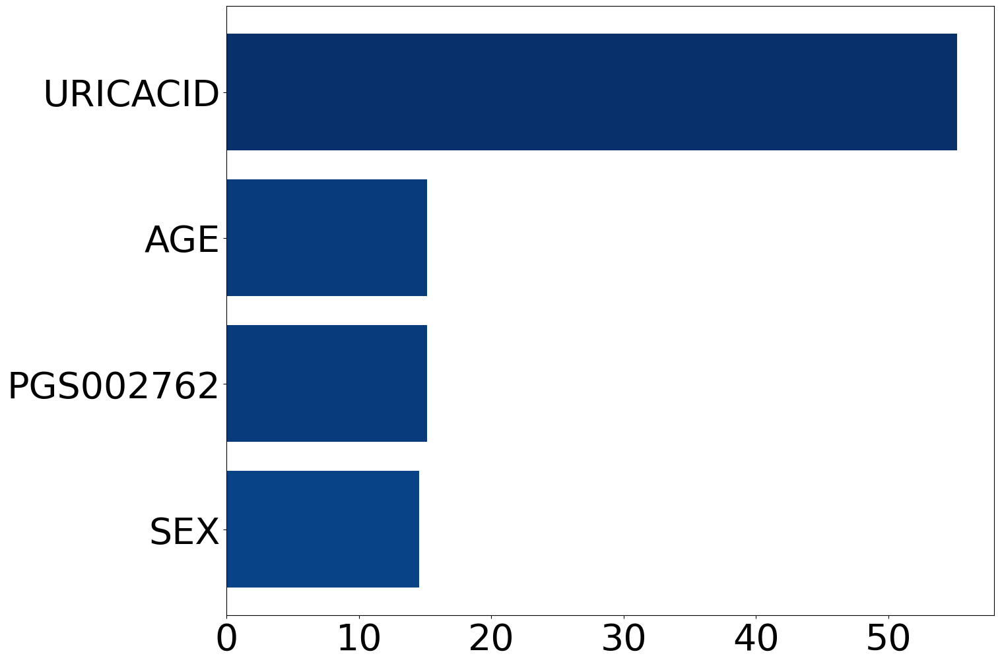

In [135]:
exp8_xgb_impsum_df3 = FeatureImportancePlot(exp8_xgb_importances3, exp8_column_list3, "Blues", 0.05)

In [136]:
# LGBM importances scale 조정
scale_exp8_lgbm_importances3 = Scale_LGBM_importances(exp8_lgbm_importances3)

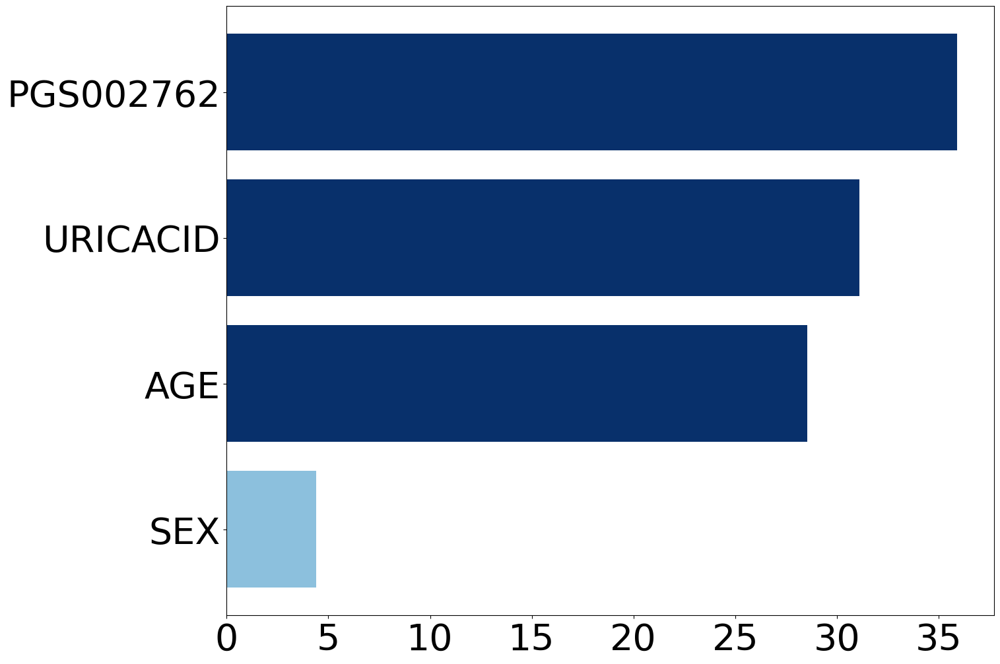

In [137]:
exp8_lgbm_impsum_df3 = FeatureImportancePlot(scale_exp8_lgbm_importances3, exp8_column_list3, "Blues", 0.05)

#### ROC curve

In [86]:
exp8_lr_avg_ROC3 = Average_ROC(exp8_lr_true_df3, exp8_lr_prob_df3, exp8_lr_auc_df3, "LR")
exp8_rf_avg_ROC3 = Average_ROC(exp8_rf_true_df3, exp8_rf_prob_df3, exp8_rf_auc_df3, "RF")
exp8_dt_avg_ROC3 = Average_ROC(exp8_dt_true_df3, exp8_dt_prob_df3, exp8_dt_auc_df3, "DT")
exp8_xgb_avg_ROC3 = Average_ROC(exp8_xgb_true_df3, exp8_xgb_prob_df3, exp8_xgb_auc_df3, "XGB")
exp8_lgbm_avg_ROC3 = Average_ROC(exp8_lgbm_true_df3, exp8_lgbm_prob_df3, exp8_lgbm_auc_df3, "LGBM")

exp8_base_fpr_list3 = [exp8_lr_avg_ROC3[0], exp8_rf_avg_ROC3[0], exp8_dt_avg_ROC3[0], exp8_xgb_avg_ROC3[0], exp8_lgbm_avg_ROC3[0]]
exp8_mean_tprs_list3 = [exp8_lr_avg_ROC3[1], exp8_rf_avg_ROC3[1], exp8_dt_avg_ROC3[1], exp8_xgb_avg_ROC3[1], exp8_lgbm_avg_ROC3[1]]
exp8_tprs_lower_list3 = [exp8_lr_avg_ROC3[2], exp8_rf_avg_ROC3[2], exp8_dt_avg_ROC3[2], exp8_xgb_avg_ROC3[2], exp8_lgbm_avg_ROC3[2]]
exp8_tprs_upper_list3 = [exp8_lr_avg_ROC3[3], exp8_rf_avg_ROC3[3], exp8_dt_avg_ROC3[3], exp8_xgb_avg_ROC3[3], exp8_lgbm_avg_ROC3[3]]
exp8_legend_auc_list3 = [exp8_lr_avg_ROC3[4], exp8_rf_avg_ROC3[4], exp8_dt_avg_ROC3[4], exp8_xgb_avg_ROC3[4], exp8_lgbm_avg_ROC3[4]]

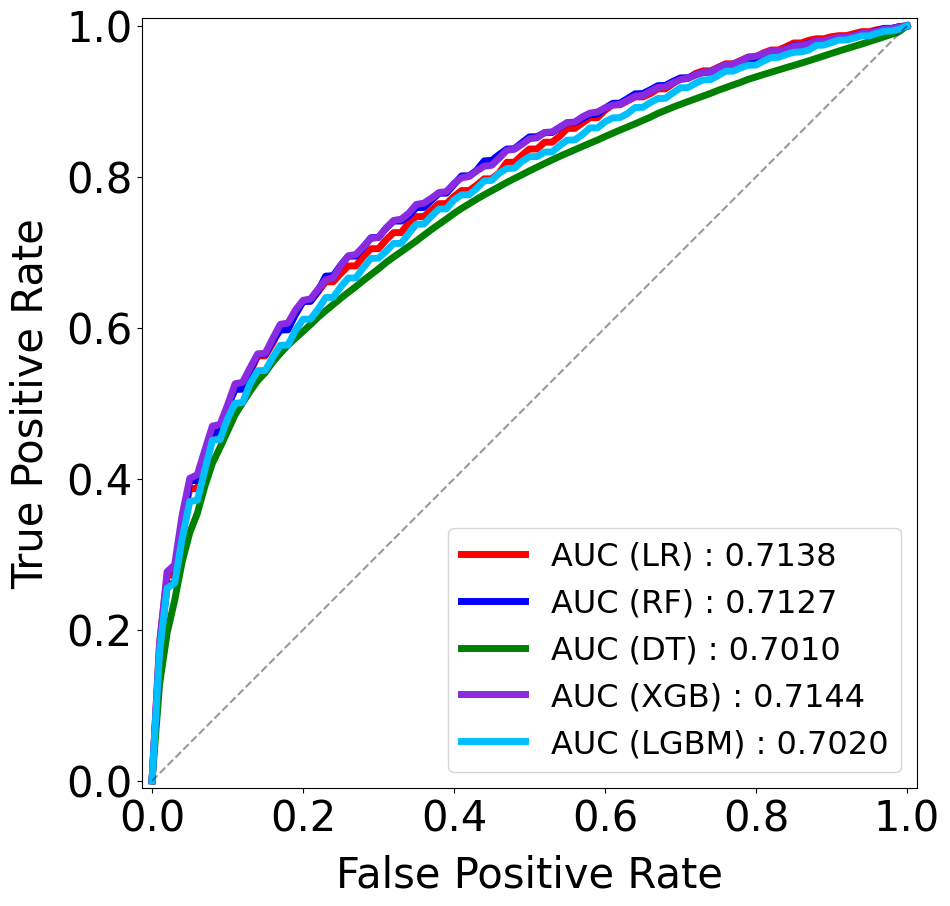

In [87]:
ROC_All_Curve(exp8_base_fpr_list3, exp8_mean_tprs_list3, exp8_tprs_lower_list3, exp8_tprs_upper_list3, exp8_legend_auc_list3)

### 9. AGE, SEX, Lifestyle, PRS, Uric acid

In [41]:
exp9_column_list3 = ["DISEASE", "AGE", "SEX", 
                    "BMI", "SMOKE", "ALCOHOL", "PHYSICAL_ACTIVITY", "DIET",
                    "PGS002762", "URICACID"]
exp9_3_KoGES = pre_2_F_KoGES.loc[:, exp9_column_list3]
exp9_3_KoGES.head()

,DISEASE,AGE,SEX,BMI,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,DIET,PGS002762,URICACID
0,1,43,2,18.40,0,0,0,6,-1.124843,3.5
1,1,56,2,22.06,0,1,0,7,-0.679097,3.5
2,1,47,1,30.48,1,1,0,5,-0.683763,5.4
3,1,54,1,26.17,0,0,0,5,-0.657040,5.7
4,1,53,1,26.16,0,1,0,4,-0.339189,6.7


In [42]:
# Random Forest
exp9_rf_true_df3, exp9_rf_pred_df3, exp9_rf_prob_df3, exp9_rf_auc_df3, exp9_rf_importances3 = Iter_RandomForest(exp9_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 100}
2 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 100}
3 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 50}
4 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 50}
5 {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 300}
6 {'max_depth': 7, 'min_samples_split': 3, 'n_estimators': 300}
7 {'max_depth': 3, 'min_samples_split': 7, 'n_estimators': 50}
8 {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 50}
9 {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 50}
10 {'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 100}
11 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 10}
12 {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 150}
13 {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 300}
14 {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 150}
15 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 100}
16 {'max_depth': 3, 'min_samples_s

In [59]:
exp9_lr_true_df3, exp9_lr_pred_df3, exp9_lr_prob_df3, exp9_lr_auc_df3 = Iter_Logistic(exp9_3_KoGES, seed_list, True, nGt_sampling_size)

In [60]:
exp9_dt_true_df3, exp9_dt_pred_df3, exp9_dt_prob_df3, exp9_dt_auc_df3, exp9_dt_importances3 = Iter_DecisionTree(exp9_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 3, 'min_samples_split': 2}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 10}
4 {'max_depth': 5, 'min_samples_split': 10}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 5, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 2}
8 {'max_depth': 5, 'min_samples_split': 7}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 3, 'min_samples_split': 2}
11 {'max_depth': 5, 'min_samples_split': 2}
12 {'max_depth': 3, 'min_samples_split': 2}
13 {'max_depth': 3, 'min_samples_split': 2}
14 {'max_depth': 3, 'min_samples_split': 2}
15 {'max_depth': 5, 'min_samples_split': 10}
16 {'max_depth': 3, 'min_samples_split': 2}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 5, 'min_samples_split': 5}
19 {'max_depth': 3, 'min_samples_split': 2}
20 {'max_depth': 5, 'min_samples_split': 10}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 5, 'min_samples_spli

In [76]:
exp9_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp9"][0]
exp9_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp9"][1]
exp9_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp9"][2]
exp9_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp9"][3]
exp9_xgb_importances3 = xgb_AfImp_pkl_prs1["exp9"][4]

In [68]:
exp9_lgbm_true_df3, exp9_lgbm_pred_df3, exp9_lgbm_prob_df3, exp9_lgbm_auc_df3, exp9_lgbm_importances3 = Iter_LightGBM(exp9_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.1, 'n_estimators': 10}
2 {'learning_rate': 0.5, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.1, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.1, 'n_estimators': 50}
7 {'learning_rate': 0.1, 'n_estimators': 10}
8 {'learning_rate': 0.1, 'n_estimators': 10}
9 {'learning_rate': 0.2, 'n_estimators': 10}
10 {'learning_rate': 0.2, 'n_estimators': 10}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.3, 'n_estimators': 10}
13 {'learning_rate': 0.1, 'n_estimators': 10}
14 {'learning_rate': 0.1, 'n_estimators': 10}
15 {'learning_rate': 0.2, 'n_estimators': 10}
16 {'learning_rate': 0.2, 'n_estimators': 10}
17 {'learning_rate': 0.2, 'n_estimators': 10}
18 {'learning_rate': 0.1, 'n_estimators': 10}
19 {'learning_rate': 0.2, 'n_estimators': 10}
20 {'learning_rate': 0.2, 'n_estimators': 10}
21 {'learning_rate': 0.2, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 1

#### Metrics

In [138]:
exp9_lr_acc_list3, exp9_lr_f1_list3, exp9_lr_precision_list3, exp9_lr_recall_list3 = Calculate_metrics(exp9_lr_true_df3, exp9_lr_pred_df3)

ACC : 0.7138 (std : 0.0351)
F1-score : 0.6954 (std : 0.0397)
Precision : 0.7244 (std : 0.0414)
Recall : 0.6706 (std : 0.0529)


In [139]:
exp9_rf_acc_list3, exp9_rf_f1_list3, exp9_rf_precision_list3, exp9_rf_recall_list3 = Calculate_metrics(exp9_rf_true_df3, exp9_rf_pred_df3)

ACC : 0.7203 (std : 0.0382)
F1-score : 0.6800 (std : 0.0496)
Precision : 0.7706 (std : 0.0528)
Recall : 0.6121 (std : 0.0657)


In [140]:
exp9_dt_acc_list3, exp9_dt_f1_list3, exp9_dt_precision_list3, exp9_dt_recall_list3 = Calculate_metrics(exp9_dt_true_df3, exp9_dt_pred_df3)

ACC : 0.7017 (std : 0.0347)
F1-score : 0.6569 (std : 0.0478)
Precision : 0.7542 (std : 0.0651)
Recall : 0.5900 (std : 0.0778)


In [141]:
exp9_xgb_acc_list3, exp9_xgb_f1_list3, exp9_xgb_precision_list3, exp9_xgb_recall_list3 = Calculate_metrics(exp9_xgb_true_df3, exp9_xgb_pred_df3)

ACC : 0.7155 (std : 0.0383)
F1-score : 0.6830 (std : 0.0472)
Precision : 0.7501 (std : 0.0531)
Recall : 0.6306 (std : 0.0643)


In [142]:
exp9_lgbm_acc_list3, exp9_lgbm_f1_list3, exp9_lgbm_precision_list3, exp9_lgbm_recall_list3 = Calculate_metrics(exp9_lgbm_true_df3, exp9_lgbm_pred_df3)

ACC : 0.7032 (std : 0.0409)
F1-score : 0.6817 (std : 0.0480)
Precision : 0.7158 (std : 0.0477)
Recall : 0.6538 (std : 0.0662)


#### feature importances

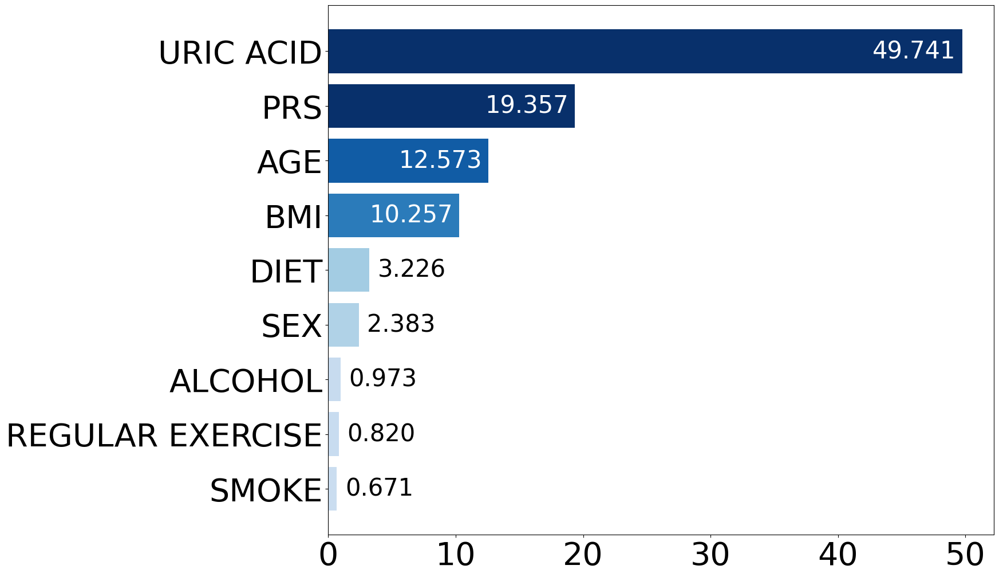

In [5]:
exp9_rf_impsum_df3 = FeatureImportancePlot(exp9_rf_importances3, exp9_column_list3, "Blues", 0.05) # importances[i] + 6

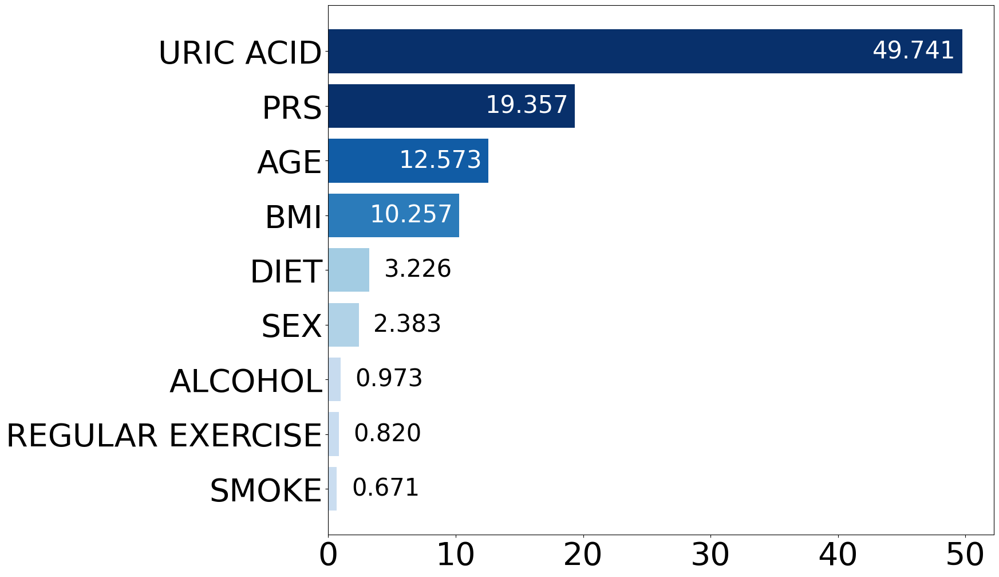

In [9]:
# Feature Importances Plot

degree = 0.05

importances_column = exp9_column_list3[1:] # DISEASE 컬럼 제외

if "PGS002762" in importances_column:
    importances_column[importances_column.index("PGS002762")] = "PRS"

# 240920 문기원교수님 요청사항대로 수정
if "URICACID" in importances_column:
    importances_column[importances_column.index("URICACID")] = "URIC ACID"

if "PHYSICAL_ACTIVITY" in importances_column:
    importances_column[importances_column.index("PHYSICAL_ACTIVITY")] = "REGULAR EXERCISE"

if "MET_HYPERLIPIDEMIA" in importances_column:
    importances_column[importances_column.index("MET_HYPERLIPIDEMIA")] = "MET_HDL"
    
importances_df = pd.DataFrame(exp9_rf_importances3, columns = importances_column)

importances_sum_df = pd.DataFrame(importances_df.sum(axis = 0), columns = ["Importances"])
importances_sum_df = importances_sum_df.sort_values("Importances", ascending = True)
importances_sum_df["Feature"] = importances_sum_df.index
importances_sum_df.reset_index(inplace = True, drop = True)

# plot 그리는 코드
colors = []
cmap = get_cmap("Blues")

importances = importances_sum_df["Importances"]
colname_list = importances_sum_df["Feature"]

for decimal in importances:
    colors.append(cmap(decimal * degree + 0.2))

plt.figure(figsize = (15, 12))
plt.barh(colname_list, importances, color = colors)

for i, v in enumerate(colname_list):
    plot_text = "%.3f" %importances[i]
    if importances[i] < 10:
        plt.text(importances[i] + 6.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "black")
    else:
        plt.text(importances[i]-0.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "white")

#plt.title("Feature Importance : KoGES lifestyle feature RF", size = 25)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.savefig("./output_file/Figure/ML_AGE_SEX_Lifestyle_PRS_UA_FeatImp.pdf", format="pdf", bbox_inches='tight')
plt.show()

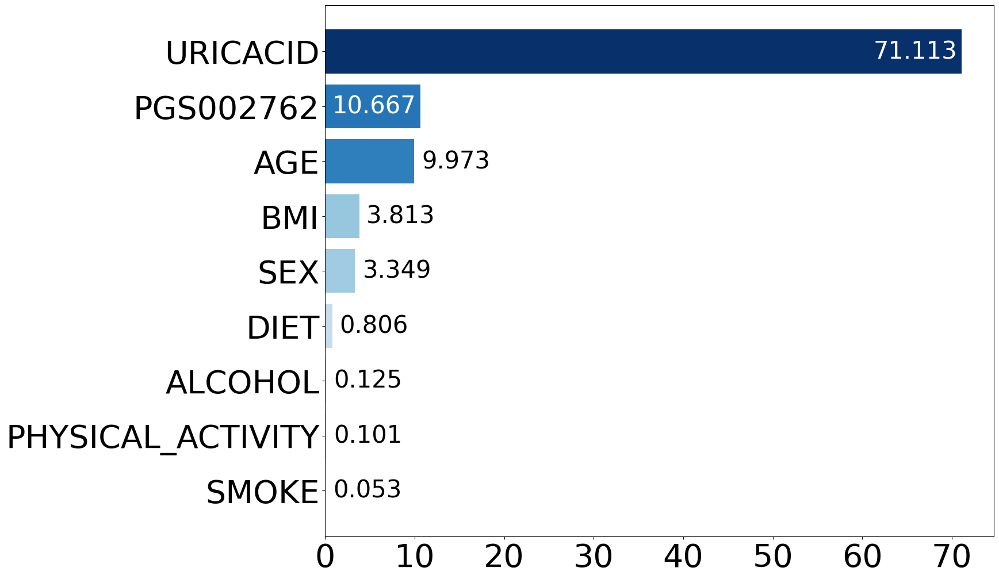

In [86]:
exp9_dt_impsum_df3 = FeatureImportancePlot(exp9_dt_importances3, exp9_column_list3, "Blues", 0.05) # importances[i] + 8.5

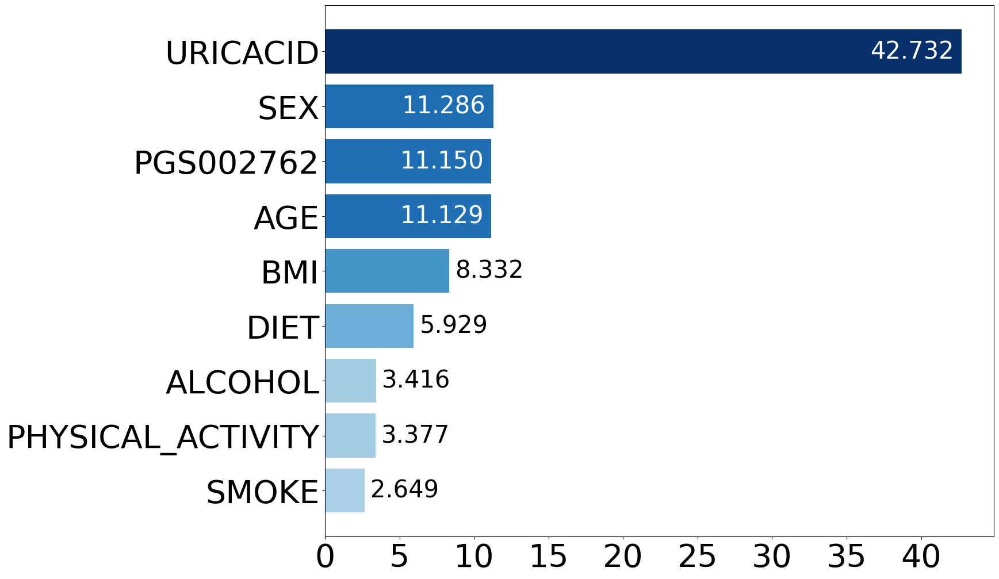

In [90]:
exp9_xgb_impsum_df3 = FeatureImportancePlot(exp9_xgb_importances3, exp9_column_list3, "Blues", 0.05) #importances[i] + 5

In [146]:
# LGBM importances scale 조정
scale_exp9_lgbm_importances3 = Scale_LGBM_importances(exp9_lgbm_importances3)

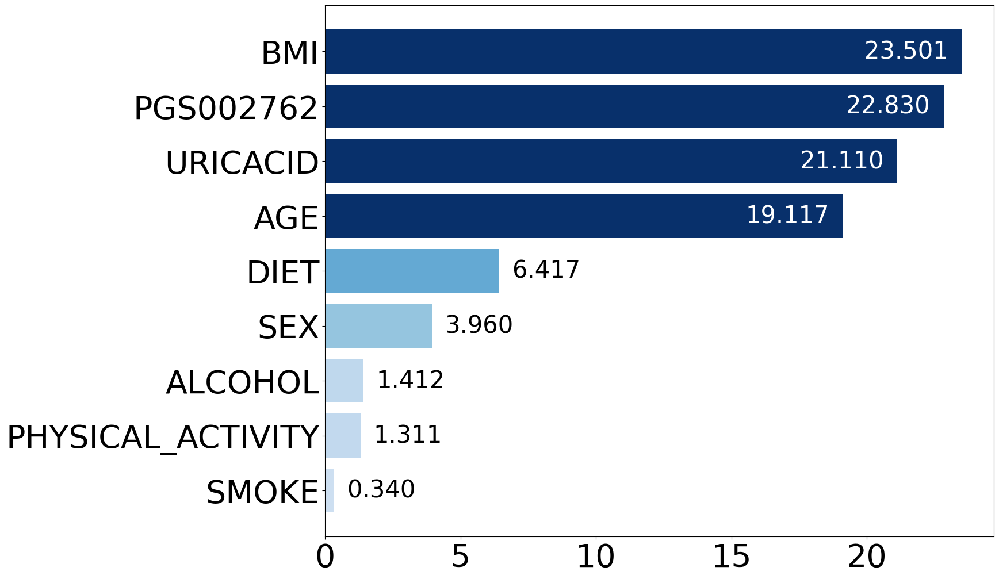

In [95]:
exp9_lgbm_impsum_df3 = FeatureImportancePlot(scale_exp9_lgbm_importances3, exp9_column_list3, "Blues", 0.05) # importances[i] + 3

#### ROC curve

In [88]:
exp9_lr_avg_ROC3 = Average_ROC(exp9_lr_true_df3, exp9_lr_prob_df3, exp9_lr_auc_df3, "LR")
exp9_rf_avg_ROC3 = Average_ROC(exp9_rf_true_df3, exp9_rf_prob_df3, exp9_rf_auc_df3, "RF")
exp9_dt_avg_ROC3 = Average_ROC(exp9_dt_true_df3, exp9_dt_prob_df3, exp9_dt_auc_df3, "DT")
exp9_xgb_avg_ROC3 = Average_ROC(exp9_xgb_true_df3, exp9_xgb_prob_df3, exp9_xgb_auc_df3, "XGB")
exp9_lgbm_avg_ROC3 = Average_ROC(exp9_lgbm_true_df3, exp9_lgbm_prob_df3, exp9_lgbm_auc_df3, "LGBM")

exp9_base_fpr_list3 = [exp9_lr_avg_ROC3[0], exp9_rf_avg_ROC3[0], exp9_dt_avg_ROC3[0], exp9_xgb_avg_ROC3[0], exp9_lgbm_avg_ROC3[0]]
exp9_mean_tprs_list3 = [exp9_lr_avg_ROC3[1], exp9_rf_avg_ROC3[1], exp9_dt_avg_ROC3[1], exp9_xgb_avg_ROC3[1], exp9_lgbm_avg_ROC3[1]]
exp9_tprs_lower_list3 = [exp9_lr_avg_ROC3[2], exp9_rf_avg_ROC3[2], exp9_dt_avg_ROC3[2], exp9_xgb_avg_ROC3[2], exp9_lgbm_avg_ROC3[2]]
exp9_tprs_upper_list3 = [exp9_lr_avg_ROC3[3], exp9_rf_avg_ROC3[3], exp9_dt_avg_ROC3[3], exp9_xgb_avg_ROC3[3], exp9_lgbm_avg_ROC3[3]]
exp9_legend_auc_list3 = [exp9_lr_avg_ROC3[4], exp9_rf_avg_ROC3[4], exp9_dt_avg_ROC3[4], exp9_xgb_avg_ROC3[4], exp9_lgbm_avg_ROC3[4]]

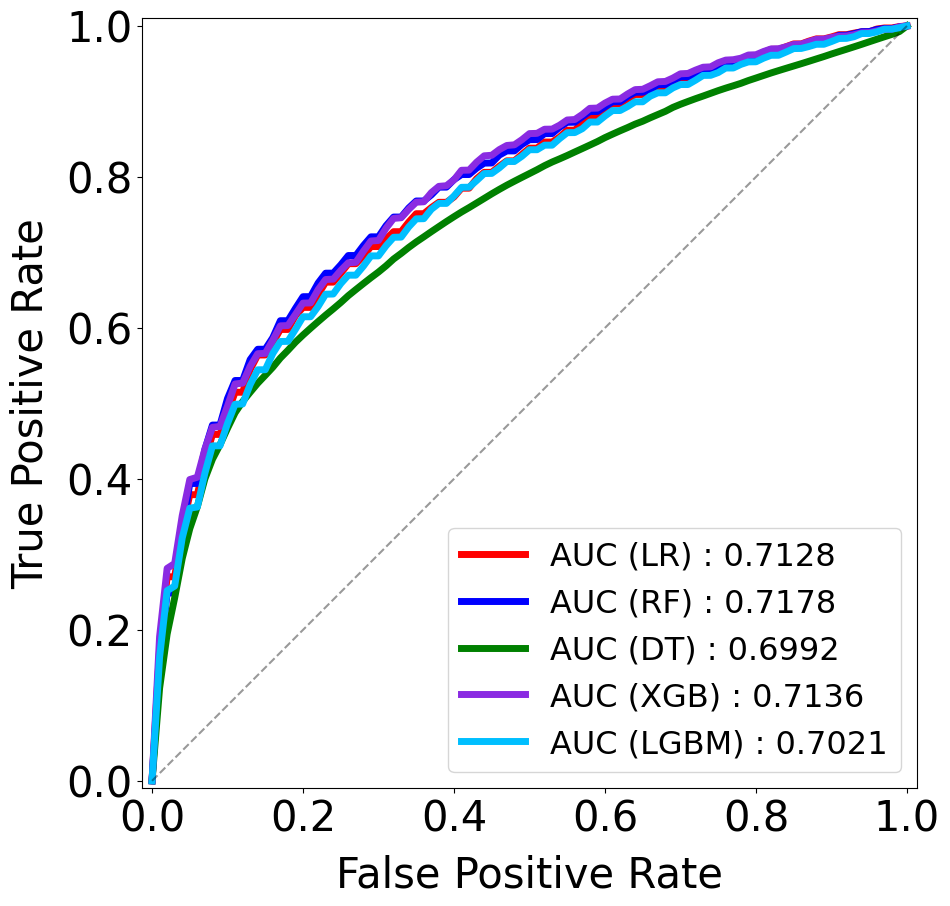

In [89]:
ROC_All_Curve(exp9_base_fpr_list3, exp9_mean_tprs_list3, exp9_tprs_lower_list3, exp9_tprs_upper_list3, exp9_legend_auc_list3)

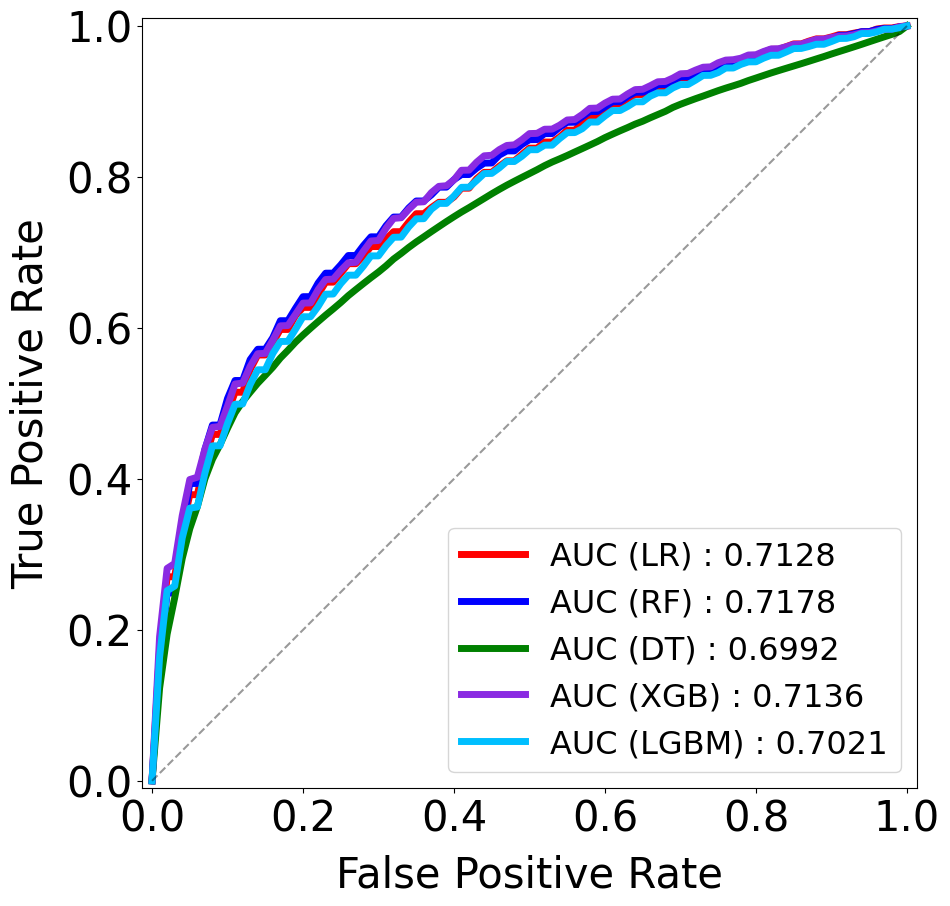

In [16]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp9_mean_tprs_list3)):
    plt.plot(exp9_base_fpr_list3[i], exp9_mean_tprs_list3[i], color_list[i], linewidth = 5, label = exp9_legend_auc_list3[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_Lifestyle_PRS_UA_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

### 10. AGE, SEX, Metabolic syndrome, PRS, Uric acid

In [44]:
exp10_column_list3 = ["DISEASE", "AGE", "SEX",
                     "MET_WAIST", "MET_BP", "MET_DM", "MET_TG", "MET_HYPERLIPIDEMIA",
                     "PGS002762", "URICACID"]
exp10_3_KoGES = pre_2_F_KoGES.loc[:, exp10_column_list3]
exp10_3_KoGES.head()

,DISEASE,AGE,SEX,MET_WAIST,MET_BP,MET_DM,MET_TG,MET_HYPERLIPIDEMIA,PGS002762,URICACID
0,1,43,2,0,0,0,0,0,-1.124843,3.5
1,1,56,2,1,0,0,0,1,-0.679097,3.5
2,1,47,1,0,0,0,1,0,-0.683763,5.4
3,1,54,1,0,0,1,1,0,-0.657040,5.7
4,1,53,1,0,1,1,1,0,-0.339189,6.7


In [45]:
# Random Forest
exp10_rf_true_df3, exp10_rf_pred_df3, exp10_rf_prob_df3, exp10_rf_auc_df3, exp10_rf_importances3 = Iter_RandomForest(exp10_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 100}
2 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 150}
3 {'max_depth': 10, 'min_samples_split': 7, 'n_estimators': 10}
4 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 10}
5 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 50}
6 {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 150}
7 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
8 {'max_depth': 10, 'min_samples_split': 7, 'n_estimators': 300}
9 {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 150}
10 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 10}
11 {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 50}
12 {'max_depth': 5, 'min_samples_split': 7, 'n_estimators': 150}
13 {'max_depth': 7, 'min_samples_split': 10, 'n_estimators': 50}
14 {'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 300}
15 {'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 150}
16 {'max_depth': 7, 'min_sample

In [61]:
exp10_lr_true_df3, exp10_lr_pred_df3, exp10_lr_prob_df3, exp10_lr_auc_df3 = Iter_Logistic(exp10_3_KoGES, seed_list, True, nGt_sampling_size)

In [62]:
exp10_dt_true_df3, exp10_dt_pred_df3, exp10_dt_prob_df3, exp10_dt_auc_df3, exp10_dt_importances3 = Iter_DecisionTree(exp10_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'max_depth': 5, 'min_samples_split': 2}
2 {'max_depth': 3, 'min_samples_split': 2}
3 {'max_depth': 5, 'min_samples_split': 10}
4 {'max_depth': 3, 'min_samples_split': 2}
5 {'max_depth': 3, 'min_samples_split': 2}
6 {'max_depth': 3, 'min_samples_split': 2}
7 {'max_depth': 5, 'min_samples_split': 10}
8 {'max_depth': 5, 'min_samples_split': 7}
9 {'max_depth': 3, 'min_samples_split': 2}
10 {'max_depth': 5, 'min_samples_split': 2}
11 {'max_depth': 7, 'min_samples_split': 7}
12 {'max_depth': 3, 'min_samples_split': 2}
13 {'max_depth': 7, 'min_samples_split': 10}
14 {'max_depth': 7, 'min_samples_split': 10}
15 {'max_depth': 5, 'min_samples_split': 2}
16 {'max_depth': 3, 'min_samples_split': 2}
17 {'max_depth': 3, 'min_samples_split': 2}
18 {'max_depth': 3, 'min_samples_split': 2}
19 {'max_depth': 3, 'min_samples_split': 2}
20 {'max_depth': 3, 'min_samples_split': 2}
21 {'max_depth': 3, 'min_samples_split': 2}
22 {'max_depth': 3, 'min_samples_split': 2}
23 {'max_depth': 5, 'min_samples_spli

In [77]:
exp10_xgb_true_df3 = xgb_AfImp_pkl_prs1["exp10"][0]
exp10_xgb_pred_df3 = xgb_AfImp_pkl_prs1["exp10"][1]
exp10_xgb_prob_df3 = xgb_AfImp_pkl_prs1["exp10"][2]
exp10_xgb_auc_df3 = xgb_AfImp_pkl_prs1["exp10"][3]
exp10_xgb_importances3 = xgb_AfImp_pkl_prs1["exp10"][4]

In [69]:
exp10_lgbm_true_df3, exp10_lgbm_pred_df3, exp10_lgbm_prob_df3, exp10_lgbm_auc_df3, exp10_lgbm_importances3 = Iter_LightGBM(exp10_3_KoGES, seed_list, True, nGt_sampling_size)

1 {'learning_rate': 0.2, 'n_estimators': 10}
2 {'learning_rate': 0.2, 'n_estimators': 10}
3 {'learning_rate': 0.1, 'n_estimators': 10}
4 {'learning_rate': 0.2, 'n_estimators': 10}
5 {'learning_rate': 0.1, 'n_estimators': 10}
6 {'learning_rate': 0.2, 'n_estimators': 100}
7 {'learning_rate': 0.1, 'n_estimators': 10}
8 {'learning_rate': 0.3, 'n_estimators': 10}
9 {'learning_rate': 0.3, 'n_estimators': 10}
10 {'learning_rate': 0.3, 'n_estimators': 50}
11 {'learning_rate': 0.1, 'n_estimators': 10}
12 {'learning_rate': 0.2, 'n_estimators': 10}
13 {'learning_rate': 0.2, 'n_estimators': 10}
14 {'learning_rate': 0.1, 'n_estimators': 10}
15 {'learning_rate': 0.2, 'n_estimators': 10}
16 {'learning_rate': 0.1, 'n_estimators': 10}
17 {'learning_rate': 0.1, 'n_estimators': 50}
18 {'learning_rate': 0.5, 'n_estimators': 10}
19 {'learning_rate': 0.1, 'n_estimators': 10}
20 {'learning_rate': 0.1, 'n_estimators': 10}
21 {'learning_rate': 0.2, 'n_estimators': 10}
22 {'learning_rate': 0.1, 'n_estimators': 

#### Metrics

In [148]:
exp10_lr_acc_list3, exp10_lr_f1_list3, exp10_lr_precision_list3, exp10_lr_recall_list3 = Calculate_metrics(exp10_lr_true_df3, exp10_lr_pred_df3)

ACC : 0.7149 (std : 0.0366)
F1-score : 0.6978 (std : 0.0404)
Precision : 0.7241 (std : 0.0433)
Recall : 0.6754 (std : 0.0534)


In [149]:
exp10_rf_acc_list3, exp10_rf_f1_list3, exp10_rf_precision_list3, exp10_rf_recall_list3 = Calculate_metrics(exp10_rf_true_df3, exp10_rf_pred_df3)

ACC : 0.7224 (std : 0.0397)
F1-score : 0.6891 (std : 0.0510)
Precision : 0.7603 (std : 0.0510)
Recall : 0.6341 (std : 0.0702)


In [150]:
exp10_dt_acc_list3, exp10_dt_f1_list3, exp10_dt_precision_list3, exp10_dt_recall_list3 = Calculate_metrics(exp10_dt_true_df3, exp10_dt_pred_df3)

ACC : 0.7038 (std : 0.0353)
F1-score : 0.6641 (std : 0.0506)
Precision : 0.7462 (std : 0.0567)
Recall : 0.6062 (std : 0.0839)


In [151]:
exp10_xgb_acc_list3, exp10_xgb_f1_list3, exp10_xgb_precision_list3, exp10_xgb_recall_list3 = Calculate_metrics(exp10_xgb_true_df3, exp10_xgb_pred_df3)

ACC : 0.7181 (std : 0.0387)
F1-score : 0.6888 (std : 0.0486)
Precision : 0.7470 (std : 0.0483)
Recall : 0.6427 (std : 0.0679)


In [152]:
exp10_lgbm_acc_list3, exp10_lgbm_f1_list3, exp10_lgbm_precision_list3, exp10_lgbm_recall_list3 = Calculate_metrics(exp10_lgbm_true_df3, exp10_lgbm_pred_df3)

ACC : 0.7077 (std : 0.0407)
F1-score : 0.6879 (std : 0.0463)
Precision : 0.7196 (std : 0.0498)
Recall : 0.6619 (std : 0.0616)


#### feature importances

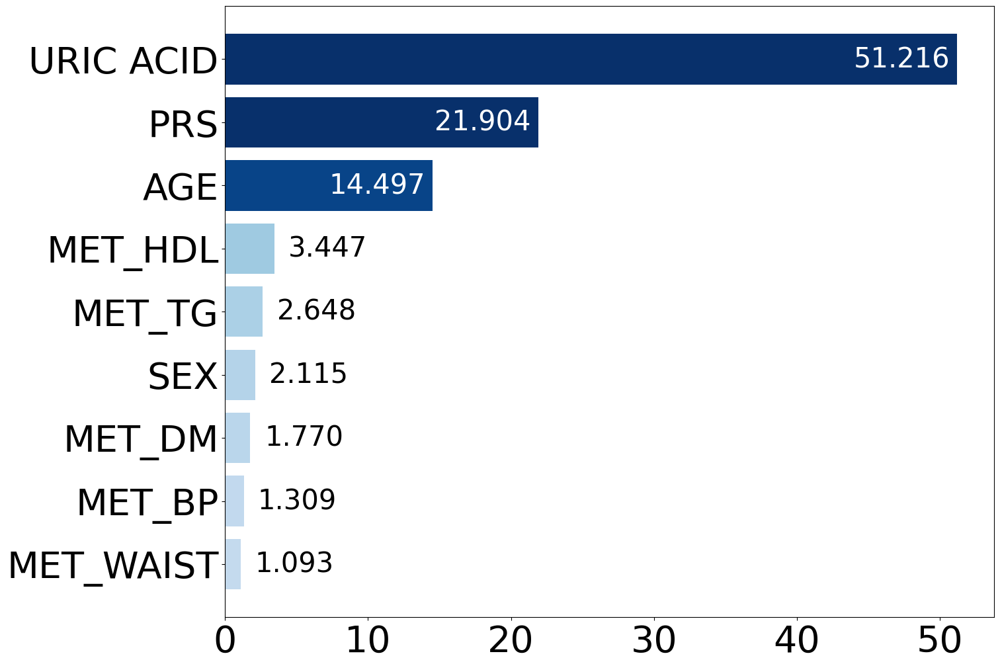

In [7]:
exp10_rf_impsum_df3 = FeatureImportancePlot(exp10_rf_importances3, exp10_column_list3, "Blues", 0.05) #importances[i] + 6.5

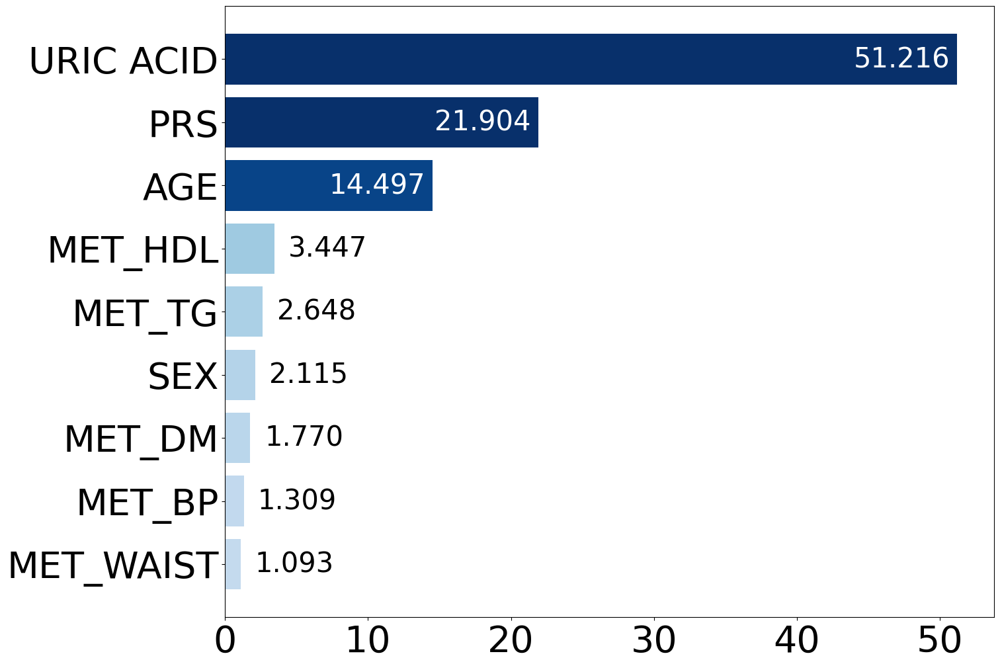

In [ ]:
# Feature Importances Plot

# exp10_rf_impsum_df3 = FeatureImportancePlot(exp10_rf_importances3, exp10_column_list3, "Blues", 0.05) #importances[i] + 6.5

# degree = 0.05

# def FeatureImportancePlot(Importances_data, column_list, Color, degree):
degree = 0.05

importances_column = exp10_column_list3[1:] # DISEASE 컬럼 제외

if "PGS002762" in importances_column:
    importances_column[importances_column.index("PGS002762")] = "PRS"

# 240920 교수님 요청사항대로 수정
if "URICACID" in importances_column:
    importances_column[importances_column.index("URICACID")] = "URIC ACID"

if "PHYSICAL_ACTIVITY" in importances_column:
    importances_column[importances_column.index("PHYSICAL_ACTIVITY")] = "REGULAR EXERCISE"

if "MET_HYPERLIPIDEMIA" in importances_column:
    importances_column[importances_column.index("MET_HYPERLIPIDEMIA")] = "MET_HDL"
    
importances_df = pd.DataFrame(exp10_rf_importances3, columns = importances_column)

importances_sum_df = pd.DataFrame(importances_df.sum(axis = 0), columns = ["Importances"])
importances_sum_df = importances_sum_df.sort_values("Importances", ascending = True)
importances_sum_df["Feature"] = importances_sum_df.index
importances_sum_df.reset_index(inplace = True, drop = True)

# plot 그리는 코드
colors = []
cmap = get_cmap("Blues")

importances = importances_sum_df["Importances"]
colname_list = importances_sum_df["Feature"]

for decimal in importances:
    colors.append(cmap(decimal * degree + 0.2))

plt.figure(figsize = (15, 12))
plt.barh(colname_list, importances, color = colors)

for i, v in enumerate(colname_list):
    plot_text = "%.3f" %importances[i]
    if importances[i] < 10:
        plt.text(importances[i] + 6.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "black")
    else:
        plt.text(importances[i]-0.5, v, plot_text, fontsize = 30, horizontalalignment = 'right', verticalalignment = 'center', color = "white")

#plt.title("Feature Importance : KoGES lifestyle feature RF", size = 25)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.savefig("./output_file/Figure/ML_AGE_SEX_MetS_PRS_UA_FeatImp.pdf", format="pdf", bbox_inches='tight')
plt.show()

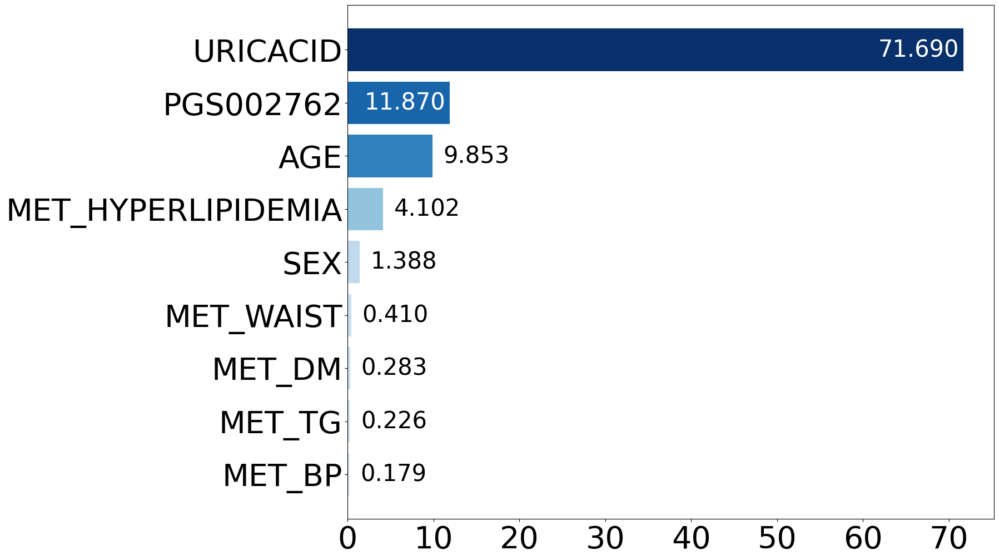

In [71]:
exp10_dt_impsum_df3 = FeatureImportancePlot(exp10_dt_importances3, exp10_column_list3, "Blues", 0.05) # importances[i] + 9

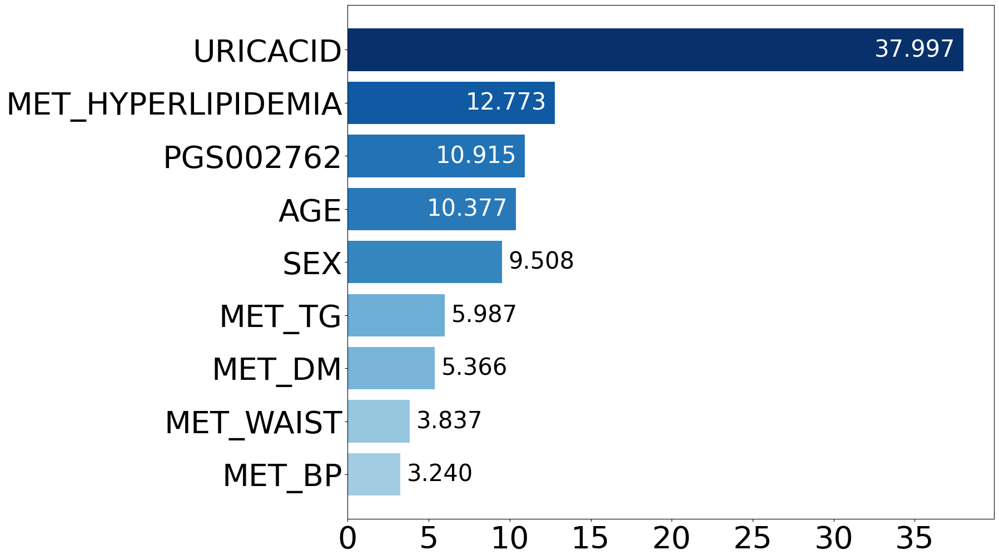

In [65]:
exp10_xgb_impsum_df3 = FeatureImportancePlot(exp10_xgb_importances3, exp10_column_list3, "Blues", 0.05) #importances[i] + 4.5

In [156]:
# LGBM importances scale 조정
scale_exp10_lgbm_importances3 = Scale_LGBM_importances(exp10_lgbm_importances3)

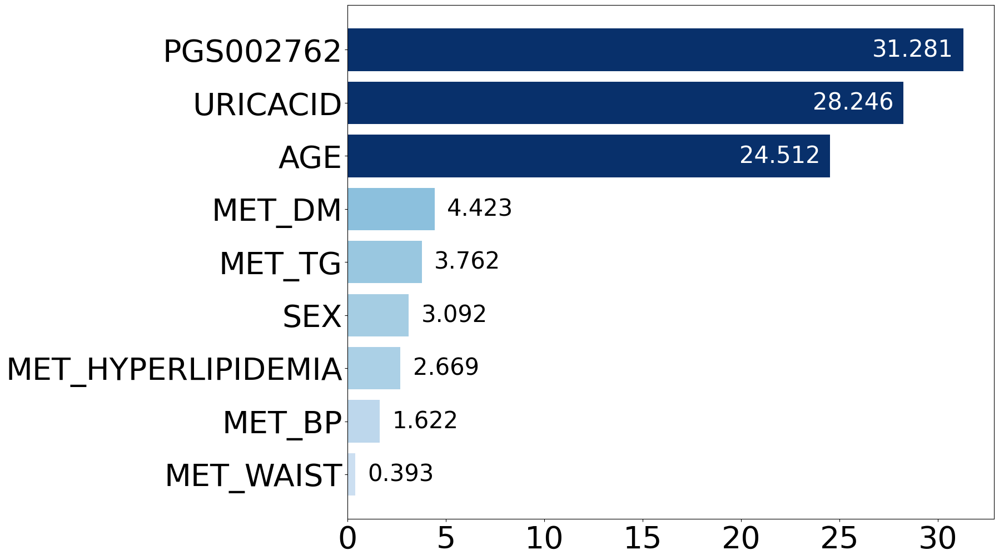

In [57]:
exp10_lgbm_impsum_df3 = FeatureImportancePlot(scale_exp10_lgbm_importances3, exp10_column_list3, "Blues", 0.05) #importances[i] + 4

#### ROC curve

In [90]:
exp10_lr_avg_ROC3 = Average_ROC(exp10_lr_true_df3, exp10_lr_prob_df3, exp10_lr_auc_df3, "LR")
exp10_rf_avg_ROC3 = Average_ROC(exp10_rf_true_df3, exp10_rf_prob_df3, exp10_rf_auc_df3, "RF")
exp10_dt_avg_ROC3 = Average_ROC(exp10_dt_true_df3, exp10_dt_prob_df3, exp10_dt_auc_df3, "DT")
exp10_xgb_avg_ROC3 = Average_ROC(exp10_xgb_true_df3, exp10_xgb_prob_df3, exp10_xgb_auc_df3, "XGB")
exp10_lgbm_avg_ROC3 = Average_ROC(exp10_lgbm_true_df3, exp10_lgbm_prob_df3, exp10_lgbm_auc_df3, "LGBM")

exp10_base_fpr_list3 = [exp10_lr_avg_ROC3[0], exp10_rf_avg_ROC3[0], exp10_dt_avg_ROC3[0], exp10_xgb_avg_ROC3[0], exp10_lgbm_avg_ROC3[0]]
exp10_mean_tprs_list3 = [exp10_lr_avg_ROC3[1], exp10_rf_avg_ROC3[1], exp10_dt_avg_ROC3[1], exp10_xgb_avg_ROC3[1], exp10_lgbm_avg_ROC3[1]]
exp10_tprs_lower_list3 = [exp10_lr_avg_ROC3[2], exp10_rf_avg_ROC3[2], exp10_dt_avg_ROC3[2], exp10_xgb_avg_ROC3[2], exp10_lgbm_avg_ROC3[2]]
exp10_tprs_upper_list3 = [exp10_lr_avg_ROC3[3], exp10_rf_avg_ROC3[3], exp10_dt_avg_ROC3[3], exp10_xgb_avg_ROC3[3], exp10_lgbm_avg_ROC3[3]]
exp10_legend_auc_list3 = [exp10_lr_avg_ROC3[4], exp10_rf_avg_ROC3[4], exp10_dt_avg_ROC3[4], exp10_xgb_avg_ROC3[4], exp10_lgbm_avg_ROC3[4]]

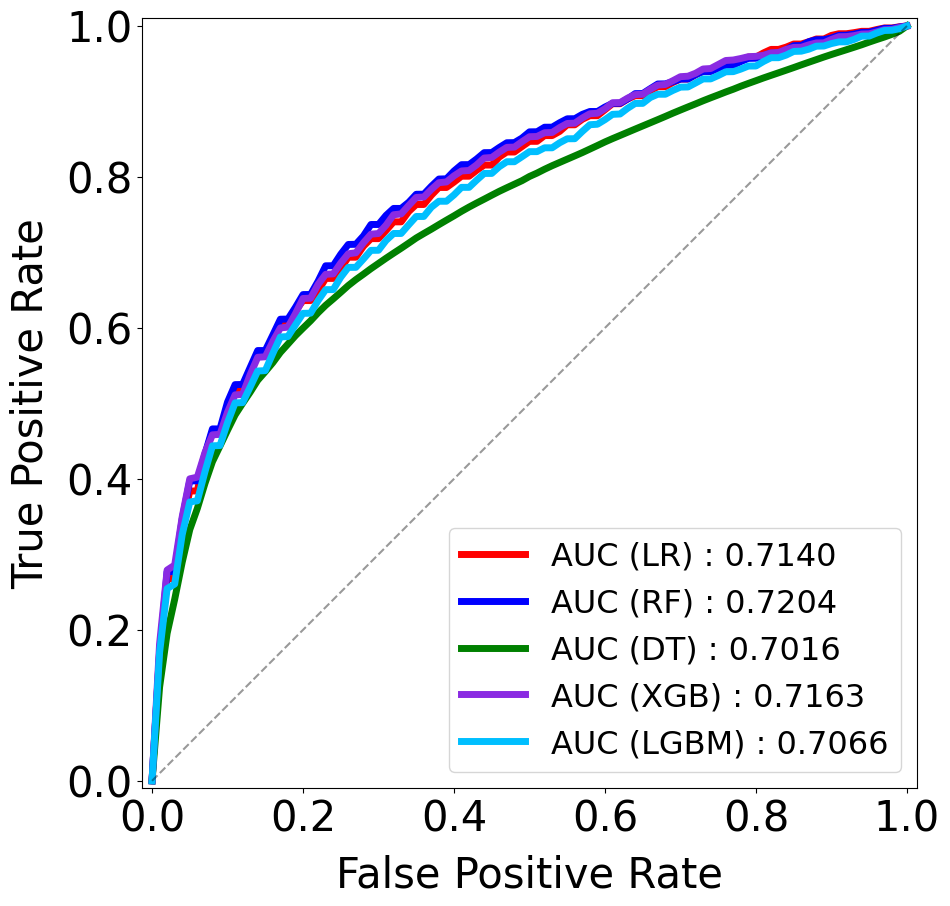

In [91]:
ROC_All_Curve(exp10_base_fpr_list3, exp10_mean_tprs_list3, exp10_tprs_lower_list3, exp10_tprs_upper_list3, exp10_legend_auc_list3)

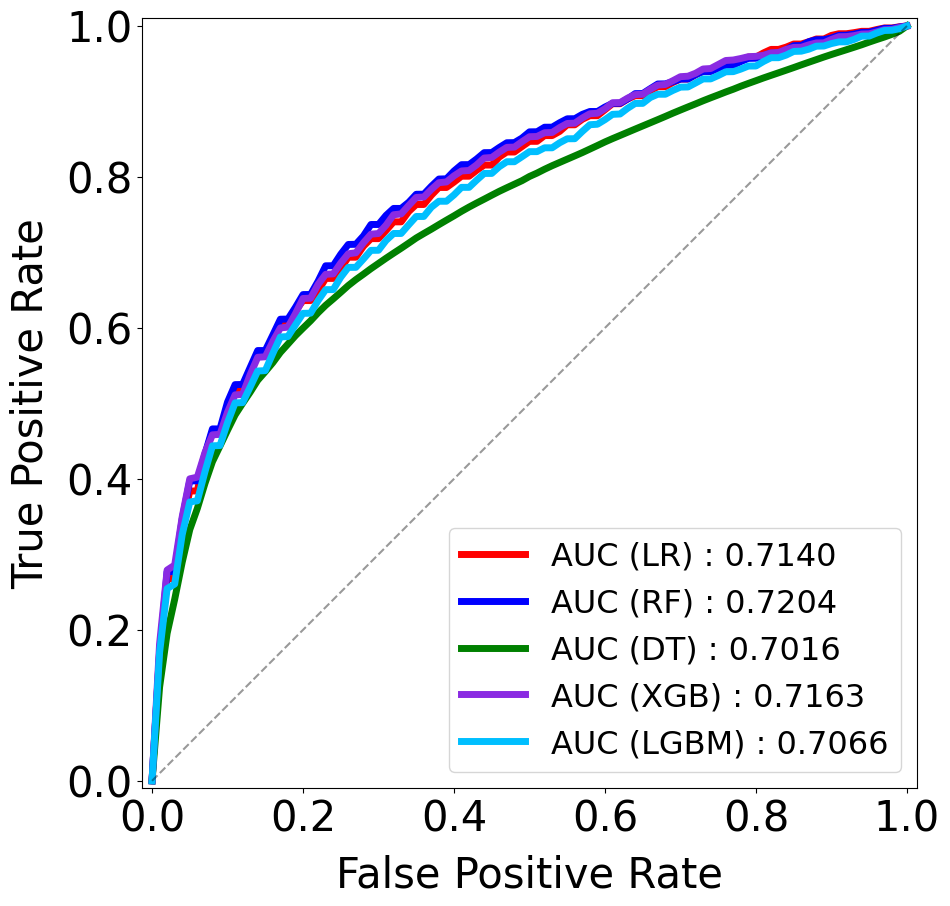

In [17]:
# PDF 저장 시 텍스트를 폰트(텍스트 객체)로 저장
mpl.rcParams['pdf.fonttype'] = 42  # Type 42: TrueType 폰트 (글자 그대로 저장됨)
mpl.rcParams['ps.fonttype'] = 42   # PS 저장 시에도 동일하게

color_list = ["r", "b", "green", "blueviolet", "deepskyblue"] # LR, RF, DT, XGB, LGBM 순서

plt.figure(figsize=(10, 10))
plt.axes().set_aspect('equal', 'datalim')

for i in range(len(exp10_mean_tprs_list3)):
    plt.plot(exp10_base_fpr_list3[i], exp10_mean_tprs_list3[i], color_list[i], linewidth = 5, label = exp10_legend_auc_list3[i])

plt.plot([0, 1], [0, 1],'k--', alpha = 0.4) # abline
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylabel('True Positive Rate', fontsize = 30, labelpad = 10)
plt.xlabel('False Positive Rate', fontsize = 30, labelpad = 10)
plt.legend(loc = "lower right", fontsize = 23)

plt.savefig("./output_file/Figure/ML_AGE_SEX_MetS_PRS_UA_AUC.pdf", format="pdf", bbox_inches='tight')
plt.show()

## 각 PRS Logistic 결과

In [31]:
np.mean(exp3_lr_auc_df3_2) # PGS002762

0.6223376623376623

In [46]:
np.mean(exp3_lr_auc_df3_2a) # PGS000711

0.6015115440115439

In [33]:
np.mean(exp3_lr_auc_df3_2b) # PGS001248

0.5930266955266955

In [34]:
np.mean(exp3_lr_auc_df3_2c) # PGS001822

0.5792352092352092

In [35]:
np.mean(exp3_lr_auc_df3_2d) # PGS002030

0.5749531024531026

In [36]:
np.mean(exp3_lr_auc_df3_2e) # PGS003329

0.5774603174603175

In [37]:
np.mean(exp3_lr_auc_df3_2f) # Finngen M13 GOUT

0.5536147186147187

In [38]:
np.mean(exp3_lr_auc_df3_2g) # CKDGen

0.5735173160173159

In [39]:
np.mean(exp3_lr_auc_df3_2h) # CER

0.5635714285714286

## Figure 용 변수 저장

In [13]:
save_exp12_df2 = pd.concat([exp12_lr_auc_df2, exp12_rf_auc_df2, exp12_dt_auc_df2, exp12_xgb_auc_df2, exp12_lgbm_auc_df2], axis = 0)
save_exp12_df2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp12_df2.to_csv("./output_file/KoGES_Modeling_AUC_UA.csv", index = True)

In [14]:
save_exp1_df2 = pd.concat([exp1_lr_auc_df2, exp1_rf_auc_df2, exp1_dt_auc_df2, exp1_xgb_auc_df2, exp1_lgbm_auc_df2], axis = 0)
save_exp1_df2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp1_df2.to_csv("./output_file/KoGES_Modeling_AUC_Lifestyle.csv", index = True)

In [15]:
save_exp6_df2 = pd.concat([exp6_lr_auc_df2, exp6_rf_auc_df2, exp6_dt_auc_df2, exp6_xgb_auc_df2, exp6_lgbm_auc_df2], axis = 0)
save_exp6_df2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp6_df2.to_csv("./output_file/KoGES_Modeling_AUC_LifestyleUA.csv", index = True)

In [16]:
save_exp2_df2 = pd.concat([exp2_lr_auc_df2, exp2_rf_auc_df2, exp2_dt_auc_df2, exp2_xgb_auc_df2, exp2_lgbm_auc_df2], axis = 0)
save_exp2_df2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp2_df2.to_csv("./output_file/KoGES_Modeling_AUC_MetSyn.csv", index = True)

In [17]:
save_exp7_df2 = pd.concat([exp7_lr_auc_df2, exp7_rf_auc_df2, exp7_dt_auc_df2, exp7_xgb_auc_df2, exp7_lgbm_auc_df2], axis = 0)
save_exp7_df2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp7_df2.to_csv("./output_file/KoGES_Modeling_AUC_MetSynUA.csv", index = True)

In [18]:
save_exp3_df3_2 = pd.concat([exp3_lr_auc_df3_2, exp3_rf_auc_df3_2, exp3_dt_auc_df3_2, exp3_xgb_auc_df3_2, exp3_lgbm_auc_df3_2], axis = 0)
save_exp3_df3_2.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp3_df3_2.to_csv("./output_file/KoGES_Modeling_AUC_PRS.csv", index = True)

In [19]:
save_exp4_df3 = pd.concat([exp4_lr_auc_df3, exp4_rf_auc_df3, exp4_dt_auc_df3, exp4_xgb_auc_df3, exp4_lgbm_auc_df3], axis = 0)
save_exp4_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp4_df3.to_csv("./output_file/KoGES_Modeling_AUC_LifestylePRS.csv", index = True)

In [20]:
save_exp5_df3 = pd.concat([exp5_lr_auc_df3, exp5_rf_auc_df3, exp5_dt_auc_df3, exp5_xgb_auc_df3, exp5_lgbm_auc_df3], axis = 0)
save_exp5_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp5_df3.to_csv("./output_file/KoGES_Modeling_AUC_MetSynPRS.csv", index = True)

In [5]:
save_exp8_df3 = pd.concat([exp8_lr_auc_df3, exp8_rf_auc_df3, exp8_dt_auc_df3, exp8_xgb_auc_df3, exp8_lgbm_auc_df3], axis = 0)
save_exp8_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp8_df3.to_csv("./output_file/KoGES_Modeling_AUC_UAPRS.csv", index = True)

In [120]:
save_exp3_df3 = pd.concat([exp3_lr_auc_df3, exp3_rf_auc_df3, exp3_dt_auc_df3, exp3_xgb_auc_df3, exp3_lgbm_auc_df3], axis = 0)
save_exp3_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp3_df3.to_csv("./output_file/KoGES_Modeling_AUC_AS_PRS.csv", index = True)

In [121]:
save_exp9_df3 = pd.concat([exp9_lr_auc_df3, exp9_rf_auc_df3, exp9_dt_auc_df3, exp9_xgb_auc_df3, exp9_lgbm_auc_df3], axis = 0)
save_exp9_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp9_df3.to_csv("./output_file/KoGES_Modeling_AUC_LifestylePRSUA.csv", index = True)

In [122]:
save_exp10_df3 = pd.concat([exp10_lr_auc_df3, exp10_rf_auc_df3, exp10_dt_auc_df3, exp10_xgb_auc_df3, exp10_lgbm_auc_df3], axis = 0)
save_exp10_df3.index = ["LR", "RF", "DT", "XGB", "LGBM"]

save_exp10_df3.to_csv("./output_file/KoGES_Modeling_AUC_MetSynPRSUA.csv", index = True)

In [128]:
# Sample population table만들 train, test index 뽑기
for seed in seed_list[:1]:
    DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(exp1_2_KoGES, nGt_sampling_size, seed)
    print(DS_TEST.index)

Index([  538,   606,   560,   203,    18,   390,   522,    84,   180,   515,
       ...
       37988, 24571, 42435, 32416, 31658,  1200,  2669, 14790,  6263, 17204],
      dtype='int64', length=129)


In [148]:
# Sample population table만들 train, test index 뽑기
DownSample_idx = []

for seed in seed_list:
    DS_TRAIN, DS_TEST = DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER(exp3_2_KoGES, nGt_sampling_size, seed)
    Train_idx = DS_TRAIN.index.tolist()
    Test_idx = DS_TEST.index.tolist()
    DS_idx = Train_idx + Test_idx
    DownSample_idx.append(DS_idx)

# print(len(DownSample_idx))

save_DSidx_df = pd.DataFrame(DownSample_idx) + 1
save_DSidx_df = save_DSidx_df.transpose()
save_DSidx_df.to_csv("./output_file/KoGES_DownSample_index.csv", index = False)

In [153]:
exp3_rf_pred_df3.shape[0]

129

In [161]:
import scipy
from scipy import stats
from scipy.stats import t

In [210]:
# AUC CI 구하기

def Confidence_interval(DataFrame, confidence = 0.95):
    n = 100 # iteration 수 / DataFrame.shape[1]
    dof = n - 1

    auc_mean = np.mean(DataFrame, axis = 1)
    auc_std_err = stats.sem(DataFrame, axis = 1)

    CI = t.interval(confidence, dof, loc = auc_mean, scale = auc_std_err)
    lower_CI = CI[0].tolist()
    higher_CI = CI[1].tolist()

    output_CI = auc_mean.tolist() + lower_CI + higher_CI
    
    return output_CI

In [216]:
exp3_lr_CI_3 = Confidence_interval(exp3_lr_auc_df3)
exp3_rf_CI_3 = Confidence_interval(exp3_rf_auc_df3)
exp3_dt_CI_3 = Confidence_interval(exp3_dt_auc_df3)
exp3_xgb_CI_3 = Confidence_interval(exp3_xgb_auc_df3)
exp3_lgbm_CI_3 = Confidence_interval(exp3_lgbm_auc_df3)

print(exp3_lr_CI_3, exp3_rf_CI_3, exp3_dt_CI_3, exp3_xgb_CI_3, exp3_lgbm_CI_3)

[0.6434126984126983, 0.6353827307353255, 0.6514426660900712] [0.6342784992784992, 0.6256166188734087, 0.6429403796835897] [0.619556277056277, 0.6114335451862057, 0.6276790089263483] [0.6269805194805195, 0.618823399760504, 0.6351376392005349] [0.6056204906204906, 0.5966538581147054, 0.6145871231262758]


In [211]:
exp3_lr_CI_3_2 = Confidence_interval(exp3_lr_auc_df3_2)
exp3_rf_CI_3_2 = Confidence_interval(exp3_rf_auc_df3_2)
exp3_dt_CI_3_2 = Confidence_interval(exp3_dt_auc_df3_2)
exp3_xgb_CI_3_2 = Confidence_interval(exp3_xgb_auc_df3_2)
exp3_lgbm_CI_3_2 = Confidence_interval(exp3_lgbm_auc_df3_2)

print(exp3_lr_CI_3_2, exp3_rf_CI_3_2, exp3_dt_CI_3_2, exp3_xgb_CI_3_2, exp3_lgbm_CI_3_2)

[0.6223376623376623, 0.6139672406770321, 0.6307080839982925] [0.6177417027417027, 0.6099265201608841, 0.6255568853225213] [0.6128391053391052, 0.60481134950855, 0.6208668611696605] [0.6211688311688311, 0.613341205010347, 0.6289964573273154] [0.5886471861471861, 0.5804096590638086, 0.5968847132305637]


In [217]:
exp4_lr_CI_3 = Confidence_interval(exp4_lr_auc_df3)
exp4_rf_CI_3 = Confidence_interval(exp4_rf_auc_df3)
exp4_dt_CI_3 = Confidence_interval(exp4_dt_auc_df3)
exp4_xgb_CI_3 = Confidence_interval(exp4_xgb_auc_df3)
exp4_lgbm_CI_3 = Confidence_interval(exp4_lgbm_auc_df3)

print(exp4_lr_CI_3, exp4_rf_CI_3, exp4_dt_CI_3, exp4_xgb_CI_3, exp4_lgbm_CI_3)

[0.654011544011544, 0.6459898159740834, 0.6620332720490046] [0.643961038961039, 0.636382502230258, 0.6515395756918199] [0.6181890331890332, 0.610023420358013, 0.6263546460200533] [0.6383116883116884, 0.6304766621690671, 0.6461467144543097] [0.6193073593073594, 0.6099797916012366, 0.6286349270134821]


In [218]:
exp5_lr_CI_3 = Confidence_interval(exp5_lr_auc_df3)
exp5_rf_CI_3 = Confidence_interval(exp5_rf_auc_df3)
exp5_dt_CI_3 = Confidence_interval(exp5_dt_auc_df3)
exp5_xgb_CI_3 = Confidence_interval(exp5_xgb_auc_df3)
exp5_lgbm_CI_3 = Confidence_interval(exp5_lgbm_auc_df3)

print(exp5_lr_CI_3, exp5_rf_CI_3, exp5_dt_CI_3, exp5_xgb_CI_3, exp5_lgbm_CI_3)

[0.6636976911976913, 0.655199398352139, 0.6721959840432435] [0.6517460317460317, 0.6434532892503787, 0.6600387742416848] [0.6280772005772005, 0.6200517198538639, 0.6361026813005372] [0.647564935064935, 0.6395501219782015, 0.6555797481516684] [0.628982683982684, 0.6209095906196522, 0.6370557773457157]


In [219]:
exp9_lr_CI_3 = Confidence_interval(exp9_lr_auc_df3)
exp9_rf_CI_3 = Confidence_interval(exp9_rf_auc_df3)
exp9_dt_CI_3 = Confidence_interval(exp9_dt_auc_df3)
exp9_xgb_CI_3 = Confidence_interval(exp9_xgb_auc_df3)
exp9_lgbm_CI_3 = Confidence_interval(exp9_lgbm_auc_df3)

print(exp9_lr_CI_3, exp9_rf_CI_3, exp9_dt_CI_3, exp9_xgb_CI_3, exp9_lgbm_CI_3)

[0.7128174603174603, 0.7057934515562196, 0.719841469078701] [0.7178499278499278, 0.7101895716546882, 0.7255102840451675] [0.6991666666666668, 0.692266043048415, 0.7060672902849187] [0.7135750360750361, 0.7059122468226967, 0.7212378253273756] [0.702056277056277, 0.693863545385554, 0.7102490087270001]


In [220]:
exp10_lr_CI_3 = Confidence_interval(exp10_lr_auc_df3)
exp10_rf_CI_3 = Confidence_interval(exp10_rf_auc_df3)
exp10_dt_CI_3 = Confidence_interval(exp10_dt_auc_df3)
exp10_xgb_CI_3 = Confidence_interval(exp10_xgb_auc_df3)
exp10_lgbm_CI_3 = Confidence_interval(exp10_lgbm_auc_df3)

print(exp10_lr_CI_3, exp10_rf_CI_3, exp10_dt_CI_3, exp10_xgb_CI_3, exp10_lgbm_CI_3)

[0.7139862914862917, 0.7066789095741922, 0.7212936733983911] [0.7203968253968253, 0.7124343243291772, 0.7283593264644733] [0.7015800865800866, 0.6944742473612051, 0.7086859257989682] [0.7163492063492065, 0.7085756220294229, 0.7241227906689901] [0.7066341991341993, 0.6985062492527873, 0.7147621490156114]


# 변수 저장

In [97]:
%whos

Variable                                   Type              Data/Info
----------------------------------------------------------------------
Average_ROC                                function          <function Average_ROC at 0x7f80248f9dc0>
Calculate_metrics                          function          <function Calculate_metrics at 0x7f802c0cfee0>
Confidence_interval                        function          <function Confidence_interval at 0x7f801e3830d0>
DOWNSAMPLING_and_TRAIN_TEST_SPLIT_GENDER   function          <function DOWNSAMPLING_an<...>GENDER at 0x7f802c0cfd30>
DS_TEST                                    DataFrame                DISEASE  AGE  SEX <...>\n[129 rows x 12 columns]
DS_TRAIN                                   DataFrame                DISEASE  AGE  SEX <...>n[1138 rows x 12 columns]
DS_idx                                     list              n=1267
DecisionTreeClassifier                     ABCMeta           <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
Do

In [8]:
dill.dump_session('./KoGES_Gout_Modeling_AfImp_env_chg.db')

In [63]:
PRS_importances_df = pd.DataFrame(exp3_rf_importances2) # "PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329", "Finngen_M13_GOUT", "CKDGen", "CER"
PRS_importances_df.columns = ["AGE", "SEX", "PGS000711", "PGS001248", "PGS001822", "PGS002030", "PGS002762", "PGS003329", "Finngen_M13_GOUT", "CKDGen", "CER"]
print("MEAN : ", PRS_importances_df.mean())
print("SUM : ", PRS_importances_df.sum())

MEAN :  AGE                 0.136204
SEX                 0.009784
PGS000711           0.134823
PGS001248           0.105870
PGS001822           0.077465
PGS002030           0.072474
PGS002762           0.216475
PGS003329           0.073113
Finngen_M13_GOUT    0.061914
CKDGen              0.062140
CER                 0.049736
dtype: float64
SUM :  AGE                 13.620401
SEX                  0.978412
PGS000711           13.482323
PGS001248           10.587043
PGS001822            7.746542
PGS002030            7.247414
PGS002762           21.647496
PGS003329            7.311340
Finngen_M13_GOUT     6.191424
CKDGen               6.214011
CER                  4.973594
dtype: float64
